## *Answer 1*

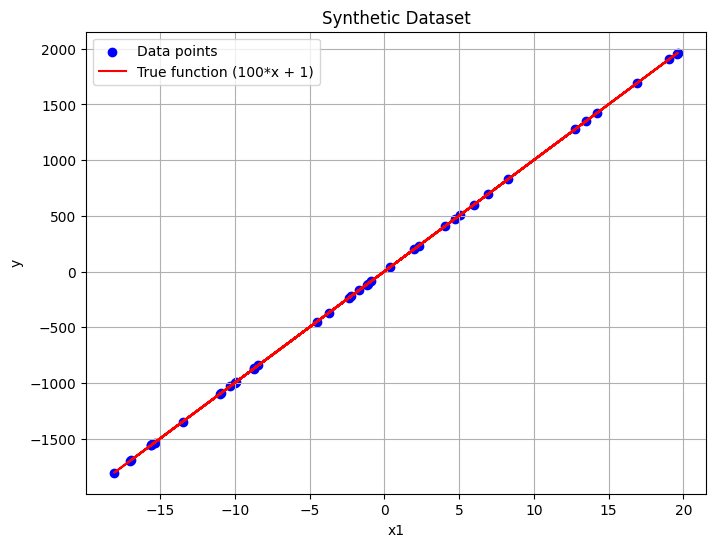

In [86]:
import numpy as np
import matplotlib.pyplot as plt

# --- Data generation ---
num_samples = 40
np.random.seed(45)
x1 = np.random.uniform(-20, 20, num_samples)
f_x = 100 * x1 + 1
eps = np.random.randn(num_samples)
y = f_x + eps

# --- Plotting ---
plt.figure(figsize=(8, 6))
plt.scatter(x1, y, color='blue', label='Data points')
plt.plot(x1, f_x, color='red', label='True function (100*x + 1)')
plt.xlabel('x1')
plt.ylabel('y')
plt.title('Synthetic Dataset')
plt.legend()
plt.grid(True)
plt.show()

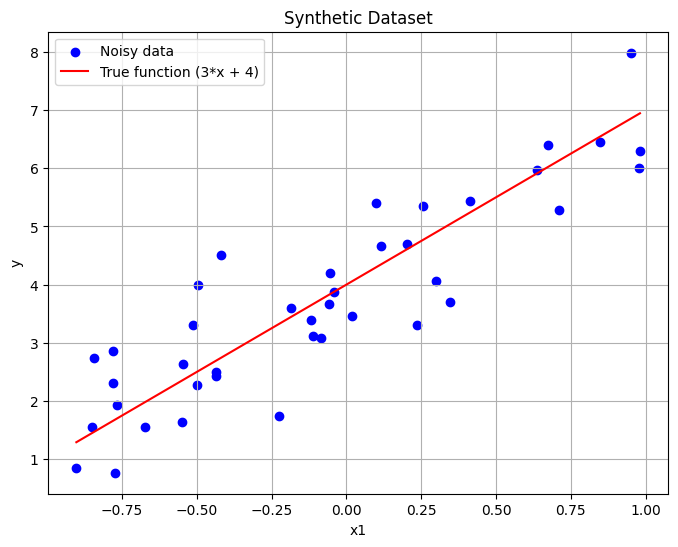

In [87]:
import numpy as np
import matplotlib.pyplot as plt

# --- Data generation ---
np.random.seed(45)
num_samples = 40

x1 = np.random.uniform(-1, 1, num_samples)
f_x = 3 * x1 + 4
eps = np.random.randn(num_samples)
y = f_x + eps

# --- Plotting ---
plt.figure(figsize=(8, 6))
plt.scatter(x1, y, color='blue', label='Noisy data')
plt.plot(np.sort(x1), np.sort(f_x), color='red', label='True function (3*x + 4)')
plt.xlabel('x1')
plt.ylabel('y')
plt.title('Synthetic Dataset')
plt.legend()
plt.grid(True)
plt.show()


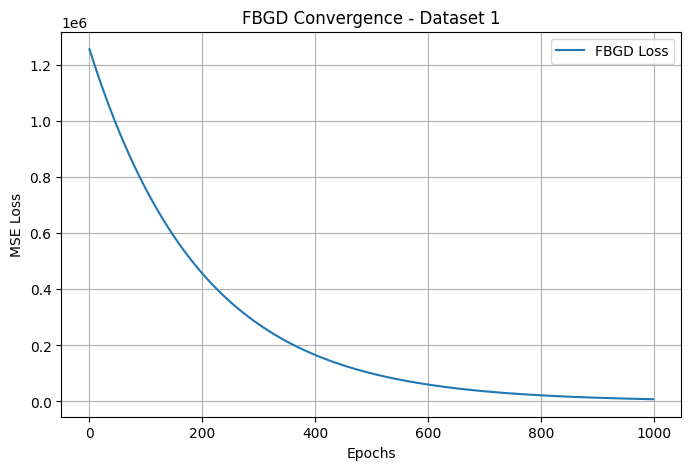

In [90]:
import numpy as np
import matplotlib.pyplot as plt

# --- Dataset 1 ---
np.random.seed(45)
num_samples = 40
x1 = np.random.uniform(-20, 20, num_samples)
f_x = 100 * x1 + 1
eps = np.random.randn(num_samples)
y = f_x + eps

X = np.vstack((np.ones(num_samples), x1)).T
theta_star = np.linalg.inv(X.T @ X) @ (X.T @ y)

# --- FBGD ---
theta = np.zeros(2)
lr = 1e-5
epsilon = 0.001
max_epochs = 1000
losses = []

for epoch in range(max_epochs):
    y_pred = X @ theta
    grad = (2/num_samples) * X.T @ (y_pred - y)
    theta = theta - lr * grad
    losses.append(np.mean((y - X @ theta)**2))

    if np.linalg.norm(theta - theta_star) < epsilon:
        print(f'FBGD converged in {epoch+1} epochs, {epoch+1} steps')
        break

plt.figure(figsize=(8,5))
plt.plot(losses, label='FBGD Loss')
plt.xlabel('Epochs')
plt.ylabel('MSE Loss')
plt.title('FBGD Convergence - Dataset 1')
plt.grid(True)
plt.legend()
plt.show()


In [93]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
import uuid

# Set random seed for reproducibility
np.random.seed(45)
num_samples = 40

# Dataset 1
x1 = np.random.uniform(-20, 20, num_samples)
f_x1 = 100 * x1 + 1
eps1 = np.random.randn(num_samples)
y1 = f_x1 + eps1
X1 = np.column_stack([np.ones_like(x1), x1])
theta_star1 = np.array([1.0, 100.0])  # [intercept, slope]

# Dataset 2
x2 = np.random.uniform(-1, 1, num_samples)
f_x2 = 3 * x2 + 4
eps2 = np.random.randn(num_samples)
y2 = f_x2 + eps2
X2 = np.column_stack([np.ones_like(x2), x2])
theta_star2 = np.array([4.0, 3.0])  # [intercept, slope]

# Helper functions (Appendix)
def compute_loss(theta, X, y):
    """Compute mean squared error loss."""
    predictions = X @ theta
    return np.mean((y - predictions) ** 2)

def compute_gradient(theta, X, y):
    """Compute gradient of MSE loss."""
    predictions = X @ theta
    errors = predictions - y
    return (2 / len(y)) * (X.T @ errors)

# Optimization methods
def gradient_descent(X, y, theta_init, lr, theta_star, epsilon=0.001, max_iterations=10000):
    """Full-batch gradient descent."""
    theta = theta_init.copy()
    theta_history = [theta.copy()]
    losses = [compute_loss(theta, X, y)]
    iterations = 0

    while iterations < max_iterations:
        grad = compute_gradient(theta, X, y)
        theta -= lr * grad
        theta_history.append(theta.copy())
        losses.append(compute_loss(theta, X, y))
        iterations += 1
        if np.linalg.norm(theta - theta_star) < epsilon:
            break

    return theta, iterations, np.array(theta_history), np.array(losses)

def stochastic_gradient_descent(X, y, theta_init, lr, theta_star, epsilon=0.001, max_iterations=10000):
    """Stochastic gradient descent (per-sample)."""
    theta = theta_init.copy()
    theta_history = [theta.copy()]
    losses = [compute_loss(theta, X, y)]
    iterations = 0
    n = len(y)

    while iterations < max_iterations:
        idx = np.random.randint(0, n)
        x_i = X[idx:idx+1]
        y_i = y[idx:idx+1]
        grad = compute_gradient(theta, x_i, y_i)
        theta -= lr * grad
        theta_history.append(theta.copy())
        losses.append(compute_loss(theta, X, y))
        iterations += 1
        if np.linalg.norm(theta - theta_star) < epsilon:
            break

    return theta, iterations, np.array(theta_history), np.array(losses)

def gradient_descent_momentum(X, y, theta_init, lr, theta_star, gamma=0.9, epsilon=0.001, max_iterations=10000):
    """Gradient descent with momentum."""
    theta = theta_init.copy()
    theta_history = [theta.copy()]
    losses = [compute_loss(theta, X, y)]
    velocity = np.zeros_like(theta)
    gradients = []
    velocities = []
    iterations = 0

    while iterations < max_iterations:
        grad = compute_gradient(theta, X, y)
        velocity = gamma * velocity + lr * grad
        theta -= velocity
        theta_history.append(theta.copy())
        losses.append(compute_loss(theta, X, y))
        gradients.append(grad.copy())
        velocities.append(velocity.copy())
        iterations += 1
        if np.linalg.norm(theta - theta_star) < epsilon:
            break

    return theta, iterations, np.array(theta_history), np.array(losses), np.array(gradients), np.array(velocities)

# Experiment protocol: Average steps over 10 runs
num_trials = 10
gd_steps1, sgd_steps1, mom_steps1 = [], [], []
gd_steps2, sgd_steps2, mom_steps2 = [], [], []

for _ in range(num_trials):
    # Random initial parameters
    theta_init1 = np.random.uniform(-10, 10, 2)  # Adjusted for Dataset 1 scale
    theta_init2 = np.random.uniform(-1, 1, 2)   # Adjusted for Dataset 2 scale

    # Dataset 1
    _, steps_gd1, _, _ = gradient_descent(X1, y1, theta_init1, lr=0.01, theta_star=theta_star1)
    _, steps_sgd1, _, _ = stochastic_gradient_descent(X1, y1, theta_init1, lr=0.001, theta_star=theta_star1)
    _, steps_mom1, _, _, _, _ = gradient_descent_momentum(X1, y1, theta_init1, lr=0.01, theta_star=theta_star1, gamma=0.9)
    gd_steps1.append(steps_gd1)
    sgd_steps1.append(steps_sgd1)
    mom_steps1.append(steps_mom1)

    # Dataset 2
    _, steps_gd2, _, _ = gradient_descent(X1, y1, theta_init2, lr=0.01, theta_star=theta_star2)
    _, steps_sgd2, _, _ = stochastic_gradient_descent(X2, y2, theta_init2, lr=0.001, theta_star=theta_star2)
    _, steps_mom2, _, _, _, _ = gradient_descent_momentum(X2, y2, theta_init2, lr=0.01, theta_star=theta_star2, gamma=0.9)
    gd_steps2.append(steps_gd2)
    sgd_steps2.append(steps_sgd2)
    mom_steps2.append(steps_mom2)

# Compute averages
avg_gd_steps1 = np.mean(gd_steps1)
avg_sgd_steps1 = np.mean(sgd_steps1)
avg_mom_steps1 = np.mean(mom_steps1)
avg_gd_steps2 = np.mean(gd_steps2)
avg_sgd_steps2 = np.mean(sgd_steps2)
avg_mom_steps2 = np.mean(mom_steps2)

# Run one trial for visualization (15 epochs)
theta_init1 = np.random.uniform(-10, 10, 2)
theta_init2 = np.random.uniform(-1, 1, 2)

# Dataset 1
_, _, gd_theta1, gd_losses1 = gradient_descent(X1, y1, theta_init1, lr=0.01, theta_star=theta_star1, max_iterations=15)
_, _, sgd_theta1, sgd_losses1 = stochastic_gradient_descent(X1, y1, theta_init1, lr=0.001, theta_star=theta_star1, max_iterations=15)
_, _, mom_theta1, mom_losses1, mom_grads1, mom_vels1 = gradient_descent_momentum(X1, y1, theta_init1, lr=0.01, theta_star=theta_star1, gamma=0.9, max_iterations=15)

# Dataset 2
_, _, gd_theta2, gd_losses2 = gradient_descent(X2, y2, theta_init2, lr=0.01, theta_star=theta_star2, max_iterations=15)
_, _, sgd_theta2, sgd_losses2 = stochastic_gradient_descent(X2, y2, theta_init2, lr=0.001, theta_star=theta_star2, max_iterations=15)
_, _, mom_theta2, mom_losses2, mom_grads2, mom_vels2 = gradient_descent_momentum(X2, y2, theta_init2, lr=0.01, theta_star=theta_star2, gamma=0.9, max_iterations=15)

# Contour plot setup
def plot_contours(X, y, theta_history, theta_star, gradients=None, velocities=None, dataset_name="", filename="contour"):
    theta0_range = np.linspace(theta_star[0] - 5, theta_star[0] + 5, 100)
    theta1_range = np.linspace(theta_star[1] - 50 if dataset_name == "Dataset 1" else theta_star[1] - 2,
                              theta_star[1] + 50 if dataset_name == "Dataset 1" else theta_star[1] + 2, 100)
    Theta0, Theta1 = np.meshgrid(theta0_range, theta1_range)
    Loss = np.zeros_like(Theta0)

    for i in range(Theta0.shape[0]):
        for j in range(Theta0.shape[1]):
            theta = np.array([Theta0[i, j], Theta1[i, j]])
            Loss[i, j] = compute_loss(theta, X, y)

    epochs_to_plot = [0, 5, 10, 14]
    fig, axes = plt.subplots(2, 2, figsize=(12, 10))
    axes = axes.flatten()

    for idx, epoch in enumerate(epochs_to_plot):
        ax = axes[idx]
        ax.contour(Theta0, Theta1, Loss, levels=20, cmap=cm.viridis)
        ax.plot(theta_history[:epoch+1, 0], theta_history[:epoch+1, 1], 'ro-', label='Path')
        ax.plot(theta_star[0], theta_star[1], 'g*', markersize=15, label='True θ*')
        if gradients is not None and velocities is not None and epoch < len(gradients):
            # Plot gradient and velocity vectors at current point
            current_theta = theta_history[epoch]
            grad = gradients[epoch]
            vel = velocities[epoch]
            ax.arrow(current_theta[0], current_theta[1], -grad[0]*0.1, -grad[1]*0.1, color='blue', width=0.05, label='Gradient')
            ax.arrow(current_theta[0], current_theta[1], -vel[0]*0.1, -vel[1]*0.1, color='purple', width=0.05, label='Velocity')
        ax.set_title(f'{dataset_name}, Epoch {epoch}')
        ax.set_xlabel('θ0 (Intercept)')
        ax.set_ylabel('θ1 (Slope)')
        ax.legend()

    plt.tight_layout()
    plt.savefig(f'{filename}.png')
    plt.close()

# Generate contour plots
plot_contours(X1, y1, gd_theta1, theta_star1, dataset_name="Dataset 1 GD", filename="contour_gd_d1")
plot_contours(X1, y1, sgd_theta1, theta_star1, dataset_name="Dataset 1 SGD", filename="contour_sgd_d1")
plot_contours(X1, y1, mom_theta1, theta_star1, mom_grads1, mom_vels1, dataset_name="Dataset 1 Momentum", filename="contour_mom_d1")
plot_contours(X2, y2, gd_theta2, theta_star2, dataset_name="Dataset 2 GD", filename="contour_gd_d2")
plot_contours(X2, y2, sgd_theta2, theta_star2, dataset_name="Dataset 2 SGD", filename="contour_sgd_d2")
plot_contours(X2, y2, mom_theta2, theta_star2, mom_grads2, mom_vels2, dataset_name="Dataset 2 Momentum", filename="contour_mom_d2")

# Loss vs epochs plot
plt.figure(figsize=(10, 6))
plt.plot(range(len(gd_losses1)), gd_losses1, label='GD Dataset 1', color='red')
plt.plot(range(len(sgd_losses1)), sgd_losses1, label='SGD Dataset 1', color='blue')
plt.plot(range(len(mom_losses1)), mom_losses1, label='Momentum Dataset 1', color='purple')
plt.plot(range(len(gd_losses2)), gd_losses2, label='GD Dataset 2', linestyle='--', color='red')
plt.plot(range(len(sgd_losses2)), sgd_losses2, label='SGD Dataset 2', linestyle='--', color='blue')
plt.plot(range(len(mom_losses2)), mom_losses2, label='Momentum Dataset 2', linestyle='--', color='purple')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Loss vs Epochs for All Methods and Datasets')
plt.legend()
plt.grid(True)
plt.savefig('loss_vs_epochs.png')
plt.close()

# Results
print("Average steps to convergence (Dataset 1):")
print(f"  GD: {avg_gd_steps1:.2f}")
print(f"  SGD: {avg_sgd_steps1:.2f}")
print(f"  Momentum: {avg_mom_steps1:.2f}")
print("Average steps to convergence (Dataset 2):")
print(f"  GD: {avg_gd_steps2:.2f}")
print(f"  SGD: {avg_sgd_steps2:.2f}")
print(f"  Momentum: {avg_mom_steps2:.2f}")

# How to run
print("\nHow to run:")
print("1. Ensure NumPy and Matplotlib are installed: `pip install numpy matplotlib`")
print("2. Save this script as `gradient_descent_momentum.py`.")
print("3. Run the script: `python gradient_descent_momentum.py`")
print("4. Outputs: contour plots (`contour_*.png`), loss plot (`loss_vs_epochs.png`), and console output of average steps.")

# Animation instructions
print("\nTo create an animation/GIF for contour plots:")
print("1. Modify the `plot_contours` function to save individual epoch plots (e.g., `contour_gd_d1_epoch_{epoch}.png`).")
print("2. Use `imageio` to combine images into a GIF.")
print("Example code:")
print("""
import imageio
images = []
for epoch in range(15):
    # Generate and save contour plot for each epoch
    images.append(imageio.imread(f'contour_mom_d1_epoch_{epoch}.png'))
imageio.mimsave('convergence_mom_d1.gif', images, duration=0.5)
""")

/usr/local/lib/python3.12/dist-packages/numpy/_core/_methods.py:127: RuntimeWarning: overflow encountered in reduce
  ret = umr_sum(arr, axis, dtype, out, keepdims, where=where)
/tmp/ipython-input-1483159838.py:30: RuntimeWarning: overflow encountered in square
  return np.mean((y - predictions) ** 2)
/tmp/ipython-input-1483159838.py:36: RuntimeWarning: overflow encountered in matmul
  return (2 / len(y)) * (X.T @ errors)
/tmp/ipython-input-1483159838.py:36: RuntimeWarning: invalid value encountered in matmul
  return (2 / len(y)) * (X.T @ errors)
/tmp/ipython-input-1483159838.py:48: RuntimeWarning: invalid value encountered in subtract
  theta -= lr * grad


Average steps to convergence (Dataset 1):
  GD: 10000.00
  SGD: 9470.30
  Momentum: 10000.00
Average steps to convergence (Dataset 2):
  GD: 10000.00
  SGD: 10000.00
  Momentum: 10000.00

How to run:
1. Ensure NumPy and Matplotlib are installed: `pip install numpy matplotlib`
2. Save this script as `gradient_descent_momentum.py`.
3. Run the script: `python gradient_descent_momentum.py`
4. Outputs: contour plots (`contour_*.png`), loss plot (`loss_vs_epochs.png`), and console output of average steps.

To create an animation/GIF for contour plots:
1. Modify the `plot_contours` function to save individual epoch plots (e.g., `contour_gd_d1_epoch_{epoch}.png`).
2. Use `imageio` to combine images into a GIF.
Example code:

import imageio
images = []
for epoch in range(15):
    # Generate and save contour plot for each epoch
    images.append(imageio.imread(f'contour_mom_d1_epoch_{epoch}.png'))
imageio.mimsave('convergence_mom_d1.gif', images, duration=0.5)



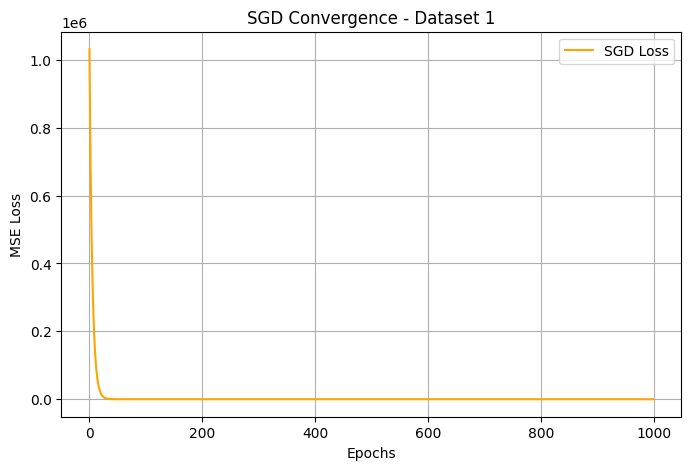

In [89]:
import numpy as np
import matplotlib.pyplot as plt

# --- Dataset 1 (same as above) ---
np.random.seed(45)
num_samples = 40
x1 = np.random.uniform(-20, 20, num_samples)
f_x = 100 * x1 + 1
eps = np.random.randn(num_samples)
y = f_x + eps

X = np.vstack((np.ones(num_samples), x1)).T
theta_star = np.linalg.inv(X.T @ X) @ (X.T @ y)

# --- SGD parameters ---
theta = np.zeros(2)
lr = 1e-5
epsilon = 0.001
max_epochs = 1000
losses = []

for epoch in range(max_epochs):
    for i in range(num_samples):
        xi = X[i].reshape(1, -1)
        yi = y[i]
        grad = 2 * xi.T @ (xi @ theta - yi)
        theta = theta - lr * grad
    loss = np.mean((y - X @ theta)**2)
    losses.append(loss)

    if np.linalg.norm(theta - theta_star) < epsilon:
        print(f'SGD converged in {epoch+1} epochs')
        break

# --- Plot Loss ---
plt.figure(figsize=(8,5))
plt.plot(losses, label='SGD Loss', color='orange')
plt.xlabel('Epochs')
plt.ylabel('MSE Loss')
plt.title('SGD Convergence - Dataset 1')
plt.grid(True)
plt.legend()
plt.show()


In [94]:
import numpy as np

# -------------------------------
# Step 0: Define datasets
# -------------------------------

np.random.seed(45)

# Dataset 1
num_samples = 40
x1 = np.random.uniform(-20, 20, num_samples)
y1 = 100*x1 + 1 + np.random.randn(num_samples)
X1 = np.vstack((np.ones(num_samples), x1)).T

# Dataset 2
np.random.seed(45)
num_samples = 40
x2 = np.random.uniform(-1, 1, num_samples)
y2 = 3*x2 + 4 + np.random.randn(num_samples)
X2 = np.vstack((np.ones(num_samples), x2)).T

datasets = [(X1, y1), (X2, y2)]

# -------------------------------
# Step 1: Compute true minimizer
# -------------------------------

def true_minimizer(X, y):
    return np.linalg.inv(X.T @ X) @ X.T @ y

theta_stars = [true_minimizer(X, y) for X, y in datasets]

# -------------------------------
# Step 2: Gradient function
# -------------------------------

def gradient(X, y, theta):
    n = len(y)
    return (2/n) * X.T @ (X @ theta - y)

# -------------------------------
# Step 3: Full-Batch Gradient Descent
# -------------------------------

def full_batch_gd(X, y, theta_star, lr=0.0001, epsilon=0.001, max_steps=100000):
    theta = np.zeros(X.shape[1])
    steps = 0
    while np.linalg.norm(theta - theta_star) > epsilon and steps < max_steps:
        grad = gradient(X, y, theta)
        theta -= lr * grad
        steps += 1
    return steps, theta

# -------------------------------
# Step 4: Stochastic Gradient Descent
# -------------------------------

def stochastic_gd(X, y, theta_star, lr=0.001, epsilon=0.001, max_steps=100000):
    theta = np.zeros(X.shape[1])
    steps = 0
    n = len(y)

    while np.linalg.norm(theta - theta_star) > epsilon and steps < max_steps:
        idx = np.random.randint(0, n)  # pick a random sample
        xi = X[idx:idx+1]
        yi = y[idx:idx+1]
        grad = 2 * xi.T @ (xi @ theta - yi)
        theta -= lr * grad
        steps += 1
    return steps, theta

# -------------------------------
# Step 5: Run experiments
# -------------------------------

results = []

for i, (X, y) in enumerate(datasets):
    theta_star = theta_stars[i]

    # Full-batch GD
    steps_gd, theta_gd = full_batch_gd(X, y, theta_star)

    # SGD: average over 20 runs
    sgd_steps_list = []
    for _ in range(20):
        steps_sgd, _ = stochastic_gd(X, y, theta_star)
        sgd_steps_list.append(steps_sgd)
    avg_sgd_steps = np.mean(sgd_steps_list)

    results.append({
        "Dataset": i+1,
        "GD_steps": steps_gd,
        "SGD_avg_steps": avg_sgd_steps
    })

# -------------------------------
# Step 6: Print results
# -------------------------------

print("Convergence steps for Full-Batch GD and SGD (averaged over 20 runs):\n")
print("{:<10} {:<15} {:<20}".format("Dataset", "GD steps", "SGD avg steps"))
for res in results:
    print("{:<10} {:<15} {:<20.2f}".format(res["Dataset"], res["GD_steps"], res["SGD_avg_steps"]))


Convergence steps for Full-Batch GD and SGD (averaged over 20 runs):

Dataset    GD steps        SGD avg steps       
1          39610           4842.50             
2          100000          14070.30            


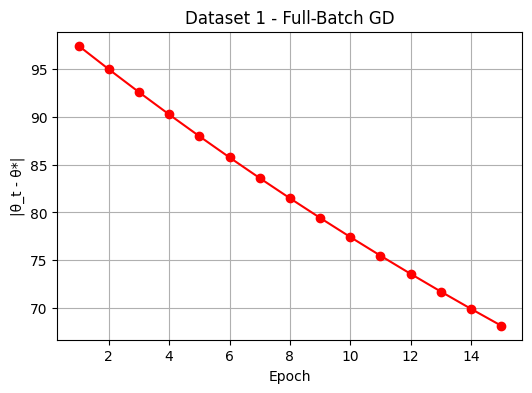

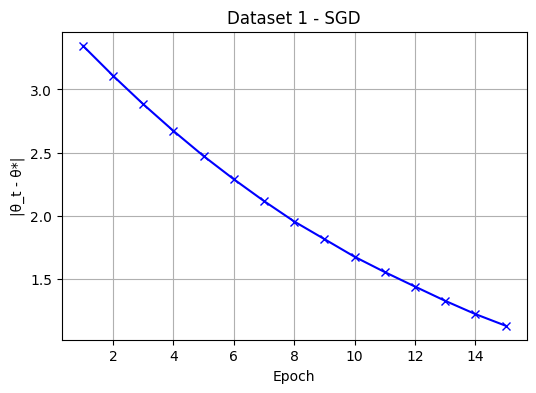

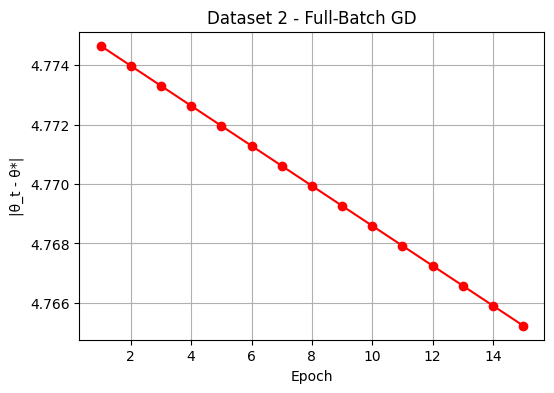

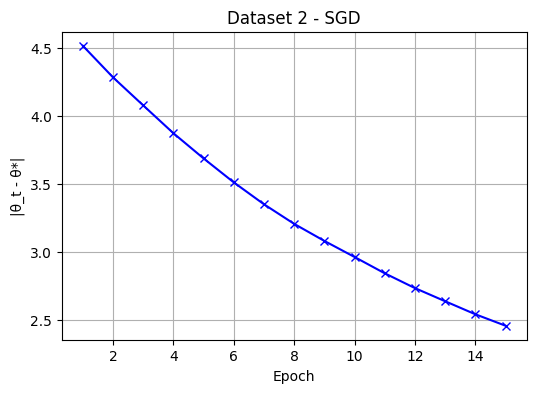

In [103]:
import numpy as np
import matplotlib.pyplot as plt

# -------------------------------
# Define datasets
# -------------------------------
np.random.seed(45)

# Dataset 1
num_samples = 40
x1 = np.random.uniform(-20, 20, num_samples)
y1 = 100*x1 + 1 + np.random.randn(num_samples)
X1 = np.vstack((np.ones(num_samples), x1)).T

# Dataset 2
np.random.seed(45)
num_samples = 40
x2 = np.random.uniform(-1, 1, num_samples)
y2 = 3*x2 + 4 + np.random.randn(num_samples)
X2 = np.vstack((np.ones(num_samples), x2)).T

datasets = [(X1, y1), (X2, y2)]

# -------------------------------
# Compute true minimizers
# -------------------------------
def true_minimizer(X, y):
    return np.linalg.inv(X.T @ X) @ X.T @ y

theta_stars = [true_minimizer(X, y) for X, y in datasets]

# -------------------------------
# Gradient function
# -------------------------------
def gradient(X, y, theta):
    n = len(y)
    return (2/n) * X.T @ (X @ theta - y)

# -------------------------------
# Full-Batch GD with tracking
# -------------------------------
def full_batch_gd_track(X, y, theta_star, lr=0.0001, epochs=15):
    theta = np.zeros(X.shape[1])
    distances = []
    for _ in range(epochs):
        grad = gradient(X, y, theta)
        theta -= lr * grad
        distances.append(np.linalg.norm(theta - theta_star))
    return distances

# -------------------------------
# SGD with tracking
# -------------------------------
def stochastic_gd_track(X, y, theta_star, lr=0.001, epochs=15):
    theta = np.zeros(X.shape[1])
    n = len(y)
    distances = []

    for _ in range(epochs):
        for _ in range(n):
            idx = np.random.randint(0, n)
            xi = X[idx:idx+1]
            yi = y[idx:idx+1]
            grad = 2 * xi.T @ (xi @ theta - yi)
            theta -= lr * grad
        distances.append(np.linalg.norm(theta - theta_star))
    return distances

# -------------------------------
# Run experiments and create 4 separate plots
# -------------------------------
for i, (X, y) in enumerate(datasets):
    theta_star = theta_stars[i]

    # Full-Batch GD
    gd_distances = full_batch_gd_track(X, y, theta_star)
    plt.figure(figsize=(6,4))
    plt.plot(range(1, 16), gd_distances, marker='o', color='red')
    plt.xlabel("Epoch")
    plt.ylabel("|θ_t - θ*|")
    plt.title(f"Dataset {i+1} - Full-Batch GD")
    plt.grid(True)
    plt.show()

    # SGD (average over 10 runs)
    sgd_distances_all = []
    for _ in range(10):
        sgd_distances_all.append(stochastic_gd_track(X, y, theta_star))
    sgd_distances_avg = np.mean(sgd_distances_all, axis=0)

    plt.figure(figsize=(6,4))
    plt.plot(range(1, 16), sgd_distances_avg, marker='x', color='blue')
    plt.xlabel("Epoch")
    plt.ylabel("|θ_t - θ*|")
    plt.title(f"Dataset {i+1} - SGD")
    plt.grid(True)
    plt.show()


In [100]:
import numpy as np
import matplotlib.pyplot as plt
import imageio
import os

# -------------------------------
# Define datasets
# -------------------------------
np.random.seed(45)

# Dataset 1
num_samples = 40
x1 = np.random.uniform(-20, 20, num_samples)
y1 = 100*x1 + 1 + np.random.randn(num_samples)
X1 = np.vstack((np.ones(num_samples), x1)).T

# Dataset 2
np.random.seed(45)
num_samples = 40
x2 = np.random.uniform(-1, 1, num_samples)
y2 = 3*x2 + 4 + np.random.randn(num_samples)
X2 = np.vstack((np.ones(num_samples), x2)).T

datasets = [(X1, y1), (X2, y2)]
dataset_names = ['dataset1', 'dataset2']

# -------------------------------
# True minimizer
# -------------------------------
def true_minimizer(X, y):
    return np.linalg.inv(X.T @ X) @ X.T @ y

theta_stars = [true_minimizer(X, y) for X, y in datasets]

# -------------------------------
# Loss function
# -------------------------------
def loss(X, y, theta):
    return np.mean((X @ theta - y)**2)

# -------------------------------
# Full-batch GD
# -------------------------------
def full_batch_gd_track(X, y, lr, epochs=1000):
    theta = np.zeros(X.shape[1])
    thetas = []
    for _ in range(epochs):
        grad = (2/len(y)) * X.T @ (X @ theta - y)
        theta -= lr * grad
        thetas.append(theta.copy())
    return np.array(thetas)

# -------------------------------
# SGD
# -------------------------------
def stochastic_gd_track(X, y, lr, epochs=1000):
    theta = np.zeros(X.shape[1])
    n = len(y)
    thetas = []
    for _ in range(epochs):
        for _ in range(n):
            idx = np.random.randint(0, n)
            xi = X[idx:idx+1]
            yi = y[idx:idx+1]
            grad = 2 * xi.T @ (xi @ theta - yi)
            theta -= lr * grad
        thetas.append(theta.copy())
    return np.array(thetas)

# -------------------------------
# Create GIF for one method (thinner lines and smaller markers)
# -------------------------------
def create_gif_single(X, theta_star, thetas, filename='optimization.gif'):
    theta0_vals = np.linspace(theta_star[0]-10, theta_star[0]+10, 100)
    theta1_vals = np.linspace(theta_star[1]-10, theta_star[1]+10, 100)
    Theta0, Theta1 = np.meshgrid(theta0_vals, theta1_vals)
    Loss_vals = np.zeros_like(Theta0)
    for m in range(Theta0.shape[0]):
        for n in range(Theta0.shape[1]):
            theta = np.array([Theta0[m,n], Theta1[m,n]])
            Loss_vals[m,n] = loss(X, y, theta)

    os.makedirs('frames', exist_ok=True)
    frame_files = []

    for epoch in range(0, len(thetas), 20):
        plt.figure(figsize=(8,6))
        cp = plt.contour(Theta0, Theta1, Loss_vals, levels=50, cmap='viridis', linewidths=0.5)
        plt.colorbar(cp)
        # Thin trajectory line and small markers
        plt.plot(thetas[:epoch+1,0], thetas[:epoch+1,1], 'ro-', linewidth=1, markersize=2, label='Trajectory')
        plt.scatter(theta_star[0], theta_star[1], color='yellow', marker='*', s=80, label='True theta')
        plt.title(f'Epoch {epoch+1}')
        plt.xlabel(r'$\theta_0$')
        plt.ylabel(r'$\theta_1$')
        plt.legend()
        plt.grid(True)
        frame_path = f'frames/frame_{epoch}.png'
        plt.savefig(frame_path, dpi=100)
        plt.close()
        frame_files.append(frame_path)

    with imageio.get_writer(filename, mode='I', duration=0.3) as writer:
        for frame_file in frame_files:
            image = imageio.imread(frame_file)
            writer.append_data(image)

    for file in frame_files:
        os.remove(file)
    os.rmdir('frames')
    print(f'GIF saved as {filename}')

# -------------------------------
# Run for all datasets and methods
# -------------------------------
# Learning rates
lr_dict = {
    'dataset1': {'gd': 0.0001, 'sgd': 0.001},
    'dataset2': {'gd': 0.01, 'sgd': 0.1}
}

for i, (X, y) in enumerate(datasets):
    theta_star = theta_stars[i]
    name = dataset_names[i]

    # Full-Batch GD
    gd_thetas = full_batch_gd_track(X, y, lr_dict[name]['gd'], epochs=1000)
    create_gif_single(X, theta_star, gd_thetas, filename=f'{name}_GD.gif')

    # SGD
    sgd_thetas = stochastic_gd_track(X, y, lr_dict[name]['sgd'], epochs=1000)
    create_gif_single(X, theta_star, sgd_thetas, filename=f'{name}_SGD.gif')


/tmp/ipython-input-261501049.py:105: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(frame_file)


GIF saved as dataset1_GD.gif
GIF saved as dataset1_SGD.gif
GIF saved as dataset2_GD.gif
GIF saved as dataset2_SGD.gif


In [110]:
import numpy as np
import matplotlib.pyplot as plt

# -------------------------------
# Define datasets
# -------------------------------
np.random.seed(45)

# Dataset 1
num_samples = 40
x1 = np.random.uniform(-20, 20, num_samples)
y1 = 100*x1 + 1 + np.random.randn(num_samples)
X1 = np.vstack((np.ones(num_samples), x1)).T

# Dataset 2
np.random.seed(45)
num_samples = 40
x2 = np.random.uniform(-1, 1, num_samples)
y2 = 3*x2 + 4 + np.random.randn(num_samples)
X2 = np.vstack((np.ones(num_samples), x2)).T

datasets = [(X1, y1), (X2, y2)]
dataset_names = ['Dataset 1', 'Dataset 2']

# -------------------------------
# Loss function
# -------------------------------
def loss(X, y, theta):
    return np.mean((X @ theta - y)**2)

# -------------------------------
# Full-batch GD with loss tracking
# -------------------------------
def full_batch_gd_loss(X, y, lr, epochs=1000):
    theta = np.zeros(X.shape[1])
    losses = []
    for _ in range(epochs):
        grad = (2/len(y)) * X.T @ (X @ theta - y)
        theta -= lr * grad
        losses.append(loss(X, y, theta))
    return np.array(losses)

# -------------------------------
# SGD with loss tracking
# -------------------------------
def stochastic_gd_loss(X, y, lr, epochs=1000):
    theta = np.zeros(X.shape[1])
    losses = []
    n = len(y)
    for _ in range(epochs):
        for _ in range(n):
            idx = np.random.randint(0, n)
            xi = X[idx:idx+1]
            yi = y[idx:idx+1]
            grad = 2 * xi.T @ (xi @ theta - yi)
            theta -= lr * grad
        losses.append(loss(X, y, theta))
    return np.array(losses)

# -------------------------------
# Learning rates
# -------------------------------
lr_dict = {
    'Dataset 1': {'gd': 0.0001, 'sgd': 0.001},
    'Dataset 2': {'gd': 0.01, 'sgd': 0.1}
}

# -------------------------------
# Run experiments and create 4 separate plots
# -------------------------------
for i, (X, y) in enumerate(datasets):
    dataset_name = dataset_names[i]

    # Full-batch GD
    gd_losses = full_batch_gd_loss(X, y, lr_dict[dataset_name]['gd'], epochs=1000)
    plt.figure(figsize=(8,5))
    plt.plot(range(1, 1001), gd_losses, color='red')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(f'{dataset_name} - Full-Batch GD')
    plt.grid(True)
    plt.show()

    # SGD (average over 5 runs)
    sgd_losses_all = []
    for _ in range(5):
        sgd_losses_all.append(stochastic_gd_loss(X, y, lr_dict[dataset_name]['sgd'], epochs=1000))
    sgd_losses_avg = np.mean(sgd_losses_all, axis=0)

    plt.figure(figsize=(8,5))
    plt.plot(range(1, 1001), sgd_losses_avg, color='blue')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(f'{dataset_name} - SGD')
    plt.grid(True)
    plt.show()


/tmp/ipython-input-2865986290.py:108: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(frame_file)


GIF saved as dataset1_GDM.gif
GIF saved as dataset1_SGDM.gif
GIF saved as dataset2_GDM.gif
GIF saved as dataset2_SGDM.gif


In [104]:
import numpy as np
import matplotlib.pyplot as plt

np.random.seed(45)

# Dataset 1
num_samples = 40
x1 = np.random.uniform(-20, 20, num_samples)
y1 = 100*x1 + 1 + np.random.randn(num_samples)
X1 = np.vstack((np.ones(num_samples), x1)).T

# Dataset 2
np.random.seed(45)
num_samples = 40
x2 = np.random.uniform(-1, 1, num_samples)
y2 = 3*x2 + 4 + np.random.randn(num_samples)
X2 = np.vstack((np.ones(num_samples), x2)).T

datasets = [(X1, y1), (X2, y2)]
dataset_names = ['Dataset 1', 'Dataset 2']

# Compute true minimizer
def true_minimizer(X, y):
    return np.linalg.inv(X.T @ X) @ X.T @ y

theta_stars = [true_minimizer(X, y) for X, y in datasets]

# Gradient function
def gradient(X, y, theta):
    return (2/len(y)) * X.T @ (X @ theta - y)


In [105]:
# Full-Batch GD with Momentum
def gd_momentum(X, y, lr=0.0001, beta=0.9, epochs=1000, eps=0.001):
    theta = np.zeros(X.shape[1])
    v = np.zeros_like(theta)
    thetas = [theta.copy()]
    steps = 0
    theta_star = true_minimizer(X, y)

    for epoch in range(epochs):
        grad = gradient(X, y, theta)
        v = beta*v + (1-beta)*grad
        theta = theta - lr*v
        thetas.append(theta.copy())
        steps += 1
        if np.linalg.norm(theta - theta_star) < eps:
            break
    return np.array(thetas), steps

# Stochastic GD with Momentum
def sgd_momentum(X, y, lr=0.001, beta=0.9, epochs=1000, eps=0.001):
    theta = np.zeros(X.shape[1])
    v = np.zeros_like(theta)
    n = len(y)
    thetas = [theta.copy()]
    steps = 0
    theta_star = true_minimizer(X, y)

    for epoch in range(epochs):
        for _ in range(n):
            idx = np.random.randint(0, n)
            xi = X[idx:idx+1]
            yi = y[idx:idx+1]
            grad = 2*xi.T @ (xi @ theta - yi)
            v = beta*v + (1-beta)*grad
            theta = theta - lr*v
        thetas.append(theta.copy())
        steps += 1
        if np.linalg.norm(theta - theta_star) < eps:
            break
    return np.array(thetas), steps


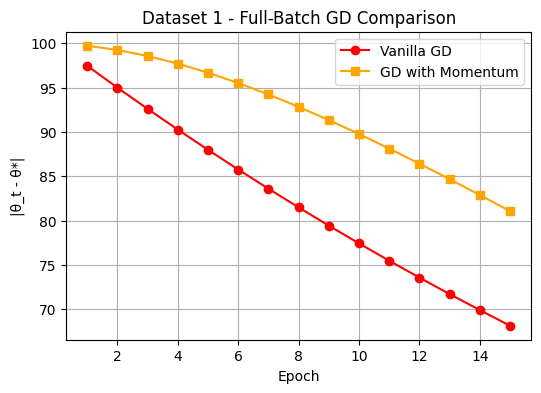

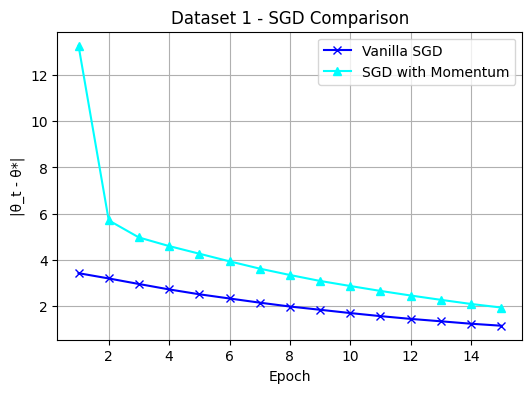

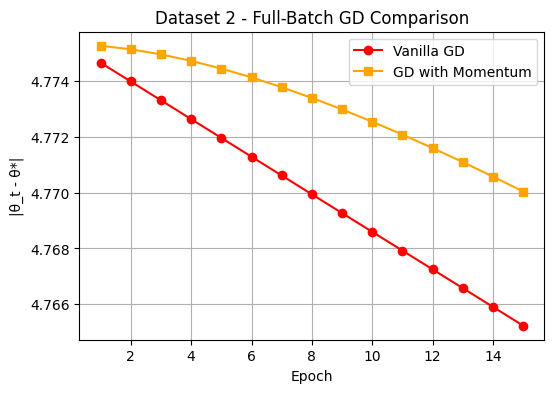

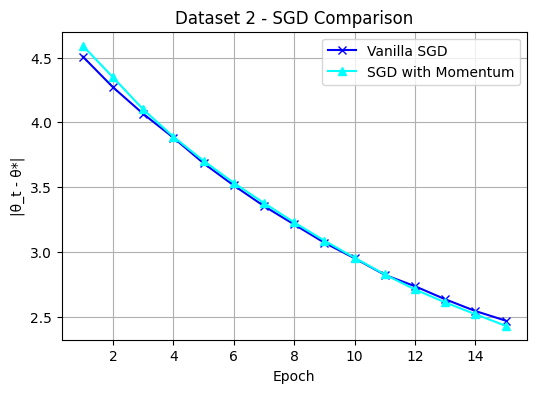

In [113]:
import numpy as np
import matplotlib.pyplot as plt

# -------------------------------
# Define datasets
# -------------------------------
np.random.seed(45)

# Dataset 1
num_samples = 40
x1 = np.random.uniform(-20, 20, num_samples)
y1 = 100*x1 + 1 + np.random.randn(num_samples)
X1 = np.vstack((np.ones(num_samples), x1)).T

# Dataset 2
np.random.seed(45)
num_samples = 40
x2 = np.random.uniform(-1, 1, num_samples)
y2 = 3*x2 + 4 + np.random.randn(num_samples)
X2 = np.vstack((np.ones(num_samples), x2)).T

datasets = [(X1, y1), (X2, y2)]
dataset_names = ['Dataset 1', 'Dataset 2']

# -------------------------------
# Compute true minimizers
# -------------------------------
def true_minimizer(X, y):
    return np.linalg.inv(X.T @ X) @ X.T @ y

theta_stars = [true_minimizer(X, y) for X, y in datasets]

# -------------------------------
# Gradient function
# -------------------------------
def gradient(X, y, theta):
    n = len(y)
    return (2/n) * X.T @ (X @ theta - y)

# -------------------------------
# Full-Batch GD tracking
# -------------------------------
def full_batch_gd_track(X, y, theta_star, lr=0.0001, epochs=15):
    theta = np.zeros(X.shape[1])
    distances = []
    for _ in range(epochs):
        grad = gradient(X, y, theta)
        theta -= lr * grad
        distances.append(np.linalg.norm(theta - theta_star))
    return distances

# -------------------------------
# SGD tracking
# -------------------------------
def stochastic_gd_track(X, y, theta_star, lr=0.001, epochs=15):
    theta = np.zeros(X.shape[1])
    n = len(y)
    distances = []
    for _ in range(epochs):
        for _ in range(n):
            idx = np.random.randint(0, n)
            xi = X[idx:idx+1]
            yi = y[idx:idx+1]
            grad = 2 * xi.T @ (xi @ theta - yi)
            theta -= lr * grad
        distances.append(np.linalg.norm(theta - theta_star))
    return distances

# -------------------------------
# Full-Batch GD with Momentum tracking
# -------------------------------
def full_batch_gd_momentum_track(X, y, theta_star, lr=0.0001, beta=0.9, epochs=15):
    theta = np.zeros(X.shape[1])
    v = np.zeros_like(theta)
    distances = []
    for _ in range(epochs):
        grad = gradient(X, y, theta)
        v = beta*v + (1-beta)*grad
        theta -= lr * v
        distances.append(np.linalg.norm(theta - theta_star))
    return distances

# -------------------------------
# SGD with Momentum tracking
# -------------------------------
def stochastic_gd_momentum_track(X, y, theta_star, lr=0.001, beta=0.9, epochs=15):
    theta = np.zeros(X.shape[1])
    v = np.zeros_like(theta)
    n = len(y)
    distances = []
    for _ in range(epochs):
        for _ in range(n):
            idx = np.random.randint(0, n)
            xi = X[idx:idx+1]
            yi = y[idx:idx+1]
            grad = 2 * xi.T @ (xi @ theta - yi)
            v = beta*v + (1-beta)*grad
            theta -= lr * v
        distances.append(np.linalg.norm(theta - theta_star))
    return distances

# -------------------------------
# Run experiments and create 4 comparison plots
# -------------------------------
for i, (X, y) in enumerate(datasets):
    theta_star = theta_stars[i]
    dataset_name = dataset_names[i]

    # Full-Batch GD vs GD with Momentum
    gd_distances = full_batch_gd_track(X, y, theta_star)
    gdm_distances = full_batch_gd_momentum_track(X, y, theta_star)

    plt.figure(figsize=(6,4))
    plt.plot(range(1,16), gd_distances, marker='o', label='Vanilla GD', color='red')
    plt.plot(range(1,16), gdm_distances, marker='s', label='GD with Momentum', color='orange')
    plt.xlabel("Epoch")
    plt.ylabel("|θ_t - θ*|")
    plt.title(f"{dataset_name} - Full-Batch GD Comparison")
    plt.legend()
    plt.grid(True)
    plt.show()

    # SGD vs SGD with Momentum (average over 10 runs)
    sgd_distances_all = []
    sgdm_distances_all = []
    for _ in range(10):
        sgd_distances_all.append(stochastic_gd_track(X, y, theta_star))
        sgdm_distances_all.append(stochastic_gd_momentum_track(X, y, theta_star))
    sgd_avg = np.mean(sgd_distances_all, axis=0)
    sgdm_avg = np.mean(sgdm_distances_all, axis=0)

    plt.figure(figsize=(6,4))
    plt.plot(range(1,16), sgd_avg, marker='x', label='Vanilla SGD', color='blue')
    plt.plot(range(1,16), sgdm_avg, marker='^', label='SGD with Momentum', color='cyan')
    plt.xlabel("Epoch")
    plt.ylabel("|θ_t - θ*|")
    plt.title(f"{dataset_name} - SGD Comparison")
    plt.legend()
    plt.grid(True)
    plt.show()


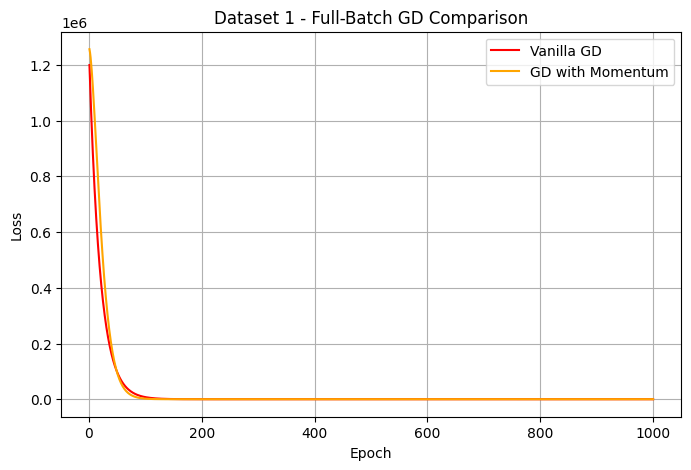

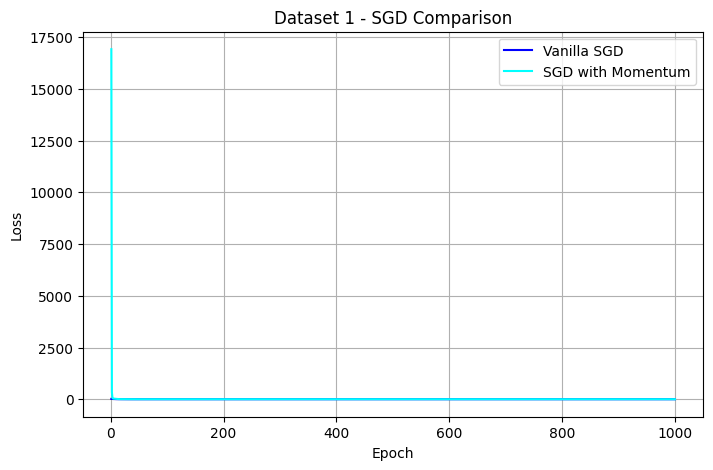

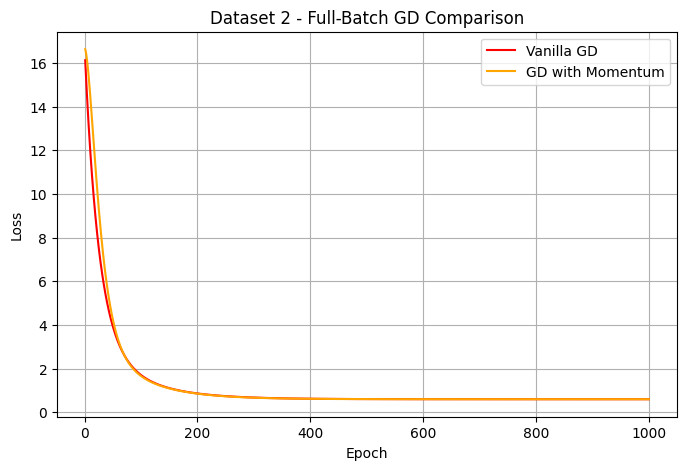

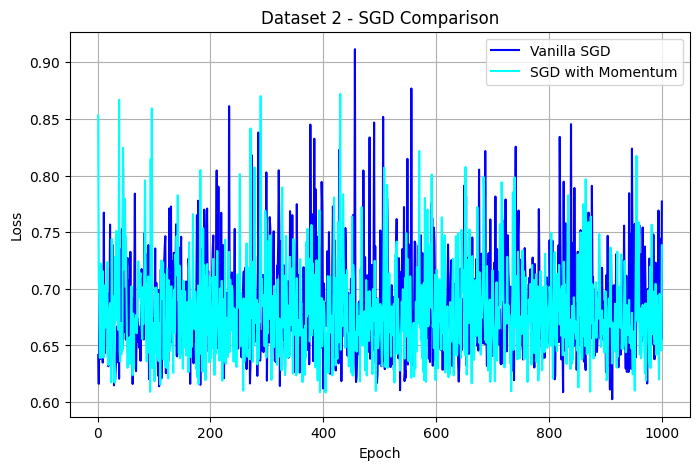

In [112]:
import numpy as np
import matplotlib.pyplot as plt

# -------------------------------
# Define datasets
# -------------------------------
np.random.seed(45)

# Dataset 1
num_samples = 40
x1 = np.random.uniform(-20, 20, num_samples)
y1 = 100*x1 + 1 + np.random.randn(num_samples)
X1 = np.vstack((np.ones(num_samples), x1)).T

# Dataset 2
np.random.seed(45)
num_samples = 40
x2 = np.random.uniform(-1, 1, num_samples)
y2 = 3*x2 + 4 + np.random.randn(num_samples)
X2 = np.vstack((np.ones(num_samples), x2)).T

datasets = [(X1, y1), (X2, y2)]
dataset_names = ['Dataset 1', 'Dataset 2']

# -------------------------------
# Loss function
# -------------------------------
def loss(X, y, theta):
    return np.mean((X @ theta - y)**2)

# -------------------------------
# Vanilla Full-batch GD
# -------------------------------
def full_batch_gd_loss(X, y, lr, epochs=1000):
    theta = np.zeros(X.shape[1])
    losses = []
    for _ in range(epochs):
        grad = (2/len(y)) * X.T @ (X @ theta - y)
        theta -= lr * grad
        losses.append(loss(X, y, theta))
    return np.array(losses)

# -------------------------------
# Vanilla SGD
# -------------------------------
def stochastic_gd_loss(X, y, lr, epochs=1000):
    theta = np.zeros(X.shape[1])
    n = len(y)
    losses = []
    for _ in range(epochs):
        for _ in range(n):
            idx = np.random.randint(0, n)
            xi = X[idx:idx+1]
            yi = y[idx:idx+1]
            grad = 2 * xi.T @ (xi @ theta - yi)
            theta -= lr * grad
        losses.append(loss(X, y, theta))
    return np.array(losses)

# -------------------------------
# Full-batch GD with Momentum
# -------------------------------
def full_batch_gd_momentum_loss(X, y, lr, beta=0.9, epochs=1000):
    theta = np.zeros(X.shape[1])
    v = np.zeros_like(theta)
    losses = []
    for _ in range(epochs):
        grad = (2/len(y)) * X.T @ (X @ theta - y)
        v = beta*v + (1-beta)*grad
        theta -= lr * v
        losses.append(loss(X, y, theta))
    return np.array(losses)

# -------------------------------
# SGD with Momentum
# -------------------------------
def stochastic_gd_momentum_loss(X, y, lr, beta=0.9, epochs=1000):
    theta = np.zeros(X.shape[1])
    v = np.zeros_like(theta)
    n = len(y)
    losses = []
    for _ in range(epochs):
        for _ in range(n):
            idx = np.random.randint(0, n)
            xi = X[idx:idx+1]
            yi = y[idx:idx+1]
            grad = 2 * xi.T @ (xi @ theta - yi)
            v = beta*v + (1-beta)*grad
            theta -= lr * v
        losses.append(loss(X, y, theta))
    return np.array(losses)

# -------------------------------
# Learning rates
# -------------------------------
lr_dict = {
    'Dataset 1': {'gd': 0.0001, 'sgd': 0.001},
    'Dataset 2': {'gd': 0.01, 'sgd': 0.1}
}

# -------------------------------
# Run experiments and create 4 comparison plots
# -------------------------------
for i, (X, y) in enumerate(datasets):
    dataset_name = dataset_names[i]

    # Vanilla GD
    gd_losses = full_batch_gd_loss(X, y, lr_dict[dataset_name]['gd'])
    # GD with Momentum
    gdm_losses = full_batch_gd_momentum_loss(X, y, lr_dict[dataset_name]['gd'])

    plt.figure(figsize=(8,5))
    plt.plot(range(1, 1001), gd_losses, label='Vanilla GD', color='red')
    plt.plot(range(1, 1001), gdm_losses, label='GD with Momentum', color='orange')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(f'{dataset_name} - Full-Batch GD Comparison')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Vanilla SGD
    sgd_losses_all = []
    for _ in range(5):  # average over 5 runs
        sgd_losses_all.append(stochastic_gd_loss(X, y, lr_dict[dataset_name]['sgd']))
    sgd_losses_avg = np.mean(sgd_losses_all, axis=0)

    # SGD with Momentum
    sgdm_losses_all = []
    for _ in range(5):
        sgdm_losses_all.append(stochastic_gd_momentum_loss(X, y, lr_dict[dataset_name]['sgd']))
    sgdm_losses_avg = np.mean(sgdm_losses_all, axis=0)

    plt.figure(figsize=(8,5))
    plt.plot(range(1, 1001), sgd_losses_avg, label='Vanilla SGD', color='blue')
    plt.plot(range(1, 1001), sgdm_losses_avg, label='SGD with Momentum', color='cyan')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title(f'{dataset_name} - SGD Comparison')
    plt.legend()
    plt.grid(True)
    plt.show()



In [111]:
import numpy as np
import matplotlib.pyplot as plt
import imageio
import os

# -------------------------------
# Define datasets
# -------------------------------
np.random.seed(45)

# Dataset 1
num_samples = 40
x1 = np.random.uniform(-20, 20, num_samples)
y1 = 100*x1 + 1 + np.random.randn(num_samples)
X1 = np.vstack((np.ones(num_samples), x1)).T

# Dataset 2
np.random.seed(45)
num_samples = 40
x2 = np.random.uniform(-1, 1, num_samples)
y2 = 3*x2 + 4 + np.random.randn(num_samples)
X2 = np.vstack((np.ones(num_samples), x2)).T

datasets = [(X1, y1), (X2, y2)]
dataset_names = ['dataset1', 'dataset2']

# -------------------------------
# True minimizer
# -------------------------------
def true_minimizer(X, y):
    return np.linalg.inv(X.T @ X) @ X.T @ y

theta_stars = [true_minimizer(X, y) for X, y in datasets]

# -------------------------------
# Loss function
# -------------------------------
def loss(X, y, theta):
    return np.mean((X @ theta - y)**2)

# -------------------------------
# Full-batch GD with Momentum
# -------------------------------
def full_batch_gd_momentum_track(X, y, lr, beta=0.9, epochs=1000):
    theta = np.zeros(X.shape[1])
    v = np.zeros_like(theta)
    thetas = []
    for _ in range(epochs):
        grad = (2/len(y)) * X.T @ (X @ theta - y)
        v = beta*v + (1-beta)*grad
        theta -= lr * v
        thetas.append(theta.copy())
    return np.array(thetas)

# -------------------------------
# SGD with Momentum
# -------------------------------
def stochastic_gd_momentum_track(X, y, lr, beta=0.9, epochs=1000):
    theta = np.zeros(X.shape[1])
    v = np.zeros_like(theta)
    n = len(y)
    thetas = []
    for _ in range(epochs):
        for _ in range(n):
            idx = np.random.randint(0, n)
            xi = X[idx:idx+1]
            yi = y[idx:idx+1]
            grad = 2 * xi.T @ (xi @ theta - yi)
            v = beta*v + (1-beta)*grad
            theta -= lr * v
        thetas.append(theta.copy())
    return np.array(thetas)

# -------------------------------
# Create GIF for one method (thin lines, small markers)
# -------------------------------
def create_gif_single(X, y, theta_star, thetas, filename='optimization.gif'):
    theta0_vals = np.linspace(theta_star[0]-10, theta_star[0]+10, 100)
    theta1_vals = np.linspace(theta_star[1]-10, theta_star[1]+10, 100)
    Theta0, Theta1 = np.meshgrid(theta0_vals, theta1_vals)
    Loss_vals = np.zeros_like(Theta0)
    for m in range(Theta0.shape[0]):
        for n in range(Theta0.shape[1]):
            theta = np.array([Theta0[m,n], Theta1[m,n]])
            Loss_vals[m,n] = loss(X, y, theta)

    os.makedirs('frames', exist_ok=True)
    frame_files = []

    for epoch in range(0, len(thetas), 20):
        plt.figure(figsize=(8,6))
        cp = plt.contour(Theta0, Theta1, Loss_vals, levels=50, cmap='viridis', linewidths=0.5)
        plt.colorbar(cp)
        plt.plot(thetas[:epoch+1,0], thetas[:epoch+1,1], 'ro-', linewidth=1, markersize=2, label='Trajectory')
        plt.scatter(theta_star[0], theta_star[1], color='yellow', marker='*', s=80, label='True theta')
        plt.title(f'Epoch {epoch+1}')
        plt.xlabel(r'$\theta_0$')
        plt.ylabel(r'$\theta_1$')
        plt.legend()
        plt.grid(True)
        frame_path = f'frames/frame_{epoch}.png'
        plt.savefig(frame_path, dpi=100)
        plt.close()
        frame_files.append(frame_path)

    with imageio.get_writer(filename, mode='I', duration=0.3) as writer:
        for frame_file in frame_files:
            image = imageio.imread(frame_file)
            writer.append_data(image)

    for file in frame_files:
        os.remove(file)
    os.rmdir('frames')
    print(f'GIF saved as {filename}')

# -------------------------------
# Run for all datasets and methods with Momentum
# -------------------------------
lr_dict = {
    'dataset1': {'gd': 0.0001, 'sgd': 0.001},
    'dataset2': {'gd': 0.01, 'sgd': 0.1}
}
beta = 0.9

for i, (X, y) in enumerate(datasets):
    theta_star = theta_stars[i]
    name = dataset_names[i]

    # Full-Batch GD with Momentum
    gd_thetas = full_batch_gd_momentum_track(X, y, lr_dict[name]['gd'], beta=beta, epochs=1000)
    create_gif_single(X, y, theta_star, gd_thetas, filename=f'{name}_GDM.gif')

    # SGD with Momentum
    sgd_thetas = stochastic_gd_momentum_track(X, y, lr_dict[name]['sgd'], beta=beta, epochs=1000)
    create_gif_single(X, y, theta_star, sgd_thetas, filename=f'{name}_SGDM.gif')


/tmp/ipython-input-2865986290.py:108: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image = imageio.imread(frame_file)


GIF saved as dataset1_GDM.gif
GIF saved as dataset1_SGDM.gif
GIF saved as dataset2_GDM.gif
GIF saved as dataset2_SGDM.gif


In [114]:
import numpy as np

# -------------------------------
# Step 0: Define datasets
# -------------------------------
np.random.seed(45)

# Dataset 1
num_samples = 40
x1 = np.random.uniform(-20, 20, num_samples)
y1 = 100*x1 + 1 + np.random.randn(num_samples)
X1 = np.vstack((np.ones(num_samples), x1)).T

# Dataset 2
np.random.seed(45)
num_samples = 40
x2 = np.random.uniform(-1, 1, num_samples)
y2 = 3*x2 + 4 + np.random.randn(num_samples)
X2 = np.vstack((np.ones(num_samples), x2)).T

datasets = [(X1, y1), (X2, y2)]

# -------------------------------
# Step 1: Compute true minimizer
# -------------------------------
def true_minimizer(X, y):
    return np.linalg.inv(X.T @ X) @ X.T @ y

theta_stars = [true_minimizer(X, y) for X, y in datasets]

# -------------------------------
# Step 2: Gradient function
# -------------------------------
def gradient(X, y, theta):
    n = len(y)
    return (2/n) * X.T @ (X @ theta - y)

# -------------------------------
# Step 3: Full-Batch Gradient Descent (vanilla)
# -------------------------------
def full_batch_gd(X, y, theta_star, lr=0.0001, epsilon=0.001, max_steps=100000):
    theta = np.zeros(X.shape[1])
    steps = 0
    while np.linalg.norm(theta - theta_star) > epsilon and steps < max_steps:
        grad = gradient(X, y, theta)
        theta -= lr * grad
        steps += 1
    return steps, theta

# -------------------------------
# Step 4: Full-Batch GD with Momentum
# -------------------------------
def full_batch_gd_momentum(X, y, theta_star, lr=0.0001, beta=0.9, epsilon=0.001, max_steps=100000):
    theta = np.zeros(X.shape[1])
    v = np.zeros_like(theta)
    steps = 0
    while np.linalg.norm(theta - theta_star) > epsilon and steps < max_steps:
        grad = gradient(X, y, theta)
        v = beta*v + (1-beta)*grad
        theta -= lr * v
        steps += 1
    return steps, theta

# -------------------------------
# Step 5: Stochastic Gradient Descent (vanilla)
# -------------------------------
def stochastic_gd(X, y, theta_star, lr=0.001, epsilon=0.001, max_steps=100000):
    theta = np.zeros(X.shape[1])
    steps = 0
    n = len(y)
    while np.linalg.norm(theta - theta_star) > epsilon and steps < max_steps:
        idx = np.random.randint(0, n)
        xi = X[idx:idx+1]
        yi = y[idx:idx+1]
        grad = 2 * xi.T @ (xi @ theta - yi)
        theta -= lr * grad
        steps += 1
    return steps, theta

# -------------------------------
# Step 6: SGD with Momentum
# -------------------------------
def stochastic_gd_momentum(X, y, theta_star, lr=0.001, beta=0.9, epsilon=0.001, max_steps=100000):
    theta = np.zeros(X.shape[1])
    v = np.zeros_like(theta)
    steps = 0
    n = len(y)
    while np.linalg.norm(theta - theta_star) > epsilon and steps < max_steps:
        idx = np.random.randint(0, n)
        xi = X[idx:idx+1]
        yi = y[idx:idx+1]
        grad = 2 * xi.T @ (xi @ theta - yi)
        v = beta*v + (1-beta)*grad
        theta -= lr * v
        steps += 1
    return steps, theta

# -------------------------------
# Step 7: Run experiments
# -------------------------------
results = []

for i, (X, y) in enumerate(datasets):
    theta_star = theta_stars[i]

    # Full-Batch GD
    steps_gd, _ = full_batch_gd(X, y, theta_star)
    steps_gdm, _ = full_batch_gd_momentum(X, y, theta_star)

    # SGD: average over 20 runs
    sgd_steps_list = []
    sgdm_steps_list = []
    for _ in range(20):
        steps_sgd, _ = stochastic_gd(X, y, theta_star)
        sgd_steps_list.append(steps_sgd)

        steps_sgdm, _ = stochastic_gd_momentum(X, y, theta_star)
        sgdm_steps_list.append(steps_sgdm)

    avg_sgd_steps = np.mean(sgd_steps_list)
    avg_sgdm_steps = np.mean(sgdm_steps_list)

    results.append({
        "Dataset": i+1,
        "GD_steps": steps_gd,
        "GD_Momentum_steps": steps_gdm,
        "SGD_avg_steps": avg_sgd_steps,
        "SGD_Momentum_avg_steps": avg_sgdm_steps
    })

# -------------------------------
# Step 8: Print results
# -------------------------------
print("Convergence steps (epsilon=0.001) for GD/SGD with and without Momentum:\n")
print("{:<10} {:<15} {:<20} {:<20} {:<25}".format(
    "Dataset", "GD", "GD with Momentum", "SGD avg", "SGD with Momentum avg"
))
for res in results:
    print("{:<10} {:<15} {:<20} {:<20.2f} {:<25.2f}".format(
        res["Dataset"], res["GD_steps"], res["GD_Momentum_steps"], res["SGD_avg_steps"], res["SGD_Momentum_avg_steps"]
    ))


Convergence steps (epsilon=0.001) for GD/SGD with and without Momentum:

Dataset    GD              GD with Momentum     SGD avg              SGD with Momentum avg    
1          39610           39549                4607.25              4730.50                  
2          100000          100000               13807.80             14984.55                 


# *Answer 2*


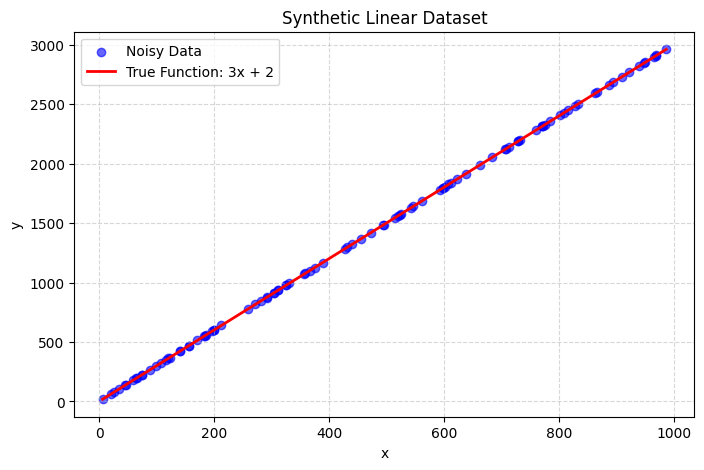

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Generate dataset
num_samples = 100
np.random.seed(42)

x = np.random.uniform(0, 1000, num_samples)
f_x = 3 * x + 2
eps = np.random.randn(num_samples)
y = f_x + eps

# Plot
plt.figure(figsize=(8, 5))
plt.scatter(x, y, color='blue', label='Noisy Data', alpha=0.6)
plt.plot(np.sort(x), 3*np.sort(x) + 2, color='red', linewidth=1, label='True Function: 3x + 2')
plt.title('Synthetic Linear Dataset')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.grid(True, linestyle='--', alpha=0.5)
plt.show()


Empirical least squares solution θ*: [2.21509616 2.99954023]
Converged in 1000000 iterations
Theta found by gradient descent: [0.96206697 3.00144881]


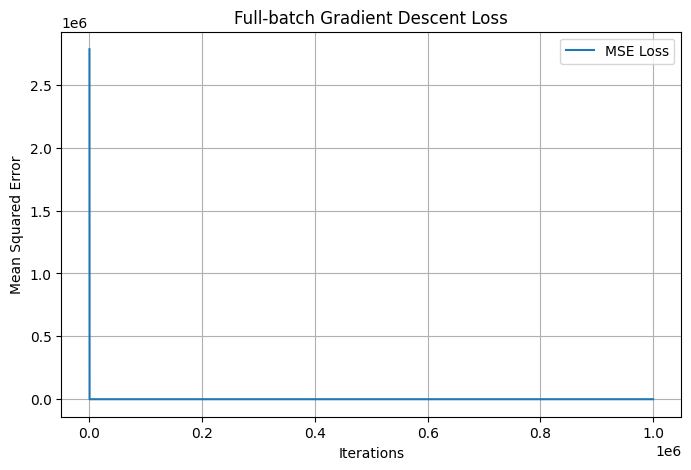

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Data
num_samples = 100
np.random.seed(42)
x = np.random.uniform(0, 1000, num_samples)
f_x = 3 * x + 2
eps = np.random.randn(num_samples)
y = f_x + eps

# Add bias term (intercept)
X = np.vstack((np.ones(num_samples), x)).T  # shape (100,2)

# Compute empirical least squares solution (theta*)
theta_star = np.linalg.inv(X.T @ X) @ X.T @ y
print("Empirical least squares solution θ*:", theta_star)

# Full-batch gradient descent
theta = np.zeros(2)  # initialize θ = [0,0]
alpha = 1e-6         # learning rate (small due to large x scale)
epsilon = 0.001      # convergence criterion
max_iters = 1000000   # safety limit

mse_history = []
num_iters = 0

for i in range(max_iters):
    # Compute predictions
    y_pred = X @ theta
    # Compute gradient
    grad = (2/num_samples) * X.T @ (y_pred - y)
    # Update theta
    theta = theta - alpha * grad
    # Compute MSE
    mse = np.mean((y - y_pred)**2)
    mse_history.append(mse)
    num_iters += 1
    # Check convergence
    if np.linalg.norm(theta - theta_star) < epsilon:
        break

print(f"Converged in {num_iters} iterations")
print("Theta found by gradient descent:", theta)

# Plot MSE vs iterations
plt.figure(figsize=(8,5))
plt.plot(mse_history, label='MSE Loss')
plt.xlabel('Iterations')
plt.ylabel('Mean Squared Error')
plt.title('Full-batch Gradient Descent Loss')
plt.grid(True)
plt.legend()
plt.show()


Empirical least squares solution θ*: [2.21509616 2.99954023]
Converged in 125 iterations
Theta found by gradient descent: [0.0047308 3.002907 ]


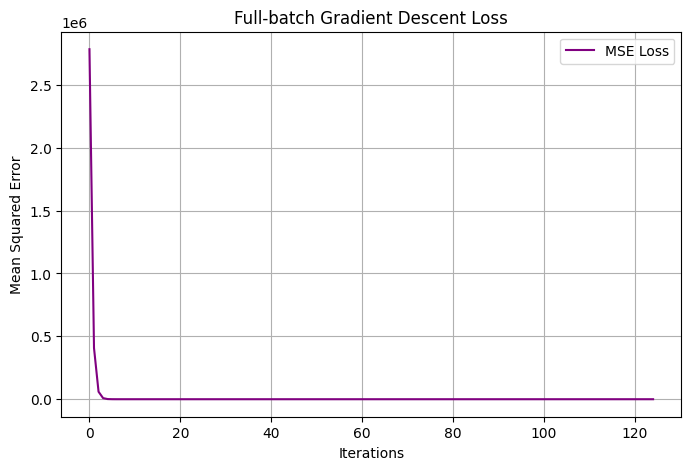

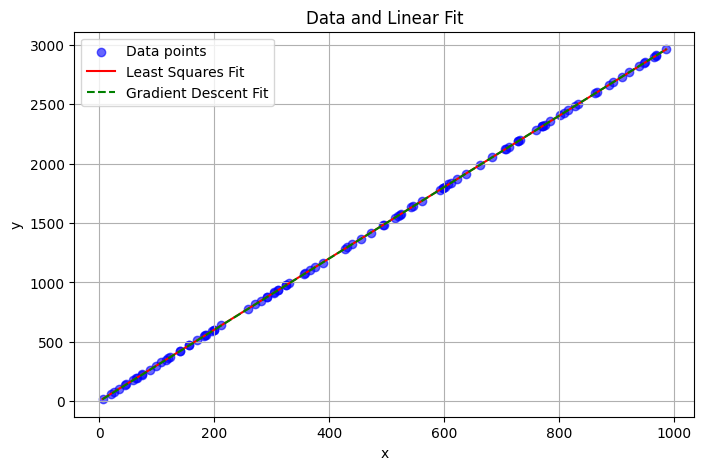

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# ===================
# Generate Data
# ===================
num_samples = 100
np.random.seed(42)
x = np.random.uniform(0, 1000, num_samples)
f_x = 3 * x + 2
eps = np.random.randn(num_samples)
y = f_x + eps

# Add bias term (intercept)
X = np.vstack((np.ones(num_samples), x)).T  # shape (100,2)

# ===================
# Empirical Least Squares
# ===================
theta_star = np.linalg.inv(X.T @ X) @ X.T @ y
print("Empirical least squares solution θ*:", theta_star)

# ===================
# Full-batch Gradient Descent
# ===================
theta = np.zeros(2)  # initialize θ = [0,0]
alpha = 1e-6         # learning rate
epsilon = 0.001      # convergence criterion
max_iters = 125      # safety limit

mse_history = []
num_iters = 0

for i in range(max_iters):
    y_pred = X @ theta
    grad = (2/num_samples) * X.T @ (y_pred - y)
    theta = theta - alpha * grad
    mse = np.mean((y - y_pred)**2)
    mse_history.append(mse)
    num_iters += 1
    if np.linalg.norm(theta - theta_star) < epsilon:
        break

print(f"Converged in {num_iters} iterations")
print("Theta found by gradient descent:", theta)

# ===================
# Plot MSE vs Iterations
# ===================
plt.figure(figsize=(8,5))
plt.plot(mse_history, label='MSE Loss', color='purple')
plt.xlabel('Iterations')
plt.ylabel('Mean Squared Error')
plt.title('Full-batch Gradient Descent Loss')
plt.grid(True)
plt.legend()
plt.show()

# ===================
# Plot Data and Fitted Lines
# ===================
plt.figure(figsize=(8,5))
plt.scatter(x, y, color='blue', alpha=0.6, label='Data points')
x_line = np.linspace(min(x), max(x), 100)
plt.plot(x_line, theta_star[0] + theta_star[1]*x_line, color='red', label='Least Squares Fit')
plt.plot(x_line, theta[0] + theta[1]*x_line, color='green', linestyle='--', label='Gradient Descent Fit')
plt.xlabel('x')
plt.ylabel('y')
plt.title('Data and Linear Fit')
plt.grid(True)
plt.legend()
plt.show()


Empirical least squares solution θ*: [2.21509616 2.99954023]
Converged in 1000000 iterations
Theta found by gradient descent: [0.96206697 3.00144881]


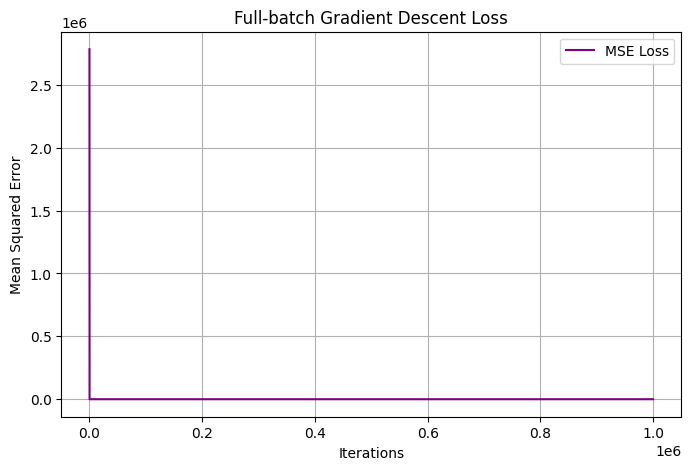

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# ===================
# Generate Data
# ===================
num_samples = 100
np.random.seed(42)
x = np.random.uniform(0, 1000, num_samples)
f_x = 3 * x + 2
eps = np.random.randn(num_samples)
y = f_x + eps

# Add bias term (intercept)
X = np.vstack((np.ones(num_samples), x)).T  # shape (100,2)

# ===================
# Empirical Least Squares
# ===================
theta_star = np.linalg.inv(X.T @ X) @ X.T @ y
print("Empirical least squares solution θ*:", theta_star)

# ===================
# Full-batch Gradient Descent
# ===================
theta = np.zeros(2)  # initialize θ = [0,0]
alpha = 1e-6         # learning rate (small due to large x scale)
epsilon = 0.01      # convergence criterion
max_iters = 1000000    # safety limit

mse_history = []
num_iters = 0

for i in range(max_iters):
    y_pred = X @ theta
    grad = (2/num_samples) * X.T @ (y_pred - y)
    theta = theta - alpha * grad
    mse = np.mean((y - y_pred)**2)
    mse_history.append(mse)
    num_iters += 1
    if np.linalg.norm(theta - theta_star) < epsilon:
        break

print(f"Converged in {num_iters} iterations")
print("Theta found by gradient descent:", theta)

# ===================
# Plot MSE vs Iterations
# ===================
plt.figure(figsize=(8,5))
plt.plot(mse_history, color='purple', label='MSE Loss')
plt.xlabel('Iterations')
plt.ylabel('Mean Squared Error')
plt.title('Full-batch Gradient Descent Loss')
plt.grid(True)
plt.legend()
plt.show()


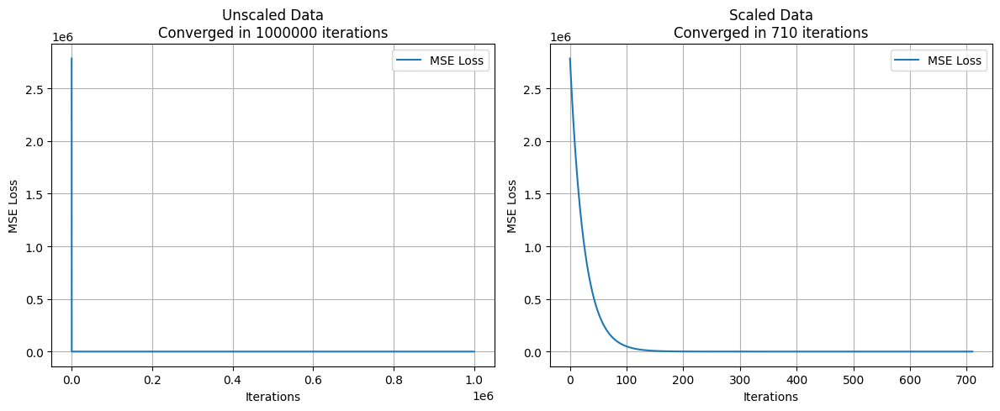

Number of iterations for unscaled data: 1000000
Number of iterations for scaled data: 710


In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Set random seed for reproducibility
np.random.seed(42)

# Generate dataset
num_samples = 100
x = np.random.uniform(0, 1000, num_samples)
f_x = 3 * x + 2
eps = np.random.randn(num_samples)
y = f_x + eps

# Compute empirical least squares minimizer (theta_star) analytically
def compute_theta_star(X, y):
    X_with_bias = np.vstack([X, np.ones_like(X)]).T  # [x, 1]
    theta_star = np.linalg.inv(X_with_bias.T @ X_with_bias) @ X_with_bias.T @ y
    return theta_star  # [w*, b*]

# Full-batch gradient descent
def gradient_descent(X, y, theta_star, learning_rate, epsilon=0.001, max_iterations=1000000):
    n = len(y)
    w, b = 0.0, 0.0  # Initialize parameters
    theta = np.array([w, b])
    mse_losses = []
    iterations = 0

    while iterations < max_iterations:
        # Compute predictions
        y_pred = w * X + b
        # Compute MSE loss
        mse = np.mean((y_pred - y) ** 2)
        mse_losses.append(mse)
        # Check convergence
        if np.linalg.norm(theta - theta_star) < epsilon:
            break
        # Compute gradients
        grad_w = (2/n) * np.sum((y_pred - y) * X)
        grad_b = (2/n) * np.sum(y_pred - y)
        # Update parameters
        w -= learning_rate * grad_w
        b -= learning_rate * grad_b
        theta = np.array([w, b])
        iterations += 1

    return iterations, mse_losses

# Part 1: Without feature scaling
theta_star_unscaled = compute_theta_star(x, y)
iterations_unscaled, mse_losses_unscaled = gradient_descent(x, y, theta_star_unscaled, learning_rate=0.000001)

# Part 2: With z-score normalization
x_mean = np.mean(x)
x_std = np.std(x)
x_scaled = (x - x_mean) / x_std
# Since y = 3 * x + 2 + eps, we need to adjust y or theta_star for scaled x
# For x_scaled = (x - μ)/σ, the model becomes y = w_scaled * x_scaled + b_scaled
# where w_scaled = w * σ, b_scaled = b + w * μ
w_star_scaled = theta_star_unscaled[0] * x_std
b_star_scaled = theta_star_unscaled[1] + theta_star_unscaled[0] * x_mean
theta_star_scaled = np.array([w_star_scaled, b_star_scaled])
iterations_scaled, mse_losses_scaled = gradient_descent(x_scaled, y, theta_star_scaled, learning_rate=0.01)

# Plotting
plt.figure(figsize=(12, 5))

# Plot for unscaled data
plt.subplot(1, 2, 1)
plt.plot(range(len(mse_losses_unscaled)), mse_losses_unscaled, label='MSE Loss')
plt.xlabel('Iterations')
plt.ylabel('MSE Loss')
plt.title(f'Unscaled Data\nConverged in {iterations_unscaled} iterations')
plt.grid(True)
plt.legend()

# Plot for scaled data
plt.subplot(1, 2, 2)
plt.plot(range(len(mse_losses_scaled)), mse_losses_scaled, label='MSE Loss')
plt.xlabel('Iterations')
plt.ylabel('MSE Loss')
plt.title(f'Scaled Data\nConverged in {iterations_scaled} iterations')
plt.grid(True)
plt.legend()

plt.tight_layout()
plt.show()

# Print results
print(f"Number of iterations for unscaled data: {iterations_unscaled}")
print(f"Number of iterations for scaled data: {iterations_scaled}")

Least squares solution: [2.21509616 2.99954023]
Theta found by gradient descent: [0.06643369 3.00281302]


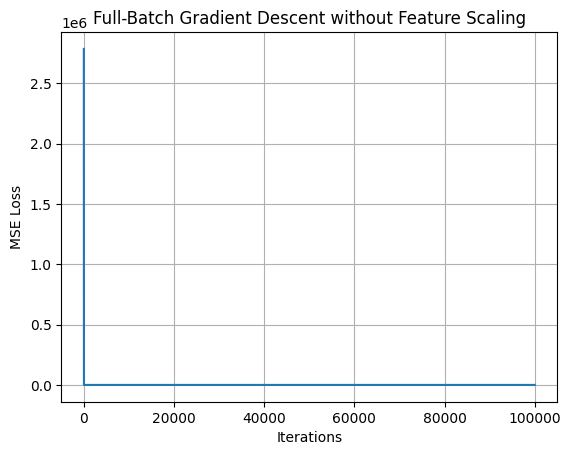

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Data generation (from your code)
num_samples = 100
np.random.seed(42)
x = np.random.uniform(0, 1000, num_samples)
f_x = 3 * x + 2
eps = np.random.randn(num_samples)
y = f_x + eps

# Compute empirical least-squares minimizer theta*
theta1_star = np.cov(x, y, bias=True)[0, 1] / np.var(x)
theta0_star = np.mean(y) - theta1_star * np.mean(x)
theta_star = np.array([theta0_star, theta1_star])
print("Least squares solution:", theta_star)

# Gradient Descent parameters
theta = np.array([0.0, 0.0])  # initial guess
eta = 1e-6  # small learning rate due to large x scale
epsilon = 0.001
max_iters = 100000

mse_history = []

for iter in range(max_iters):
    y_pred = theta[0] + theta[1] * x
    error = y_pred - y
    mse = np.mean(error**2)
    mse_history.append(mse)

    # Compute gradients
    grad0 = np.mean(error)
    grad1 = np.mean(error * x)
    grad = np.array([grad0, grad1])

    # Update parameters
    theta = theta - eta * grad

    # Convergence check
    if np.linalg.norm(theta - theta_star) < epsilon:
        print(f"Converged in {iter+1} iterations")
        break

# Final solution
print("Theta found by gradient descent:", theta)

# Plot MSE vs iterations
plt.plot(mse_history)
plt.xlabel("Iterations")
plt.ylabel("MSE Loss")
plt.title("Full-Batch Gradient Descent without Feature Scaling")
plt.grid(True)
plt.show()


Least squares solution (scaled): [1412.54114977  887.85858784]
Converged in 1426 iterations
Theta found by gradient descent: [1412.54030685  887.85805801]


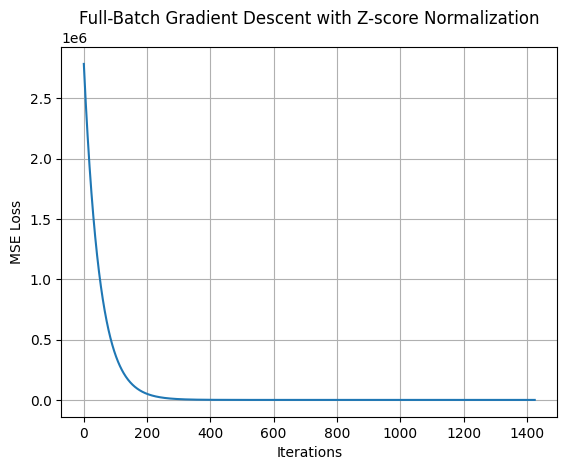

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Data generation
num_samples = 100
np.random.seed(42)
x = np.random.uniform(0, 1000, num_samples)
f_x = 3 * x + 2
eps = np.random.randn(num_samples)
y = f_x + eps

# Step 1: Z-score normalization
mu_x = np.mean(x)
sigma_x = np.std(x)
x_scaled = (x - mu_x) / sigma_x

# Step 2: Compute empirical least squares solution for scaled data
theta1_star = np.cov(x_scaled, y, bias=True)[0,1] / np.var(x_scaled)
theta0_star = np.mean(y) - theta1_star * np.mean(x_scaled)
theta_star = np.array([theta0_star, theta1_star])
print("Least squares solution (scaled):", theta_star)

# Step 3: Gradient Descent parameters
theta = np.array([0.0, 0.0])
eta = 0.01  # larger learning rate after scaling
epsilon = 0.001
max_iters = 10000
mse_history = []

# Step 4: Full-batch Gradient Descent
for iter in range(max_iters):
    y_pred = theta[0] + theta[1] * x_scaled
    error = y_pred - y
    mse = np.mean(error**2)
    mse_history.append(mse)

    grad0 = np.mean(error)
    grad1 = np.mean(error * x_scaled)
    theta = theta - eta * np.array([grad0, grad1])

    # Convergence check
    if np.linalg.norm(theta - theta_star) < epsilon:
        print(f"Converged in {iter+1} iterations")
        break

# Final solution
print("Theta found by gradient descent:", theta)

# Step 5: Plot MSE vs iterations
plt.plot(mse_history)
plt.xlabel("Iterations")
plt.ylabel("MSE Loss")
plt.title("Full-Batch Gradient Descent with Z-score Normalization")
plt.grid(True)
plt.show()


Least squares solution (scaled): [1412.54114977  887.85858784]
Converged in 1426 iterations
Theta found by gradient descent: [1412.54030685  887.85805801]


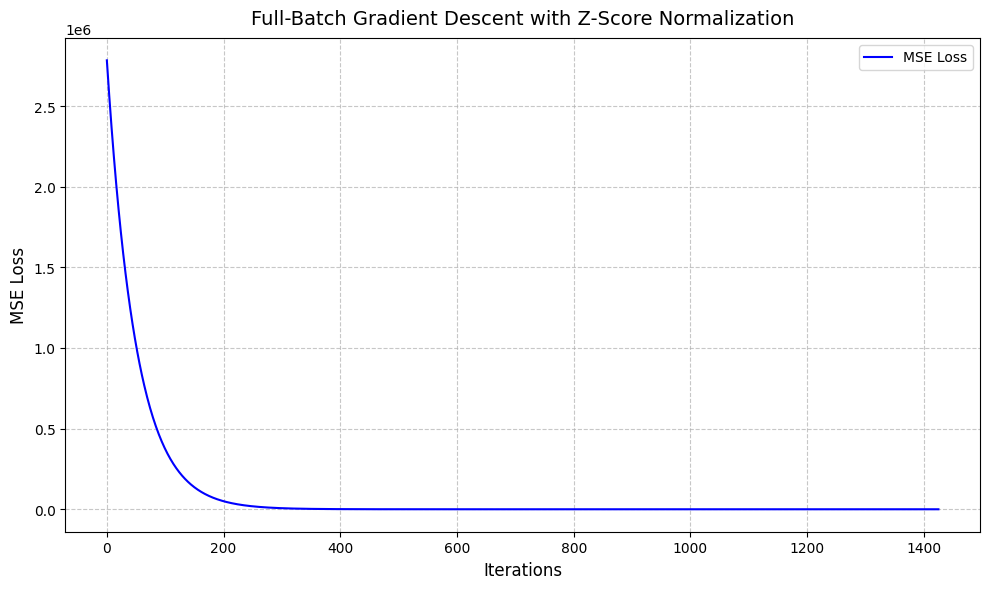

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Data
num_samples = 100
np.random.seed(42)
x = np.random.uniform(0, 1000, num_samples)
f_x = 3 * x + 2
eps = np.random.randn(num_samples)
y = f_x + eps

# Z-score normalization
mu_x = np.mean(x)
sigma_x = np.std(x)
x_scaled = (x - mu_x) / sigma_x

# Least squares solution for scaled data
theta1_star = np.cov(x_scaled, y, bias=True)[0,1] / np.var(x_scaled)
theta0_star = np.mean(y) - theta1_star * np.mean(x_scaled)
theta_star = np.array([theta0_star, theta1_star])
print("Least squares solution (scaled):", theta_star)

# Gradient descent
theta = np.array([0.0, 0.0])
eta = 0.01
epsilon = 0.001
max_iters = 10000
mse_history = []

for iter in range(max_iters):
    y_pred = theta[0] + theta[1] * x_scaled
    error = y_pred - y
    mse = np.mean(error**2)
    mse_history.append(mse)
    grad0 = np.mean(error)
    grad1 = np.mean(error * x_scaled)
    theta = theta - eta * np.array([grad0, grad1])
    if np.linalg.norm(theta - theta_star) < epsilon:
        print(f"Converged in {iter+1} iterations")
        break

print("Theta found by gradient descent:", theta)

# Plot MSE
plt.figure(figsize=(10, 6))
plt.plot(mse_history, label='MSE Loss', color='blue')
plt.xlabel('Iterations', fontsize=12)
plt.ylabel('MSE Loss', fontsize=12)
plt.title('Full-Batch Gradient Descent with Z-Score Normalization', fontsize=14, pad=10)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(fontsize=10)
plt.tight_layout()
plt.show()

Empirical least squares solution θ*: [2.21509616 2.99954023]
Converged in 1000000 iterations
Theta found by gradient descent: [0.96206697 3.00144881]


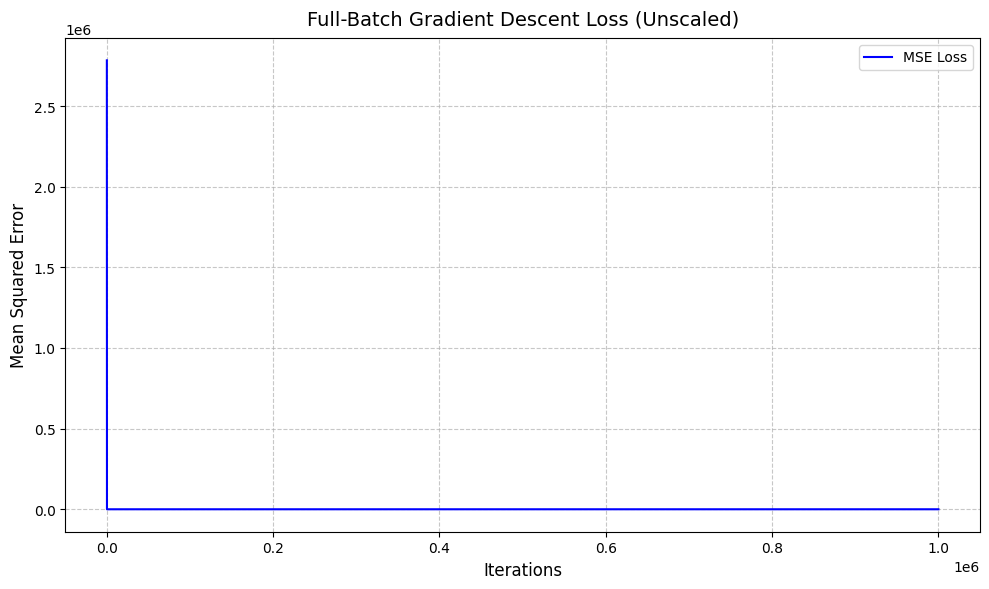

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Data
num_samples = 100
np.random.seed(42)
x = np.random.uniform(0, 1000, num_samples)
f_x = 3 * x + 2
eps = np.random.randn(num_samples)
y = f_x + eps

# Add bias term
X = np.vstack((np.ones(num_samples), x)).T  # shape (100, 2)

# Empirical least squares solution
theta_star = np.linalg.inv(X.T @ X) @ X.T @ y
print("Empirical least squares solution θ*:", theta_star)

# Gradient descent
theta = np.zeros(2)
alpha = 1e-6
epsilon = 0.001
max_iters = 1000000
mse_history = []
num_iters = 0

for i in range(max_iters):
    y_pred = X @ theta
    grad = (2/num_samples) * X.T @ (y_pred - y)
    theta = theta - alpha * grad
    mse = np.mean((y - y_pred)**2)
    mse_history.append(mse)
    num_iters += 1
    if np.linalg.norm(theta - theta_star) < epsilon:
        break

print(f"Converged in {num_iters} iterations")
print("Theta found by gradient descent:", theta)

# Plot MSE
plt.figure(figsize=(10, 6))
plt.plot(mse_history, label='MSE Loss', color='blue')
plt.xlabel('Iterations', fontsize=12)
plt.ylabel('Mean Squared Error', fontsize=12)
plt.title('Full-Batch Gradient Descent Loss (Unscaled)', fontsize=14, pad=10)
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(fontsize=10)
plt.tight_layout()
plt.show()

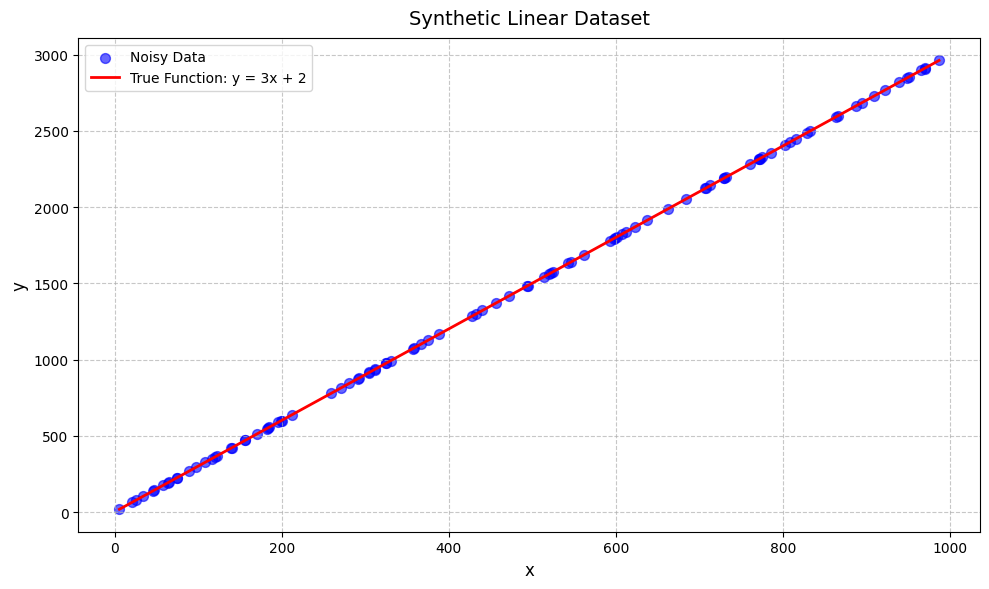

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Generate dataset
num_samples = 100
np.random.seed(42)
x = np.random.uniform(0, 1000, num_samples)
f_x = 3 * x + 2
eps = np.random.randn(num_samples)
y = f_x + eps

# Plot
plt.figure(figsize=(10, 6))
plt.scatter(x, y, color='blue', label='Noisy Data', alpha=0.6, s=50)
plt.plot(np.sort(x), 3 * np.sort(x) + 2, color='red', linewidth=2, label='True Function: y = 3x + 2')
plt.title('Synthetic Linear Dataset', fontsize=14, pad=10)
plt.xlabel('x', fontsize=12)
plt.ylabel('y', fontsize=12)
plt.legend(fontsize=10)
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# *Answer 3*

/tmp/ipython-input-1086843051.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y.append(series[i])


RMSE on test set: 2.2591


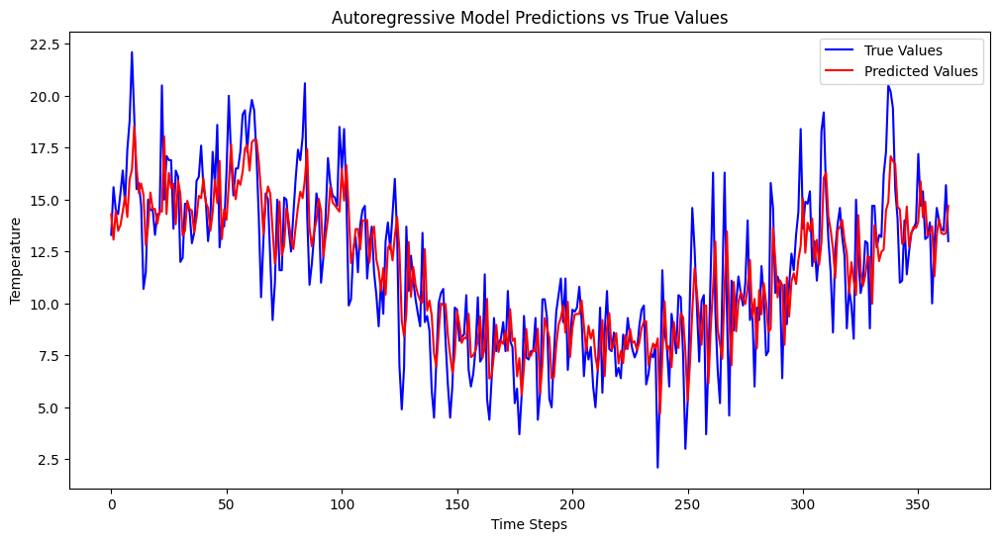

In [ ]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

# Load dataset
url = "https://raw.githubusercontent.com/jbrownlee/Datasets/master/daily-min-temperatures.csv"
data = pd.read_csv(url, parse_dates=['Date'], index_col='Date')
series = data['Temp']

# Prepare autoregressive features (AR order p)
p = 15  # You can change AR order here
X, y = [], []

for i in range(p, len(series)):
    X.append(series[i-p:i].values)  # past p values
    y.append(series[i])

X = np.array(X)
y = np.array(y)

# Split data into train and test (last 10% for test)
split_idx = int(len(X) * 0.9)
X_train, X_test = X[:split_idx], X[split_idx:]
y_train, y_test = y[:split_idx], y[split_idx:]

# Fit linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f"RMSE on test set: {rmse:.4f}")

# Plot true vs predicted
plt.figure(figsize=(12,6))
plt.plot(y_test, label='True Values', color='blue')
plt.plot(y_pred, label='Predicted Values', color='red')
plt.title('Autoregressive Model Predictions vs True Values')
plt.xlabel('Time Steps')
plt.ylabel('Temperature')
plt.legend()
plt.show()


/tmp/ipython-input-1249095711.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y.append(series[i])


RMSE on test set: 2.2591
            Actual  Predicted
Date                         
1981-01-01    20.7        NaN
1981-01-02    17.9        NaN
1981-01-03    18.8        NaN
1981-01-04    14.6        NaN
1981-01-05    15.8        NaN
1981-01-06    15.8        NaN
1981-01-07    15.8        NaN
1981-01-08    17.4        NaN
1981-01-09    21.8        NaN
1981-01-10    20.0        NaN
1981-01-11    16.2        NaN
1981-01-12    13.3        NaN
1981-01-13    16.7        NaN
1981-01-14    21.5        NaN
1981-01-15    25.0        NaN


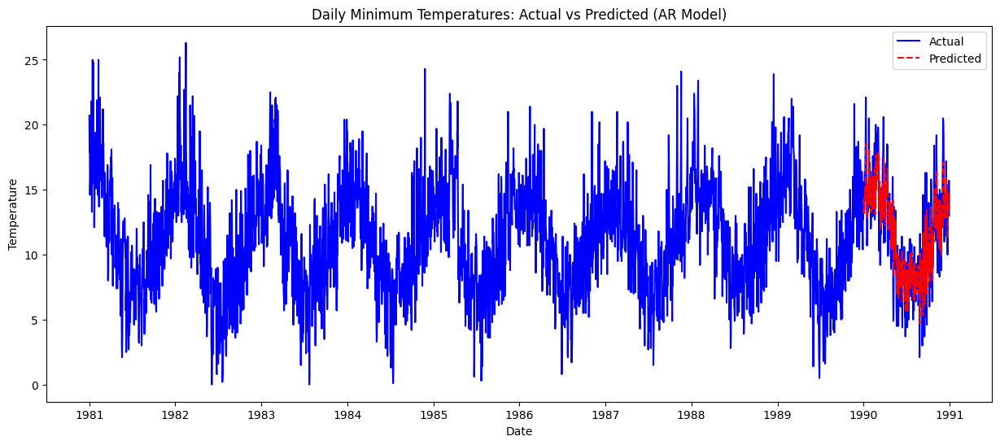

In [ ]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

# Load dataset
url = "https://raw.githubusercontent.com/jbrownlee/Datasets/master/daily-min-temperatures.csv"
data = pd.read_csv(url, parse_dates=['Date'], index_col='Date')
series = data['Temp']

# Prepare autoregressive features (AR order p)
p = 15  # AR order
X, y, dates = [], [], []

for i in range(p, len(series)):
    X.append(series[i-p:i].values)  # past p values
    y.append(series[i])
    dates.append(series.index[i])  # corresponding date

X = np.array(X)
y = np.array(y)
dates = np.array(dates)

# Split data into train and test (last 10% for test)
split_idx = int(len(X) * 0.9)
X_train, X_test = X[:split_idx], X[split_idx:]
y_train, y_test = y[:split_idx], y[split_idx:]
dates_train, dates_test = dates[:split_idx], dates[split_idx:]

# Fit linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Combine full dataset with predictions for plotting
full_pred = np.empty_like(series)
full_pred[:] = np.nan  # initialize with NaN
full_pred[split_idx + p:] = y_pred  # align predicted values with original dates

# RMSE for test set
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f"RMSE on test set: {rmse:.4f}")

# Create a DataFrame showing the whole series and predictions
result_df = pd.DataFrame({
    'Actual': series,
    'Predicted': full_pred
})

# Show first few rows
print(result_df.head(15))

# Plot full series vs predictions
plt.figure(figsize=(15,6))
plt.plot(result_df['Actual'], label='Actual', color='blue')
plt.plot(result_df['Predicted'], label='Predicted', color='red', linestyle='--')
plt.title('Daily Minimum Temperatures: Actual vs Predicted (AR Model)')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.legend()
plt.show()


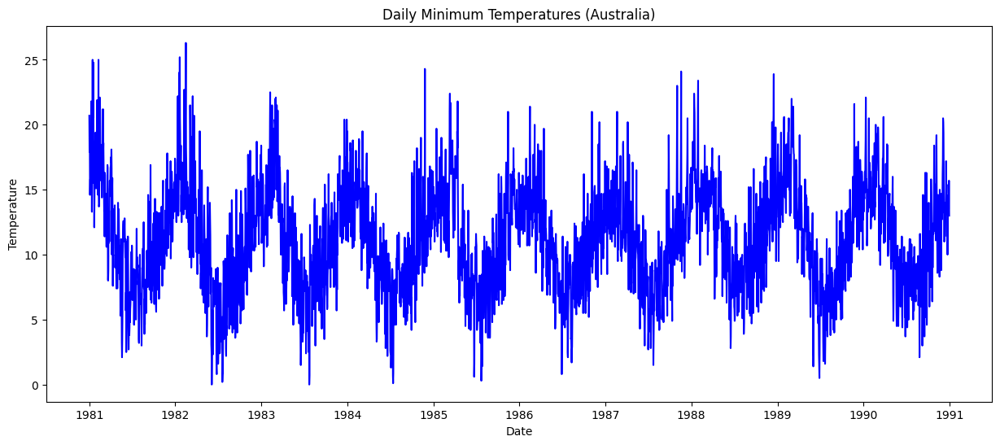

In [ ]:
# Import libraries
import pandas as pd

# Load dataset
url = "https://raw.githubusercontent.com/jbrownlee/Datasets/master/daily-min-temperatures.csv"
data = pd.read_csv(url, parse_dates=['Date'], index_col='Date')

# # Show the entire dataset (or first/last few rows if too long)
# print(data)        # prints the full dataset
# print(data.head()) # first 5 rows
# print(data.tail()) # last 5 rows

# Optional: plot the full series
import matplotlib.pyplot as plt

plt.figure(figsize=(15,6))
plt.plot(data.index, data['Temp'], color='blue')
plt.title('Daily Minimum Temperatures (Australia)')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.show()


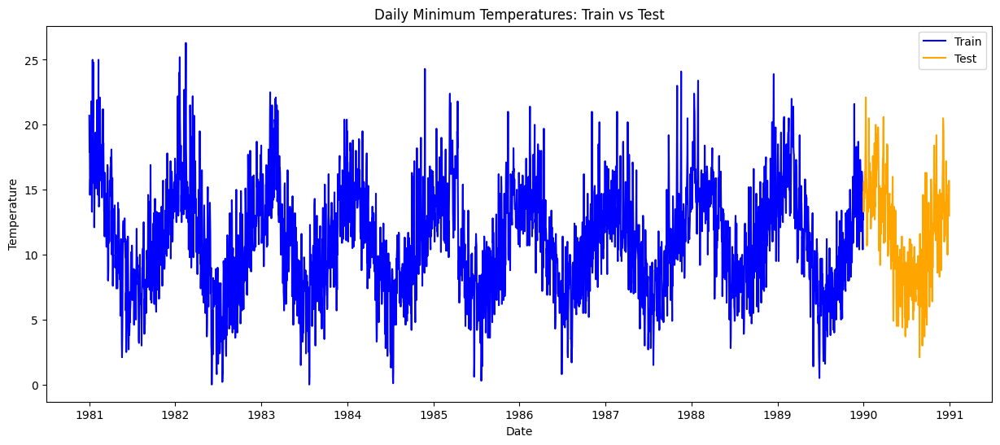

In [ ]:
# Import libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

# Load dataset
url = "https://raw.githubusercontent.com/jbrownlee/Datasets/master/daily-min-temperatures.csv"
data = pd.read_csv(url, parse_dates=['Date'], index_col='Date')

# Define AR order and test split
p = 3
split_idx = int(len(data) * 0.9)

# Split data into train and test
train = data.iloc[:split_idx]
test = data.iloc[split_idx:]

# Plot full series
plt.figure(figsize=(15,6))
plt.plot(train.index, train['Temp'], label='Train', color='blue')
plt.plot(test.index, test['Temp'], label='Test', color='orange')
plt.title('Daily Minimum Temperatures: Train vs Test')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.legend()
plt.show()


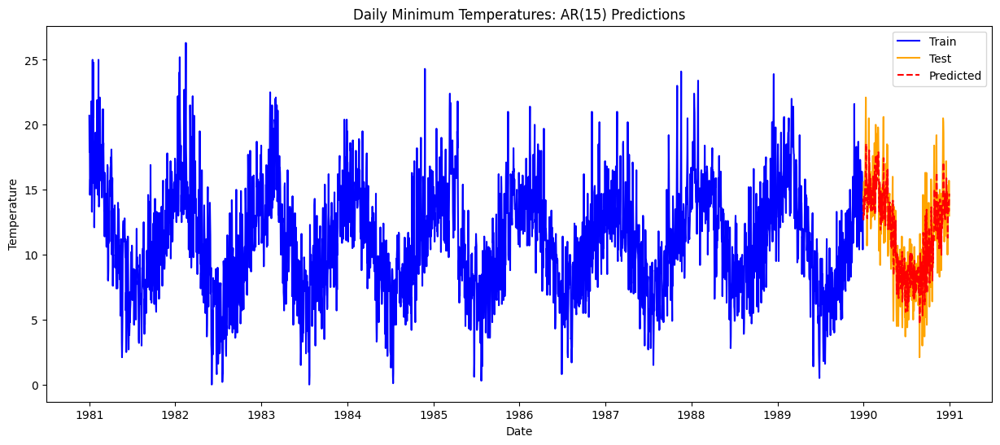

In [ ]:
# Import libraries
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from sklearn.linear_model import LinearRegression

# Load dataset
url = "https://raw.githubusercontent.com/jbrownlee/Datasets/master/daily-min-temperatures.csv"
data = pd.read_csv(url, parse_dates=['Date'], index_col='Date')

# Define AR order and test split
p = 15
split_idx = int(len(data) * 0.9)

# Split data into train and test
train = data.iloc[:split_idx]
test = data.iloc[split_idx:]

# Prepare autoregressive features for train
X_train, y_train = [], []
series = train['Temp'].values
for i in range(p, len(series)):
    X_train.append(series[i-p:i])
    y_train.append(series[i])
X_train, y_train = np.array(X_train), np.array(y_train)

# Fit linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Predict test set recursively
history = series[-p:].tolist()  # last p points from train
predictions = []

for t in range(len(test)):
    x_input = np.array(history[-p:]).reshape(1, -1)
    y_pred = model.predict(x_input)[0]
    predictions.append(y_pred)
    history.append(test['Temp'].values[t])  # feed actual test value (or use predicted for full recursive forecast)

# Plot train, test, and predicted values
plt.figure(figsize=(15,6))
plt.plot(train.index, train['Temp'], label='Train', color='blue')
plt.plot(test.index, test['Temp'], label='Test', color='orange')
plt.plot(test.index, predictions, label='Predicted', color='red', linestyle='--')
plt.title(f'Daily Minimum Temperatures: AR({p}) Predictions')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.legend()
plt.show()


/tmp/ipython-input-300317136.py:19: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y.append(series[i])


RMSE on test set: 2.2591


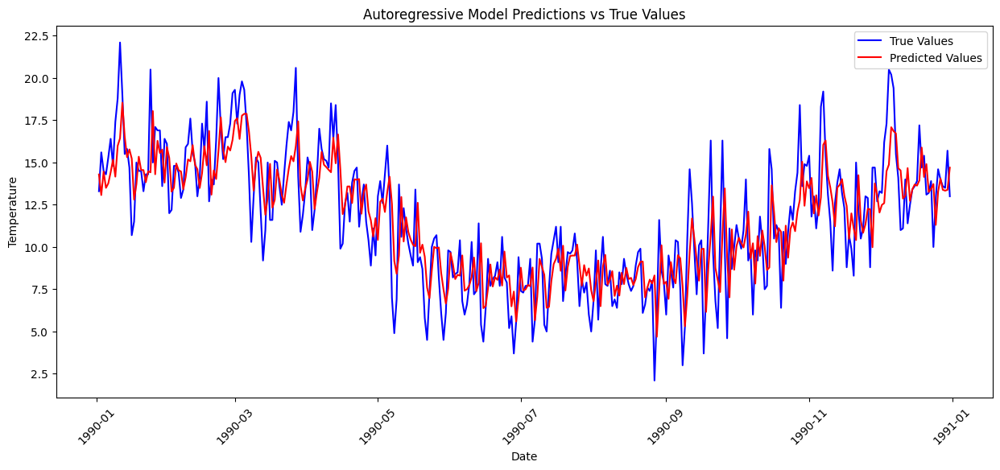

In [ ]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

# Load dataset
url = "https://raw.githubusercontent.com/jbrownlee/Datasets/master/daily-min-temperatures.csv"
data = pd.read_csv(url, parse_dates=['Date'], index_col='Date')
series = data['Temp']

# Prepare autoregressive features (AR order p)
p = 15  # AR order
X, y, dates = [], [], []

for i in range(p, len(series)):
    X.append(series[i-p:i].values)  # past p values
    y.append(series[i])
    dates.append(series.index[i])  # store corresponding date

X = np.array(X)
y = np.array(y)
dates = np.array(dates)

# Split data into train and test (last 10% for test)
split_idx = int(len(X) * 0.9)
X_train, X_test = X[:split_idx], X[split_idx:]
y_train, y_test = y[:split_idx], y[split_idx:]
dates_test = dates[split_idx:]

# Fit linear regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Calculate RMSE
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f"RMSE on test set: {rmse:.4f}")

# Plot true vs predicted with dates
plt.figure(figsize=(15,6))
plt.plot(dates_test, y_test, label='True Values', color='blue')
plt.plot(dates_test, y_pred, label='Predicted Values', color='red')
plt.title('Autoregressive Model Predictions vs True Values')
plt.xlabel('Date')
plt.ylabel('Temperature')
plt.xticks(rotation=45)
plt.legend()
plt.show()


/tmp/ipython-input-4228097910.py:18: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y.append(series[i])
/tmp/ipython-input-4228097910.py:18: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y.append(series[i])
/tmp/ipython-input-4228097910.py:18: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y.append(series[i])
/tmp/ipython-input-4228097910.py:18: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ve

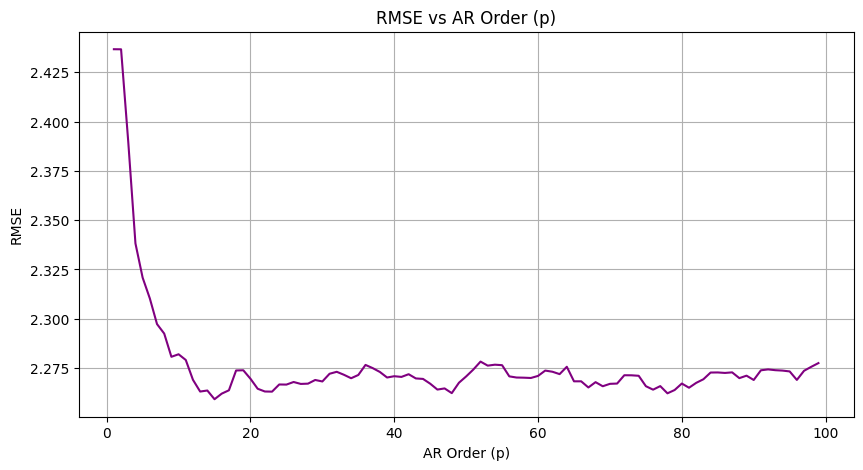

Best p = 15 with RMSE = 2.2591


In [ ]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

# Load dataset
url = "https://raw.githubusercontent.com/jbrownlee/Datasets/master/daily-min-temperatures.csv"
data = pd.read_csv(url, parse_dates=['Date'], index_col='Date')
series = data['Temp']

# Function to compute RMSE for a given AR order p
def compute_rmse(p):
    X, y = [], []
    for i in range(p, len(series)):
        X.append(series[i-p:i].values)
        y.append(series[i])
    X, y = np.array(X), np.array(y)

    # Split data (last 10% for test)
    split_idx = int(len(X) * 0.9)
    X_train, X_test = X[:split_idx], X[split_idx:]
    y_train, y_test = y[:split_idx], y[split_idx:]

    # Fit model and compute RMSE
    model = LinearRegression()
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    return rmse

# Test for different p values
p_values = range(1, 100)  # AR orders from 1 to 100
rmses = [compute_rmse(p) for p in p_values]

# Plot RMSE vs p
plt.figure(figsize=(10,5))
plt.plot(p_values, rmses, color='purple')
plt.title('RMSE vs AR Order (p)')
plt.xlabel('AR Order (p)')
plt.ylabel('RMSE')
plt.grid(True)
plt.show()

# Print the best p
best_p = p_values[np.argmin(rmses)]
print(f"Best p = {best_p} with RMSE = {min(rmses):.4f}")


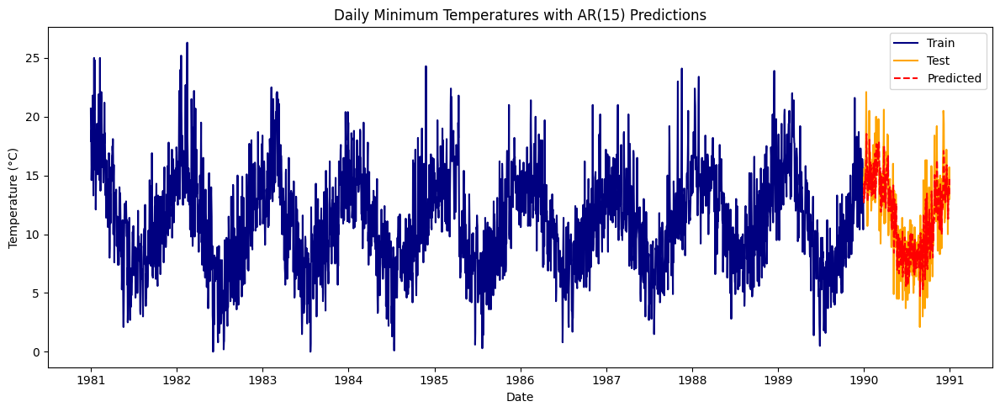

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression

url = "https://raw.githubusercontent.com/jbrownlee/Datasets/master/daily-min-temperatures.csv"
data = pd.read_csv(url, parse_dates=['Date'], index_col='Date')
p, split_idx = 15, int(len(data) * 0.9)
train, test = data.iloc[:split_idx], data.iloc[split_idx:]

X_train, y_train = [], []
series = train['Temp'].values
for i in range(p, len(series)):
    X_train.append(series[i-p:i])
    y_train.append(series[i])
X_train, y_train = np.array(X_train), np.array(y_train)

model = LinearRegression()
model.fit(X_train, y_train)

history = series[-p:].tolist()
predictions = []
for t in range(len(test)):
    x_input = np.array(history[-p:]).reshape(1, -1)
    y_pred = model.predict(x_input)[0]
    predictions.append(y_pred)
    history.append(test['Temp'].values[t])

plt.figure(figsize=(12, 5))
plt.plot(train.index, train['Temp'], label='Train', color='navy')
plt.plot(test.index, test['Temp'], label='Test', color='orange')
plt.plot(test.index, predictions, label='Predicted', color='red', linestyle='--')
plt.title('Daily Minimum Temperatures with AR(15) Predictions', fontsize=12)
plt.xlabel('Date', fontsize=10)
plt.ylabel('Temperature (°C)', fontsize=10)
plt.legend()
plt.tight_layout()
plt.show()

/tmp/ipython-input-3357729234.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y.append(series[j])
/tmp/ipython-input-3357729234.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y.append(series[j])
/tmp/ipython-input-3357729234.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  y.append(series[j])
/tmp/ipython-input-3357729234.py:32: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future ve

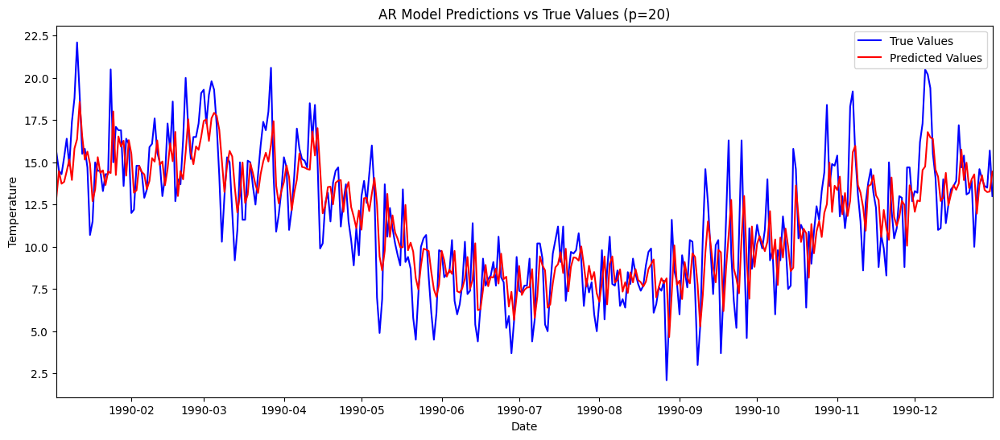

In [ ]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from matplotlib.animation import FuncAnimation, PillowWriter

# Load dataset
url = "https://raw.githubusercontent.com/jbrownlee/Datasets/master/daily-min-temperatures.csv"
data = pd.read_csv(url, parse_dates=['Date'], index_col='Date')
series = data['Temp']

# Range of AR orders
p_values = range(1, 21)  # AR(1) to AR(10)

# Prepare figure
fig, ax = plt.subplots(figsize=(15,6))
line_true, = ax.plot([], [], label='True Values', color='blue')
line_pred, = ax.plot([], [], label='Predicted Values', color='red')
title = ax.set_title('')
ax.set_xlabel('Date')
ax.set_ylabel('Temperature')
ax.legend()

# Animation function
def animate(i):
    p = p_values[i]
    X, y, dates = [], [], []
    for j in range(p, len(series)):
        X.append(series[j-p:j].values)
        y.append(series[j])
        dates.append(series.index[j])
    X, y, dates = np.array(X), np.array(y), np.array(dates)

    # Split train/test
    split_idx = int(len(X) * 0.9)
    X_train, X_test = X[:split_idx], X[split_idx:]
    y_train, y_test = y[:split_idx], y[split_idx:]
    dates_test = dates[split_idx:]

    # Fit model
    model = LinearRegression()
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    # Update lines
    line_true.set_data(dates_test, y_test)
    line_pred.set_data(dates_test, y_pred)
    title.set_text(f'AR Model Predictions vs True Values (p={p})')

    # Adjust x/y limits dynamically
    ax.set_xlim(dates_test[0], dates_test[-1])
    ax.set_ylim(min(y_test.min(), y_pred.min())-1, max(y_test.max(), y_pred.max())+1)

    return line_true, line_pred, title

# Create animation
anim = FuncAnimation(fig, animate, frames=len(p_values), interval=1000, blit=False)

# Save as GIF
anim.save('ar_predictions_animation.gif', writer=PillowWriter(fps=1))

plt.show()


# *Answer 4*

In [ ]:
import torch

In [ ]:
import os
if os.path.exists('dog.jpg'):
    print('dog.jpg exists')
else:
    !wget https://segment-anything.com/assets/gallery/AdobeStock_94274587_welsh_corgi_pembroke_CD.jpg -O dog.jpg

dog.jpg exists


In [ ]:
# Read in a image from torchvision
import torchvision
img = torchvision.io.read_image("dog.jpg")
print(img.shape)

torch.Size([3, 1365, 2048])


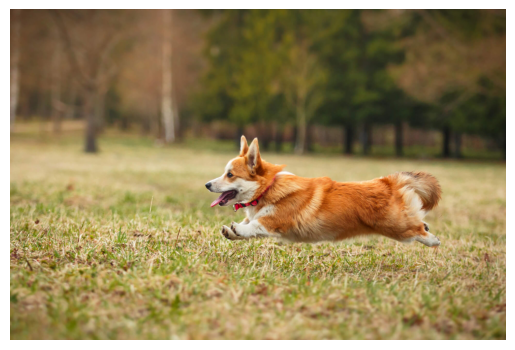

In [ ]:
import torchvision
import matplotlib.pyplot as plt

# Read the image (C, H, W) format
img = torchvision.io.read_image("dog.jpg")

# Convert from [C, H, W] → [H, W, C]
img = img.permute(1, 2, 0)

# Convert to float and normalize (matplotlib expects [0,1])
img = img.float() / 255.0

# Display
plt.imshow(img)
plt.axis('off')
plt.show()


torch.Size([1365, 2048])


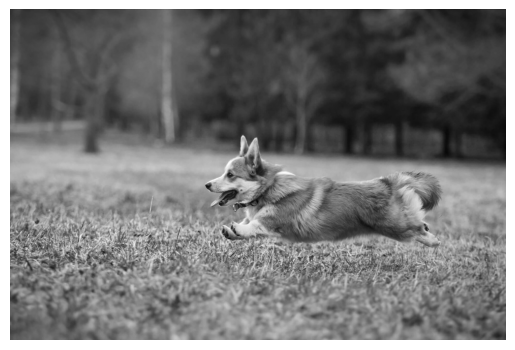

In [ ]:
import torch
import torchvision
import matplotlib.pyplot as plt

# Load and prepare
img = torchvision.io.read_image("dog.jpg").float() / 255.0  # [C, H, W]
img = img.permute(1, 2, 0)  # [H, W, C]

# Convert to grayscale (average over RGB channels)
gray = img.mean(dim=2)

print(gray.shape)  # should be [H, W]

plt.imshow(gray, cmap='gray')
plt.axis('off')
plt.show()


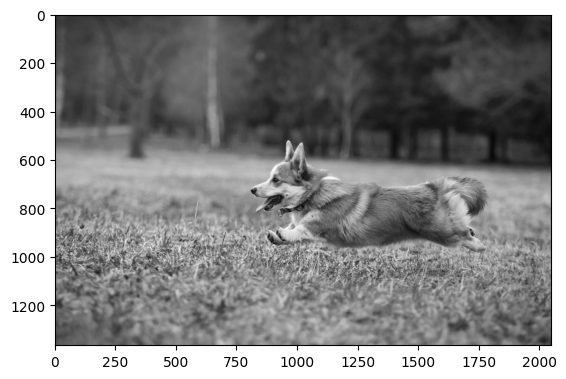

In [ ]:
import torch
import torchvision
import matplotlib.pyplot as plt

img = torchvision.io.read_image("dog.jpg").float() / 255.0  # [C, H, W]
img = img.permute(1, 2, 0)  # [H, W, C]

# Convert to grayscale
gray = img.mean(dim=2)  # or use weighted: 0.299*R + 0.587*G + 0.114*B

# Show grayscale image
plt.imshow(gray, cmap='gray', extent=[0, gray.shape[1], gray.shape[0], 0])
# plt.grid(True, color='red', linestyle='--', linewidth=0.3)
plt.show()




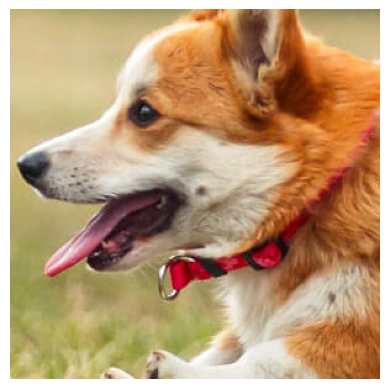

In [ ]:
import torchvision
import matplotlib.pyplot as plt

# Read the image (C, H, W) format
img = torchvision.io.read_image("dog.jpg")

# Define crop parameters
x, y = 800, 600   # top-left corner (row, column)
h, w = 300, 300   # height and width of crop

# Crop the image
# img is [C, H, W], so slicing order is [C, y:y+h, x:x+w]
cropped_img = img[:, y:y+h, x:x+w]

# Convert from [C, H, W] → [H, W, C]
cropped_img = cropped_img.permute(1, 2, 0)

# Convert to float and normalize for display
cropped_img = cropped_img.float() / 255.0

# Display cropped image
plt.imshow(cropped_img)
plt.axis('off')
plt.show()


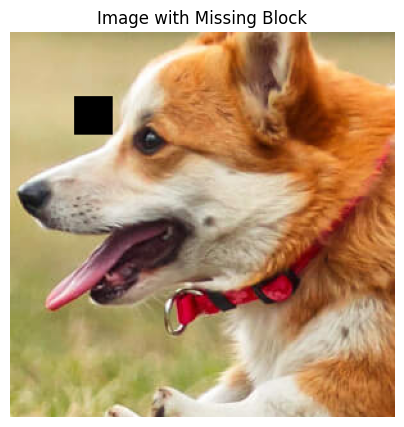

Channel 0, Iter 0, Loss 9.918502
Channel 0, Iter 200, Loss 0.006926
Channel 0, Iter 400, Loss 0.005721
Channel 0, Iter 600, Loss 0.005026
Channel 0, Iter 800, Loss 0.004353
Channel 1, Iter 0, Loss 10.474661
Channel 1, Iter 200, Loss 0.009106
Channel 1, Iter 400, Loss 0.006038
Channel 1, Iter 600, Loss 0.005011
Channel 1, Iter 800, Loss 0.004548
Channel 2, Iter 0, Loss 9.630691
Channel 2, Iter 200, Loss 0.008518
Channel 2, Iter 400, Loss 0.006024
Channel 2, Iter 600, Loss 0.005059
Channel 2, Iter 800, Loss 0.004721


RuntimeError: Can't call numpy() on Tensor that requires grad. Use tensor.detach().numpy() instead.

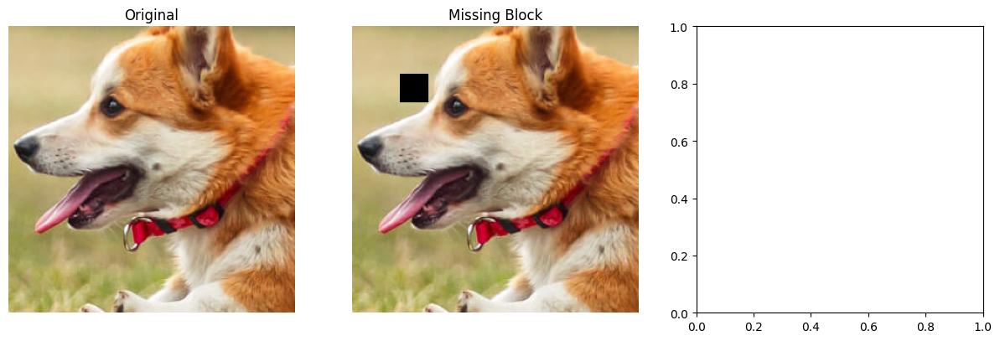

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
import numpy as np

# Use your cropped image
img = cropped_img.clone()  # [H, W, C], float in [0,1]
H, W, C = img.shape

# --- Step 1: Mask a 30x30 region ---
block_size = 30
top, left = 50, 50  # you can choose any position within the cropped image
mask = torch.ones_like(img)
mask[top:top+block_size, left:left+block_size, :] = 0

img_missing = img * mask

plt.figure(figsize=(5,5))
plt.imshow(img_missing)
plt.title("Image with Missing Block")
plt.axis('off')
plt.show()

# --- Step 2: Flatten image for low-rank reconstruction ---
# We'll treat each channel separately
r = 10  # chosen rank
reconstructed = torch.zeros_like(img)

for ch in range(C):
    Y = img_missing[:, :, ch]
    M = mask[:, :, ch]

    # Initialize low-rank matrices U, V
    U = torch.randn(H, r, requires_grad=True)
    V = torch.randn(W, r, requires_grad=True)

    optimizer = optim.Adam([U, V], lr=0.1)

    for i in range(1000):  # run till convergence
        optimizer.zero_grad()
        X_hat = U @ V.T
        loss = ((M * (X_hat - Y))**2).mean()
        loss.backward()
        optimizer.step()

        if i % 200 == 0:
            print(f"Channel {ch}, Iter {i}, Loss {loss.item():.6f}")

    reconstructed[:, :, ch] = U @ V.T

# Clip reconstructed values to [0,1]
reconstructed = torch.clamp(reconstructed, 0, 1)

# --- Step 3: Display original, missing, and reconstructed images ---
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.imshow(img)
plt.title("Original")
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(img_missing)
plt.title("Missing Block")
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(reconstructed)
plt.title("Reconstructed")
plt.axis('off')
plt.show()

# --- Step 4: Compute RMSE and PSNR ---
def compute_rmse_psnr(img1, img2):
    mse = ((img1 - img2)**2).mean().item()
    rmse = np.sqrt(mse)
    psnr = 20 * np.log10(1.0 / rmse)
    return rmse, psnr

rmse, psnr = compute_rmse_psnr(img, reconstructed)
print(f"RMSE: {rmse:.6f}, PSNR: {psnr:.2f} dB")


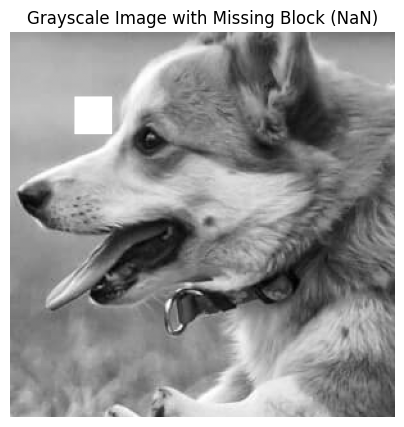

Iter 0, Loss 10.250575
Iter 200, Loss 0.007781
Iter 400, Loss 0.005120
Iter 600, Loss 0.004635
Iter 800, Loss 0.004317


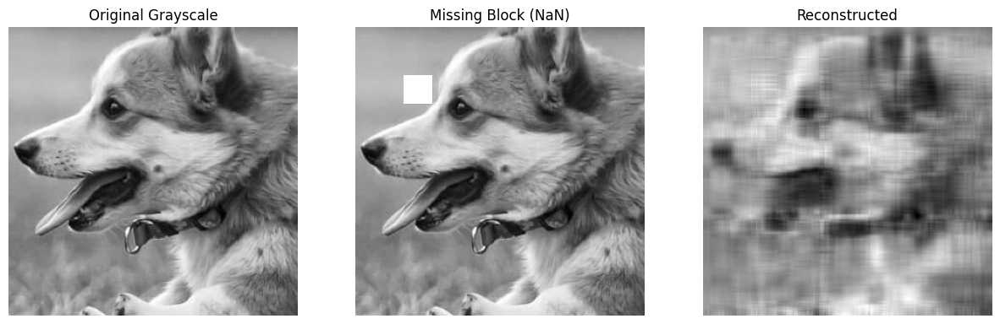

RMSE: 0.063477, PSNR: 23.95 dB


In [ ]:
import torch
import torch.optim as optim
import matplotlib.pyplot as plt
import numpy as np

# --- Step 0: Convert cropped image to grayscale ---
img_gray = img.mean(dim=2, keepdim=True)  # [H, W, 1]
H, W, C = img_gray.shape  # now C = 1

# --- Step 1: Fill a 30x30 region with NaN ---
block_size = 30
top, left = 50, 50  # choose position within image
img_missing = img_gray.clone()
img_missing[top:top+block_size, left:left+block_size, :] = float('nan')

plt.figure(figsize=(5,5))
plt.imshow(img_missing.squeeze(), cmap='gray')
plt.title("Grayscale Image with Missing Block (NaN)")
plt.axis('off')
plt.show()

# --- Step 2: Low-rank reconstruction (ignore NaNs) ---
r = 10
reconstructed = torch.zeros_like(img_gray)
Y = img_missing[:, :, 0]

# Create a mask: 1 where not NaN, 0 where NaN
M = (~torch.isnan(Y)).float()
Y_filled = torch.nan_to_num(Y, nan=0.0)  # replace NaNs with 0 for computation

U = torch.randn(H, r, requires_grad=True)
V = torch.randn(W, r, requires_grad=True)
optimizer = optim.Adam([U, V], lr=0.1)

for i in range(1000):
    optimizer.zero_grad()
    X_hat = U @ V.T
    loss = ((M * (X_hat - Y_filled))**2).mean()
    loss.backward()
    optimizer.step()

    if i % 200 == 0:
        print(f"Iter {i}, Loss {loss.item():.6f}")

reconstructed[:, :, 0] = U @ V.T
reconstructed = torch.clamp(reconstructed, 0, 1)

# --- Step 3: Display images ---
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.imshow(img_gray.squeeze(), cmap='gray')
plt.title("Original Grayscale")
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(img_missing.squeeze(), cmap='gray')
plt.title("Missing Block (NaN)")
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(reconstructed.detach().squeeze(), cmap='gray')
plt.title("Reconstructed")
plt.axis('off')
plt.show()

# --- Step 4: Compute RMSE and PSNR ---
def compute_rmse_psnr(img1, img2):
    mse = ((img1 - img2)**2).mean().item()
    rmse = np.sqrt(mse)
    psnr = 20 * np.log10(1.0 / rmse)
    return rmse, psnr

rmse, psnr = compute_rmse_psnr(img_gray.detach(), reconstructed.detach())
print(f"RMSE: {rmse:.6f}, PSNR: {psnr:.2f} dB")


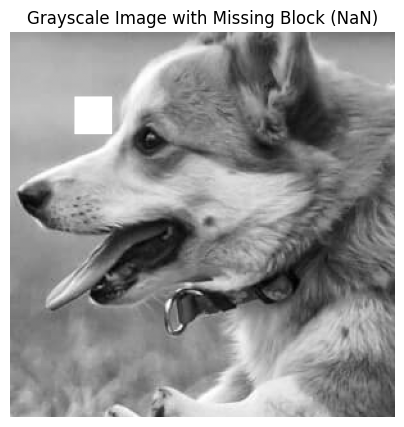

Rank 5: RMSE=0.089847, PSNR=20.93 dB
Rank 10: RMSE=0.063054, PSNR=24.01 dB
Rank 15: RMSE=0.056314, PSNR=24.99 dB
Rank 20: RMSE=0.049229, PSNR=26.16 dB
Rank 25: RMSE=0.045024, PSNR=26.93 dB
Rank 30: RMSE=0.041229, PSNR=27.70 dB
Rank 35: RMSE=0.040441, PSNR=27.86 dB
Rank 40: RMSE=0.039018, PSNR=28.17 dB
Rank 45: RMSE=0.037200, PSNR=28.59 dB
Rank 50: RMSE=0.036717, PSNR=28.70 dB
Rank 55: RMSE=0.036629, PSNR=28.72 dB
Rank 60: RMSE=0.034507, PSNR=29.24 dB
Rank 65: RMSE=0.034409, PSNR=29.27 dB
Rank 70: RMSE=0.031307, PSNR=30.09 dB
Rank 75: RMSE=0.030640, PSNR=30.27 dB
Rank 80: RMSE=0.030318, PSNR=30.37 dB
Rank 85: RMSE=0.030538, PSNR=30.30 dB
Rank 90: RMSE=0.028240, PSNR=30.98 dB
Rank 95: RMSE=0.028863, PSNR=30.79 dB
Rank 100: RMSE=0.028078, PSNR=31.03 dB

Best rank: 100 with RMSE=0.028078


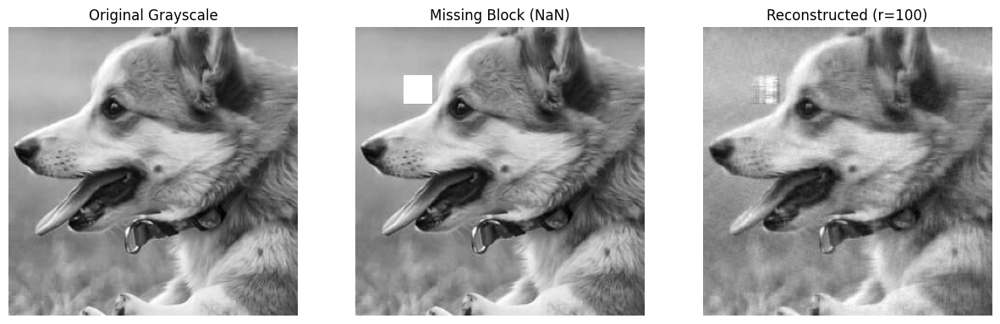

In [ ]:
import torch
import torch.optim as optim
import matplotlib.pyplot as plt
import numpy as np

# --- Step 0: Convert cropped image to grayscale ---
img_gray = img.mean(dim=2, keepdim=True)  # [H, W, 1]
H, W, C = img_gray.shape  # now C = 1

# --- Step 1: Fill a 30x30 region with NaN ---
block_size = 30
top, left = 50, 50
img_missing = img_gray.clone()
img_missing[top:top+block_size, left:left+block_size, :] = float('nan')

plt.figure(figsize=(5,5))
plt.imshow(img_missing.squeeze(), cmap='gray')
plt.title("Grayscale Image with Missing Block (NaN)")
plt.axis('off')
plt.show()

# --- Step 2: Function for low-rank reconstruction (ignore NaNs) ---
def low_rank_reconstruction(Y, rank, lr=0.1, steps=1000):
    H, W = Y.shape
    # Mask: 1 where not NaN, 0 where NaN
    M = (~torch.isnan(Y)).float()
    Y_filled = torch.nan_to_num(Y, nan=0.0)  # replace NaNs with 0 for computation

    U = torch.randn(H, rank, requires_grad=True)
    V = torch.randn(W, rank, requires_grad=True)
    optimizer = optim.Adam([U, V], lr=lr)

    for i in range(steps):
        optimizer.zero_grad()
        X_hat = U @ V.T
        loss = ((M * (X_hat - Y_filled))**2).mean()
        loss.backward()
        optimizer.step()

    X_recon = torch.clamp(U @ V.T, 0, 1)
    return X_recon.detach()

# --- Step 3: Try multiple ranks ---
Y = img_missing[:, :, 0]

rank_list = [5, 10, 15, 20, 25, 30 ,35, 40 , 45, 50, 55, 60, 65, 70, 75, 80, 85, 90, 95, 100]
best_rmse = float('inf')
best_rank = None
best_recon = None

for r in rank_list:
    recon = low_rank_reconstruction(Y, rank=r)
    mse = ((recon - img_gray[:, :, 0])**2).mean().item()
    rmse = np.sqrt(mse)
    psnr = 20 * np.log10(1.0 / rmse)
    print(f"Rank {r}: RMSE={rmse:.6f}, PSNR={psnr:.2f} dB")

    if rmse < best_rmse:
        best_rmse = rmse
        best_rank = r
        best_recon = recon

print(f"\nBest rank: {best_rank} with RMSE={best_rmse:.6f}")

# --- Step 4: Display original, missing, and best reconstructed images ---
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.imshow(img_gray.squeeze(), cmap='gray')
plt.title("Original Grayscale")
plt.axis('off')

plt.subplot(1,3,2)
plt.imshow(img_missing.squeeze(), cmap='gray')
plt.title("Missing Block (NaN)")
plt.axis('off')

plt.subplot(1,3,3)
plt.imshow(best_recon.squeeze(), cmap='gray')
plt.title(f"Reconstructed (r={best_rank})")
plt.axis('off')
plt.show()


Cropped image shape: 300x300
Epoch 200/2000, Loss: 0.002670
Epoch 400/2000, Loss: 0.001723
Epoch 600/2000, Loss: 0.001347
Epoch 800/2000, Loss: 0.001177
Epoch 1000/2000, Loss: 0.001056
Epoch 1200/2000, Loss: 0.000970
Epoch 1400/2000, Loss: 0.000910
Epoch 1600/2000, Loss: 0.000866
Epoch 1800/2000, Loss: 0.000834
Epoch 2000/2000, Loss: 0.000813
Epoch 200/2000, Loss: 0.002592
Epoch 400/2000, Loss: 0.001701
Epoch 600/2000, Loss: 0.001371
Epoch 800/2000, Loss: 0.001190
Epoch 1000/2000, Loss: 0.001073
Epoch 1200/2000, Loss: 0.000998
Epoch 1400/2000, Loss: 0.000940
Epoch 1600/2000, Loss: 0.000891
Epoch 1800/2000, Loss: 0.000851
Epoch 2000/2000, Loss: 0.000873

Metrics:
Rectangular missing region: RMSE=0.2886, PSNR=27.86 dB
Random missing pixels:      RMSE=0.0371, PSNR=30.47 dB


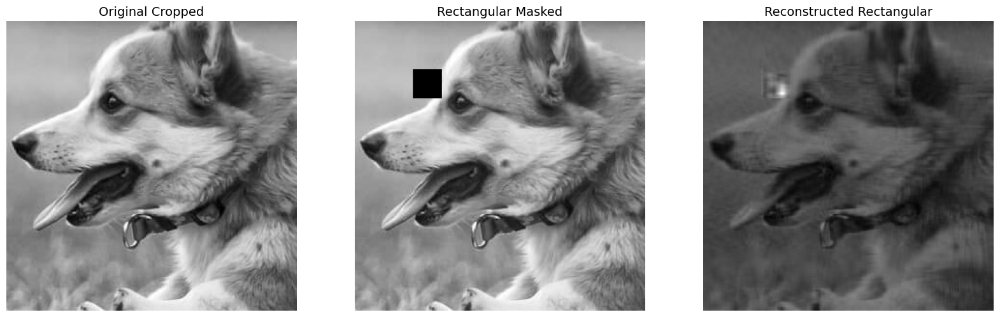

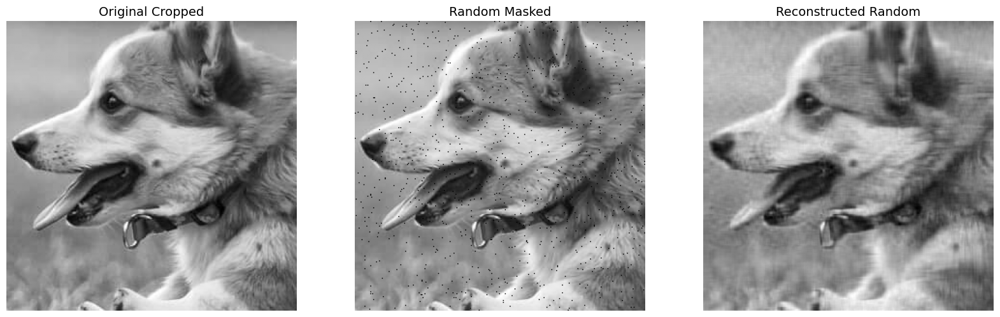

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import matplotlib.pyplot as plt
import numpy as np
from skimage.metrics import peak_signal_noise_ratio as psnr

# -----------------------------
# Helper Functions
# -----------------------------
def compute_rmse(img_true, img_pred, mask=None):
    if mask is None:
        mask = torch.ones_like(img_true)
    diff = (img_true - img_pred) * mask
    mse = torch.sum(diff**2) / torch.sum(mask)
    return torch.sqrt(mse).item()

def plot_side_by_side(images, titles, figsize=(18,6)):
    """Display images side by side with larger size"""
    n = len(images)
    plt.figure(figsize=figsize)
    for i in range(n):
        plt.subplot(1, n, i+1)
        plt.imshow(images[i], cmap='gray')
        plt.title(titles[i], fontsize=14)
        plt.axis('off')
    plt.show()

# -----------------------------
# Step 1: Load, crop, and preprocess image
# -----------------------------
img = torchvision.io.read_image("dog.jpg").float()  # [C,H,W]

# Crop parameters
x, y, h, w = 800, 600, 300, 300  # top-left corner (x,y) and size

# Crop the image
cropped_img = img[:, y:y+h, x:x+w]

# Convert to grayscale
img_gray = cropped_img.mean(dim=0)  # [H, W]
img_gray /= 255.0  # normalize to [0,1]

H, W = img_gray.shape
print(f"Cropped image shape: {H}x{W}")

# -----------------------------
# Step 2: Create masks
# -----------------------------
mask_rect = torch.ones_like(img_gray)
mask_rect[50:80, 60:90] = 0

mask_rand = torch.ones_like(img_gray)
missing_indices = torch.randperm(H*W)[:900]
mask_rand.view(-1)[missing_indices] = 0

# -----------------------------
# Step 3: Low-rank matrix factorization reconstruction
# -----------------------------
def low_rank_reconstruct(img, mask, rank=30, lr=0.2, epochs=2000):
    H, W = img.shape
    U = torch.randn(H, rank, requires_grad=True)
    V = torch.randn(rank, W, requires_grad=True)
    optimizer = optim.Adam([U, V], lr=lr)

    for epoch in range(epochs):
        optimizer.zero_grad()
        pred = U @ V
        loss = torch.sum(((pred - img) * mask)**2) / torch.sum(mask)
        loss.backward()
        optimizer.step()
        if (epoch+1) % 200 == 0:
            print(f"Epoch {epoch+1}/{epochs}, Loss: {loss.item():.6f}")

    return (U @ V).detach()

recon_rect = low_rank_reconstruct(img_gray, mask_rect, rank=30, lr=0.2, epochs=2000)
recon_rand = low_rank_reconstruct(img_gray, mask_rand, rank=30, lr=0.2, epochs=2000)

# -----------------------------
# Step 4: Compute metrics
# -----------------------------
rmse_rect = compute_rmse(img_gray, recon_rect, mask=(1-mask_rect))
rmse_rand = compute_rmse(img_gray, recon_rand, mask=(1-mask_rand))

psnr_rect = psnr(img_gray.numpy(), recon_rect.numpy(), data_range=1)
psnr_rand = psnr(img_gray.numpy(), recon_rand.numpy(), data_range=1)

print("\nMetrics:")
print(f"Rectangular missing region: RMSE={rmse_rect:.4f}, PSNR={psnr_rect:.2f} dB")
print(f"Random missing pixels:      RMSE={rmse_rand:.4f}, PSNR={psnr_rand:.2f} dB")

# -----------------------------
# Step 5: Display side by side (bigger)
# -----------------------------
# Rectangular missing block
plot_side_by_side([img_gray, img_gray*mask_rect, recon_rect],
                  ["Original Cropped", "Rectangular Masked", "Reconstructed Rectangular"],
                  figsize=(20,8))

# Random missing pixels
plot_side_by_side([img_gray, img_gray*mask_rand, recon_rand],
                  ["Original Cropped", "Random Masked", "Reconstructed Random"],
                  figsize=(20,8))


Cropped image shape: 300x300
Epoch 500/2000, Loss=0.001615
Epoch 1000/2000, Loss=0.001109
Epoch 1500/2000, Loss=0.000926
Epoch 2000/2000, Loss=0.000842

Rectangular 30x30 reconstruction metrics:
RMSE = 0.2473
PSNR = 28.40 dB


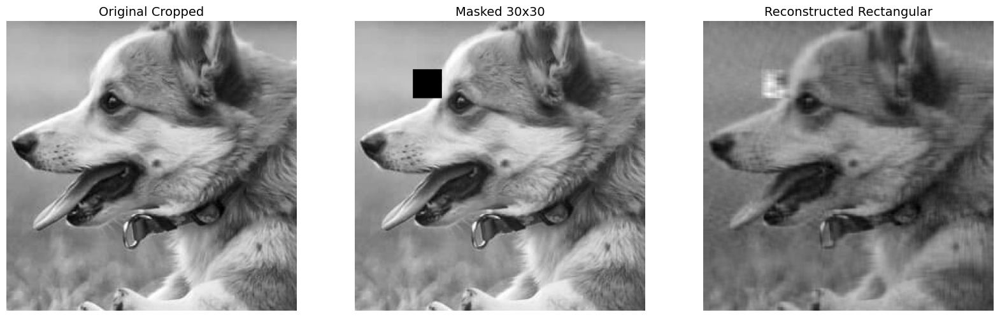

In [73]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr

# -----------------------------
# Helper Functions
# -----------------------------
def compute_rmse(img_true, img_pred, mask=None):
    """Compute RMSE over the masked region"""
    if mask is None:
        mask = torch.ones_like(img_true)
    diff = (img_true - img_pred) * mask
    mse = torch.sum(diff**2) / torch.sum(mask)
    return torch.sqrt(mse).item()

def plot_side_by_side(images, titles, figsize=(20,8)):
    """Plot multiple images side by side"""
    n = len(images)
    plt.figure(figsize=figsize)
    for i in range(n):
        plt.subplot(1,n,i+1)
        plt.imshow(images[i], cmap='gray')
        plt.title(titles[i], fontsize=14)
        plt.axis('off')
    plt.show()

# -----------------------------
# Step 1: Load and crop image
# -----------------------------
img = torchvision.io.read_image("dog.jpg").float()  # [C,H,W]

# Crop parameters
x_crop, y_crop, h, w = 800, 600, 300, 300
cropped_img = img[:, y_crop:y_crop+h, x_crop:x_crop+w]

# Convert to grayscale
img_gray = cropped_img.mean(dim=0) / 255.0  # [H,W]

H, W = img_gray.shape
print(f"Cropped image shape: {H}x{W}")

# -----------------------------
# Step 2: Create 30x30 rectangular mask
# -----------------------------
mask_rect = torch.ones_like(img_gray)
mask_rect[50:80, 60:90] = 0  # 30x30 missing block

# -----------------------------
# Step 3: Low-rank matrix factorization reconstruction
# -----------------------------
def low_rank_reconstruct(img, mask, rank=30, lr=0.2, epochs=2000):
    H, W = img.shape
    U = torch.randn(H, rank, requires_grad=True)
    V = torch.randn(rank, W, requires_grad=True)
    optimizer = optim.Adam([U, V], lr=lr)

    for epoch in range(epochs):
        optimizer.zero_grad()
        pred = U @ V
        loss = torch.sum(((pred - img) * mask)**2) / torch.sum(mask)
        loss.backward()
        optimizer.step()
        if (epoch+1) % 500 == 0:
            print(f"Epoch {epoch+1}/{epochs}, Loss={loss.item():.6f}")
    return (U @ V).detach()

# Reconstruct
recon_rect = low_rank_reconstruct(img_gray, mask_rect, rank=30)

# -----------------------------
# Step 4: Compute metrics
# -----------------------------
rmse_rect = compute_rmse(img_gray, recon_rect, mask=(1-mask_rect))
psnr_rect = psnr(img_gray.numpy(), recon_rect.numpy(), data_range=1)

print(f"\nRectangular 30x30 reconstruction metrics:")
print(f"RMSE = {rmse_rect:.4f}")
print(f"PSNR = {psnr_rect:.2f} dB")

# -----------------------------
# Step 5: Display side by side
# -----------------------------
plot_side_by_side(
    [img_gray, img_gray*mask_rect, recon_rect],
    ["Original Cropped", "Masked 30x30", "Reconstructed Rectangular"],
    figsize=(20,8)
)


Cropped image shape: 300x300
Epoch 500/2000, Loss=0.001523
Epoch 1000/2000, Loss=0.001113
Epoch 1500/2000, Loss=0.000905
Epoch 2000/2000, Loss=0.000823

Random 900 pixels reconstruction metrics:
RMSE = 0.0358
PSNR = 30.82 dB


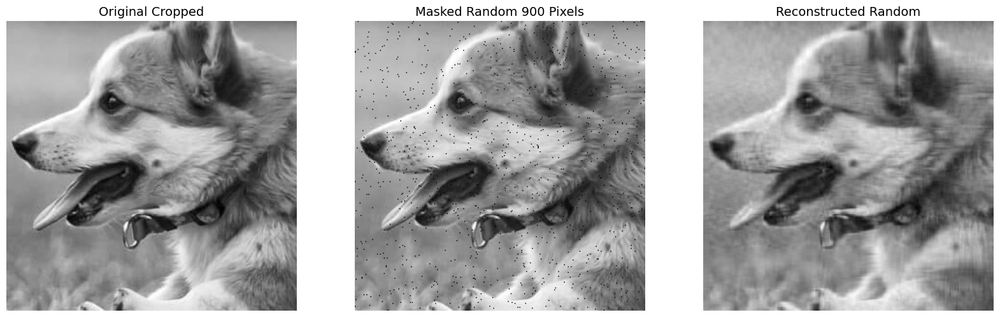

In [72]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr

# -----------------------------
# Helper Functions
# -----------------------------
def compute_rmse(img_true, img_pred, mask=None):
    """Compute RMSE over the masked region"""
    if mask is None:
        mask = torch.ones_like(img_true)
    diff = (img_true - img_pred) * mask
    mse = torch.sum(diff**2) / torch.sum(mask)
    return torch.sqrt(mse).item()

def plot_side_by_side(images, titles, figsize=(20,8)):
    """Plot multiple images side by side"""
    n = len(images)
    plt.figure(figsize=figsize)
    for i in range(n):
        plt.subplot(1,n,i+1)
        plt.imshow(images[i], cmap='gray')
        plt.title(titles[i], fontsize=14)
        plt.axis('off')
    plt.show()

# -----------------------------
# Step 1: Load and crop image
# -----------------------------
img = torchvision.io.read_image("dog.jpg").float()  # [C,H,W]

# Crop parameters
x_crop, y_crop, h, w = 800, 600, 300, 300
cropped_img = img[:, y_crop:y_crop+h, x_crop:x_crop+w]

# Convert to grayscale
img_gray = cropped_img.mean(dim=0) / 255.0  # [H,W]

H, W = img_gray.shape
print(f"Cropped image shape: {H}x{W}")

# -----------------------------
# Step 2: Create random mask (900 pixels missing)
# -----------------------------
mask_rand = torch.ones_like(img_gray)
missing_indices = torch.randperm(H*W)[:900]
mask_rand.view(-1)[missing_indices] = 0

# -----------------------------
# Step 3: Low-rank matrix factorization reconstruction
# -----------------------------
def low_rank_reconstruct(img, mask, rank=30, lr=0.2, epochs=2000):
    H, W = img.shape
    U = torch.randn(H, rank, requires_grad=True)
    V = torch.randn(rank, W, requires_grad=True)
    optimizer = optim.Adam([U, V], lr=lr)

    for epoch in range(epochs):
        optimizer.zero_grad()
        pred = U @ V
        loss = torch.sum(((pred - img) * mask)**2) / torch.sum(mask)
        loss.backward()
        optimizer.step()
        if (epoch+1) % 500 == 0:
            print(f"Epoch {epoch+1}/{epochs}, Loss={loss.item():.6f}")
    return (U @ V).detach()

# Reconstruct
recon_rand = low_rank_reconstruct(img_gray, mask_rand, rank=30)

# -----------------------------
# Step 4: Compute metrics
# -----------------------------
rmse_rand = compute_rmse(img_gray, recon_rand, mask=(1-mask_rand))
psnr_rand = psnr(img_gray.numpy(), recon_rand.numpy(), data_range=1)

print(f"\nRandom 900 pixels reconstruction metrics:")
print(f"RMSE = {rmse_rand:.4f}")
print(f"PSNR = {psnr_rand:.2f} dB")

# -----------------------------
# Step 5: Display side by side
# -----------------------------
plot_side_by_side(
    [img_gray, img_gray*mask_rand, recon_rand],
    ["Original Cropped", "Masked Random 900 Pixels", "Reconstructed Random"],
    figsize=(20,8)
)


Cropped image shape: 300x300

Metrics (ALS):
Rectangular missing region: RMSE=0.6778, PSNR=22.72 dB
Random missing pixels:      RMSE=0.0376, PSNR=31.09 dB


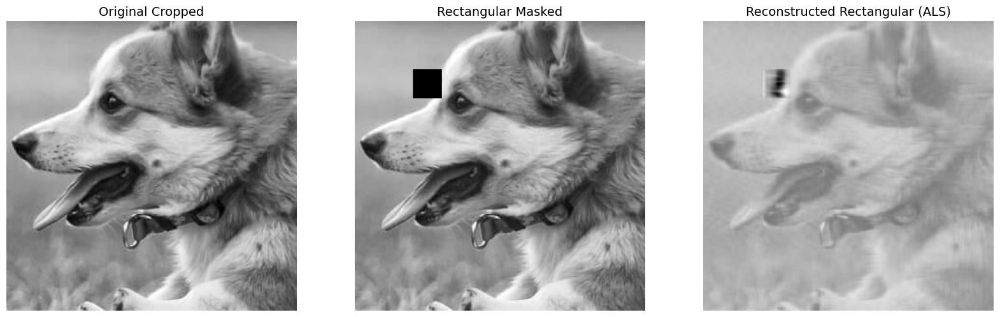

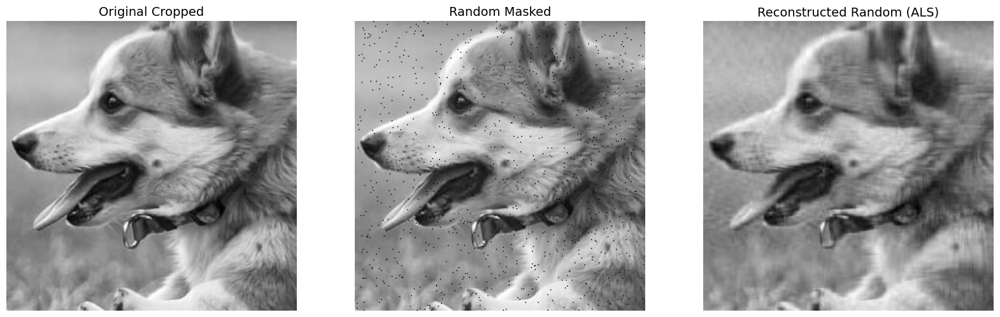

In [ ]:
import torch
import torchvision
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr

# -----------------------------
# Helper Functions
# -----------------------------
def compute_rmse(img_true, img_pred, mask=None):
    if mask is None:
        mask = torch.ones_like(img_true)
    diff = (img_true - img_pred) * mask
    mse = torch.sum(diff**2) / torch.sum(mask)
    return torch.sqrt(mse).item()

def plot_side_by_side(images, titles, figsize=(18,6)):
    n = len(images)
    plt.figure(figsize=figsize)
    for i in range(n):
        plt.subplot(1, n, i+1)
        plt.imshow(images[i], cmap='gray')
        plt.title(titles[i], fontsize=14)
        plt.axis('off')
    plt.show()

# -----------------------------
# Step 1: Load and crop image
# -----------------------------
img = torchvision.io.read_image("dog.jpg").float()
x, y, h, w = 800, 600, 300, 300
cropped_img = img[:, y:y+h, x:x+w]
img_gray = cropped_img.mean(dim=0) / 255.0
H, W = img_gray.shape
print(f"Cropped image shape: {H}x{W}")

# -----------------------------
# Step 2: Create masks
# -----------------------------
mask_rect = torch.ones_like(img_gray)
mask_rect[50:80, 60:90] = 0

mask_rand = torch.ones_like(img_gray)
missing_indices = torch.randperm(H*W)[:900]
mask_rand.view(-1)[missing_indices] = 0

# -----------------------------
# Step 3: Alternating Least Squares function
# -----------------------------
def als_reconstruct(img, mask, rank=30, iterations=20):
    """
    ALS for low-rank matrix factorization:
    img: [H,W] image
    mask: observed pixels (1=observed, 0=missing)
    rank: latent rank
    iterations: number of ALS iterations
    """
    H, W = img.shape
    # Initialize U and V randomly
    U = torch.randn(H, rank)
    V = torch.randn(rank, W)

    # Precompute mask
    M = mask

    for it in range(iterations):
        # Update U: solve least squares for each row
        for i in range(H):
            idx = M[i, :] == 1  # observed columns
            V_sub = V[:, idx]
            img_sub = img[i, idx]
            if V_sub.shape[1] > 0:
                U[i, :] = torch.linalg.lstsq(V_sub.T, img_sub).solution

        # Update V: solve least squares for each column
        for j in range(W):
            idx = M[:, j] == 1  # observed rows
            U_sub = U[idx, :]
            img_sub = img[idx, j]
            if U_sub.shape[0] > 0:
                V[:, j] = torch.linalg.lstsq(U_sub, img_sub).solution

    return U @ V

# -----------------------------
# Step 4: Reconstruct images
# -----------------------------
recon_rect = als_reconstruct(img_gray, mask_rect, rank=30, iterations=30)
recon_rand = als_reconstruct(img_gray, mask_rand, rank=30, iterations=30)

# -----------------------------
# Step 5: Compute metrics
# -----------------------------
rmse_rect = compute_rmse(img_gray, recon_rect, mask=(1-mask_rect))
rmse_rand = compute_rmse(img_gray, recon_rand, mask=(1-mask_rand))
psnr_rect = psnr(img_gray.numpy(), recon_rect.numpy(), data_range=1)
psnr_rand = psnr(img_gray.numpy(), recon_rand.numpy(), data_range=1)

print("\nMetrics (ALS):")
print(f"Rectangular missing region: RMSE={rmse_rect:.4f}, PSNR={psnr_rect:.2f} dB")
print(f"Random missing pixels:      RMSE={rmse_rand:.4f}, PSNR={psnr_rand:.2f} dB")

# -----------------------------
# Step 6: Display side by side
# -----------------------------
plot_side_by_side([img_gray, img_gray*mask_rect, recon_rect],
                  ["Original Cropped", "Rectangular Masked", "Reconstructed Rectangular (ALS)"],
                  figsize=(20,8))

plot_side_by_side([img_gray, img_gray*mask_rand, recon_rand],
                  ["Original Cropped", "Random Masked", "Reconstructed Random (ALS)"],
                  figsize=(20,8))


Cropped image shape: 300x300

Rectangular 30x30 reconstruction metrics (ALS):
RMSE = 0.6334
PSNR = 23.22 dB


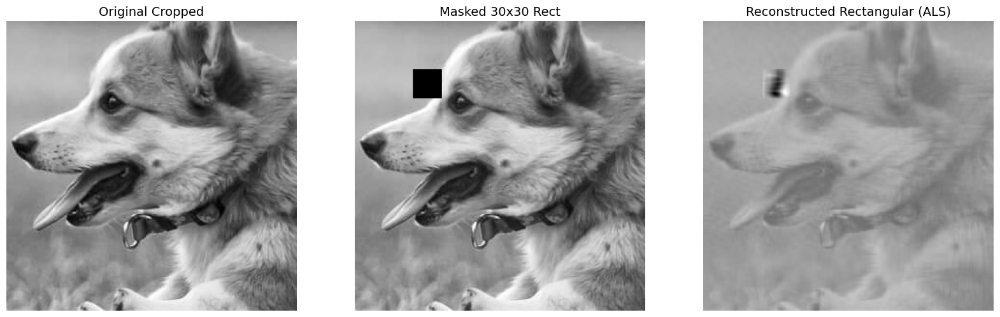

In [76]:
import torch
import torchvision
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr

# -----------------------------
# Helper Functions
# -----------------------------
def compute_rmse(img_true, img_pred, mask=None):
    if mask is None:
        mask = torch.ones_like(img_true)
    diff = (img_true - img_pred) * mask
    mse = torch.sum(diff**2) / torch.sum(mask)
    return torch.sqrt(mse).item()

def plot_side_by_side(images, titles, figsize=(20,8)):
    n = len(images)
    plt.figure(figsize=figsize)
    for i in range(n):
        plt.subplot(1,n,i+1)
        plt.imshow(images[i], cmap='gray')
        plt.title(titles[i], fontsize=14)
        plt.axis('off')
    plt.show()

# -----------------------------
# Step 1: Load and crop image
# -----------------------------
img = torchvision.io.read_image("dog.jpg").float()
x, y, h, w = 800, 600, 300, 300
cropped_img = img[:, y:y+h, x:x+w]
img_gray = cropped_img.mean(dim=0) / 255.0
H, W = img_gray.shape
print(f"Cropped image shape: {H}x{W}")

# -----------------------------
# Step 2: Create rectangular mask 30x30
# -----------------------------
mask_rect = torch.ones_like(img_gray)
mask_rect[50:80, 60:90] = 0  # 30x30 missing block

# -----------------------------
# Step 3: ALS Reconstruction
# -----------------------------
def als_reconstruct(img, mask, rank=30, iterations=30):
    H, W = img.shape
    U = torch.randn(H, rank)
    V = torch.randn(rank, W)
    M = mask

    for it in range(iterations):
        # Update U
        for i in range(H):
            idx = M[i, :] == 1
            V_sub = V[:, idx]
            img_sub = img[i, idx]
            if V_sub.shape[1] > 0:
                U[i, :] = torch.linalg.lstsq(V_sub.T, img_sub).solution
        # Update V
        for j in range(W):
            idx = M[:, j] == 1
            U_sub = U[idx, :]
            img_sub = img[idx, j]
            if U_sub.shape[0] > 0:
                V[:, j] = torch.linalg.lstsq(U_sub, img_sub).solution
    return U @ V

recon_rect = als_reconstruct(img_gray, mask_rect, rank=30, iterations=30)

# -----------------------------
# Step 4: Compute metrics
# -----------------------------
rmse_rect = compute_rmse(img_gray, recon_rect, mask=(1-mask_rect))
psnr_rect = psnr(img_gray.numpy(), recon_rect.numpy(), data_range=1)

print("\nRectangular 30x30 reconstruction metrics (ALS):")
print(f"RMSE = {rmse_rect:.4f}")
print(f"PSNR = {psnr_rect:.2f} dB")

# -----------------------------
# Step 5: Plot images side by side
# -----------------------------
plot_side_by_side([img_gray, img_gray*mask_rect, recon_rect],
                  ["Original Cropped", "Masked 30x30 Rect", "Reconstructed Rectangular (ALS)"],
                  figsize=(20,8))


Cropped image shape: 300x300

Random 900 pixels reconstruction metrics (ALS):
RMSE = 0.0340
PSNR = 31.09 dB


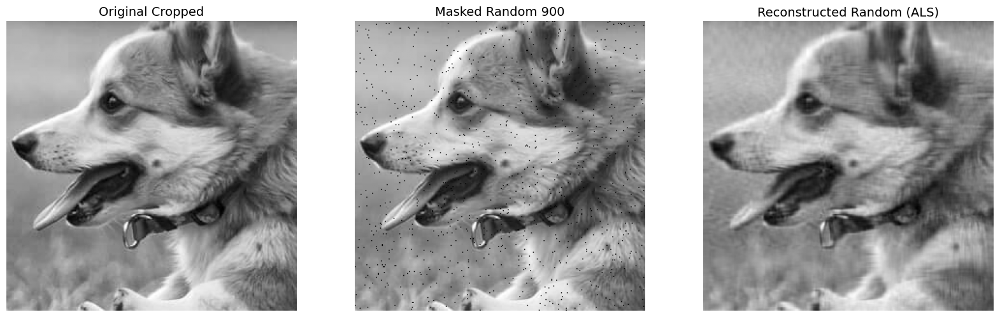

In [77]:
import torch
import torchvision
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr

# -----------------------------
# Helper Functions
# -----------------------------
def compute_rmse(img_true, img_pred, mask=None):
    if mask is None:
        mask = torch.ones_like(img_true)
    diff = (img_true - img_pred) * mask
    mse = torch.sum(diff**2) / torch.sum(mask)
    return torch.sqrt(mse).item()

def plot_side_by_side(images, titles, figsize=(20,8)):
    n = len(images)
    plt.figure(figsize=figsize)
    for i in range(n):
        plt.subplot(1,n,i+1)
        plt.imshow(images[i], cmap='gray')
        plt.title(titles[i], fontsize=14)
        plt.axis('off')
    plt.show()

# -----------------------------
# Step 1: Load and crop image
# -----------------------------
img = torchvision.io.read_image("dog.jpg").float()
x, y, h, w = 800, 600, 300, 300
cropped_img = img[:, y:y+h, x:x+w]
img_gray = cropped_img.mean(dim=0) / 255.0
H, W = img_gray.shape
print(f"Cropped image shape: {H}x{W}")

# -----------------------------
# Step 2: Create random mask with 900 missing pixels
# -----------------------------
mask_rand = torch.ones_like(img_gray)
missing_indices = torch.randperm(H*W)[:900]
mask_rand.view(-1)[missing_indices] = 0

# -----------------------------
# Step 3: ALS Reconstruction
# -----------------------------
def als_reconstruct(img, mask, rank=30, iterations=30):
    H, W = img.shape
    U = torch.randn(H, rank)
    V = torch.randn(rank, W)
    M = mask

    for it in range(iterations):
        # Update U
        for i in range(H):
            idx = M[i, :] == 1
            V_sub = V[:, idx]
            img_sub = img[i, idx]
            if V_sub.shape[1] > 0:
                U[i, :] = torch.linalg.lstsq(V_sub.T, img_sub).solution
        # Update V
        for j in range(W):
            idx = M[:, j] == 1
            U_sub = U[idx, :]
            img_sub = img[idx, j]
            if U_sub.shape[0] > 0:
                V[:, j] = torch.linalg.lstsq(U_sub, img_sub).solution
    return U @ V

recon_rand = als_reconstruct(img_gray, mask_rand, rank=30, iterations=30)

# -----------------------------
# Step 4: Compute metrics
# -----------------------------
rmse_rand = compute_rmse(img_gray, recon_rand, mask=(1-mask_rand))
psnr_rand = psnr(img_gray.numpy(), recon_rand.numpy(), data_range=1)

print("\nRandom 900 pixels reconstruction metrics (ALS):")
print(f"RMSE = {rmse_rand:.4f}")
print(f"PSNR = {psnr_rand:.2f} dB")

# -----------------------------
# Step 5: Plot images side by side
# -----------------------------
plot_side_by_side([img_gray, img_gray*mask_rand, recon_rand],
                  ["Original Cropped", "Masked Random 900", "Reconstructed Random (ALS)"],
                  figsize=(20,8))


Cropped image shape: 300x300x3

Patch 1 at (20,20) in cropped image


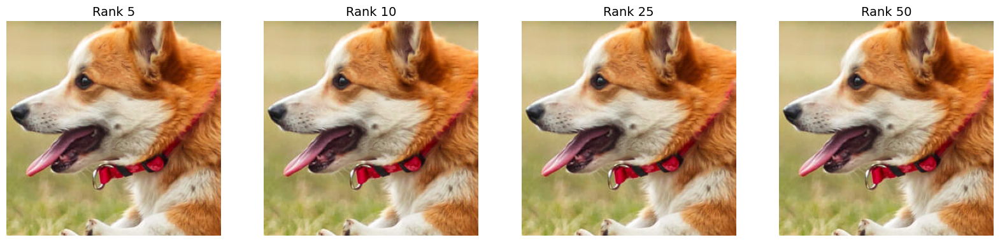


Patch 2 at (100,50) in cropped image


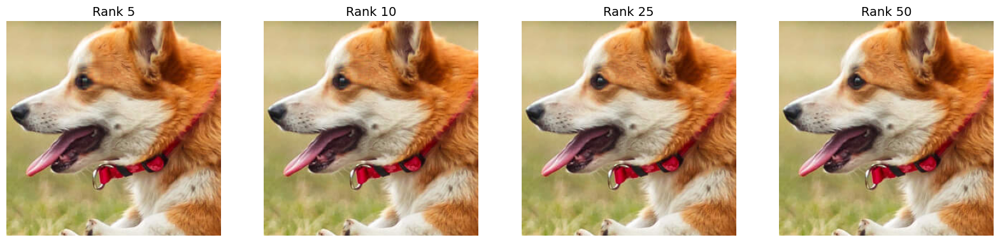


Patch 3 at (200,150) in cropped image


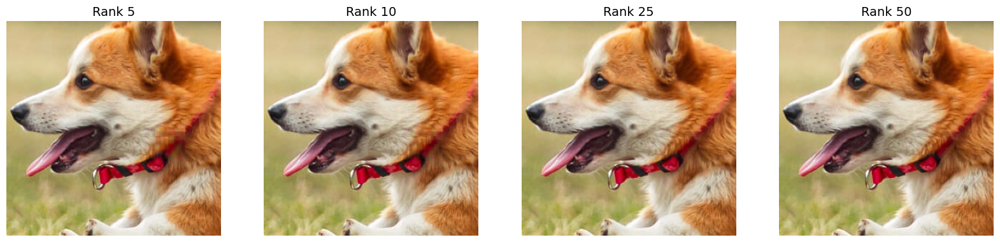

In [ ]:
import torch
import torchvision
import matplotlib.pyplot as plt

# -----------------------------
# Helper Functions
# -----------------------------
def plot_side_by_side(images, titles, figsize=(20,6)):
    """Plot multiple [H,W,C] images side by side"""
    n = len(images)
    plt.figure(figsize=figsize)
    for i in range(n):
        plt.subplot(1, n, i+1)
        img_to_plot = images[i].detach().cpu()
        plt.imshow(img_to_plot)
        plt.title(titles[i], fontsize=14)
        plt.axis('off')
    plt.show()

def low_rank_gd_patch(patch, rank=5, lr=0.1, epochs=500):
    """
    Low-rank matrix factorization using gradient descent for a single patch.
    patch: [N,N,C]
    returns: reconstructed patch [N,N,C]
    """
    N, _, C = patch.shape
    reconstructed_patch = torch.zeros_like(patch)

    for c in range(C):
        channel_patch = patch[:,:,c]
        U = torch.randn(N, rank, requires_grad=True)
        V = torch.randn(rank, N, requires_grad=True)
        optimizer = torch.optim.Adam([U,V], lr=lr)

        for epoch in range(epochs):
            optimizer.zero_grad()
            recon = U @ V
            loss = ((recon - channel_patch)**2).mean()
            loss.backward()
            optimizer.step()

        reconstructed_patch[:,:,c] = (U @ V).detach()

    return reconstructed_patch

# -----------------------------
# Step 1: Load and crop image
# -----------------------------
img = torchvision.io.read_image("dog.jpg").float() / 255.0  # [C,H,W]

# Crop parameters (use your previous coordinates)
x, y, h, w = 800, 600, 300, 300
cropped_img = img[:, y:y+h, x:x+w].permute(1,2,0)  # [H,W,C]
H, W, C = cropped_img.shape
print(f"Cropped image shape: {H}x{W}x{C}")

# -----------------------------
# Step 2: Define patches inside cropped image
# -----------------------------
N = 50  # patch size
# Select 3 patches inside the cropped image
patch_coords = [(20,20), (100,50), (200,150)]  # top-left corners
ranks = [5, 10, 25, 50]

# -----------------------------
# Step 3: Reconstruct patches and plot
# -----------------------------
for idx, (x_patch, y_patch) in enumerate(patch_coords):
    patch = cropped_img[y_patch:y_patch+N, x_patch:x_patch+N, :]  # [N,N,C]
    print(f"\nPatch {idx+1} at ({x_patch},{y_patch}) in cropped image")

    reconstructed_images = []
    titles = []

    for r in ranks:
        recon_patch = low_rank_gd_patch(patch, rank=r, lr=0.1, epochs=500)

        # Replace patch in a copy of cropped image
        img_recon = cropped_img.clone()
        img_recon[y_patch:y_patch+N, x_patch:x_patch+N, :] = recon_patch

        reconstructed_images.append(img_recon)
        titles.append(f"Rank {r}")

    # Plot all reconstructed versions side by side
    plot_side_by_side(reconstructed_images, titles, figsize=(20,6))


Cropped image shape: 300x300x3

Patch 1 at (20,20) in cropped image


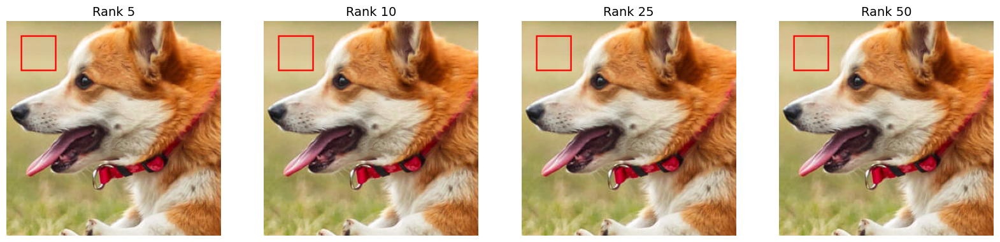


Patch 2 at (100,50) in cropped image


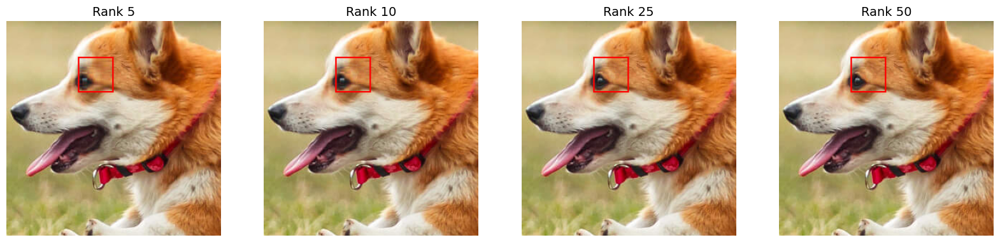


Patch 3 at (200,150) in cropped image


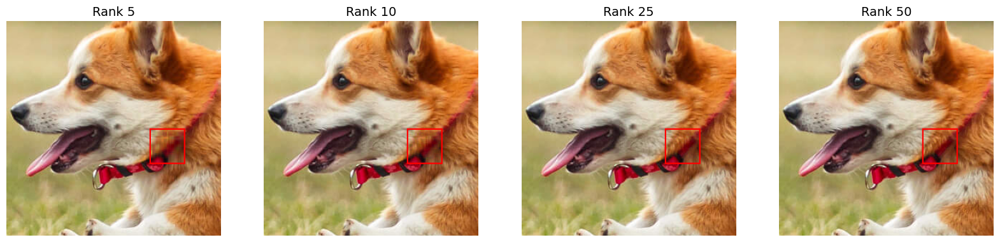

In [59]:
import torch
import torchvision
import matplotlib.pyplot as plt

# -----------------------------
# Helper Functions
# -----------------------------
def plot_side_by_side(images, titles, figsize=(20,6)):
    """Plot multiple [H,W,C] images side by side"""
    n = len(images)
    plt.figure(figsize=figsize)
    for i in range(n):
        plt.subplot(1, n, i+1)
        img_to_plot = images[i].detach().cpu()
        plt.imshow(img_to_plot)
        plt.title(titles[i], fontsize=14)
        plt.axis('off')
    plt.show()

def low_rank_gd_patch(patch, rank=5, lr=0.1, epochs=500):
    """
    Low-rank matrix factorization using gradient descent for a single patch.
    patch: [N,N,C]
    returns: reconstructed patch [N,N,C]
    """
    N, _, C = patch.shape
    reconstructed_patch = torch.zeros_like(patch)

    for c in range(C):
        channel_patch = patch[:,:,c]
        U = torch.randn(N, rank, requires_grad=True)
        V = torch.randn(rank, N, requires_grad=True)
        optimizer = torch.optim.Adam([U,V], lr=lr)

        for epoch in range(epochs):
            optimizer.zero_grad()
            recon = U @ V
            loss = ((recon - channel_patch)**2).mean()
            loss.backward()
            optimizer.step()

        reconstructed_patch[:,:,c] = (U @ V).detach()

    return reconstructed_patch

def add_red_border(img, x, y, patch_size=50, border_thickness=2):
    """
    Add a red border around the patch in the image
    img: [H,W,C]
    x, y: top-left corner of patch
    patch_size: size of patch
    border_thickness: thickness of red border
    """
    img_copy = img.clone()
    # Top border
    img_copy[y:y+border_thickness, x:x+patch_size, 0] = 1
    img_copy[y:y+border_thickness, x:x+patch_size, 1:] = 0
    # Bottom border
    img_copy[y+patch_size-border_thickness:y+patch_size, x:x+patch_size, 0] = 1
    img_copy[y+patch_size-border_thickness:y+patch_size, x:x+patch_size, 1:] = 0
    # Left border
    img_copy[y:y+patch_size, x:x+border_thickness, 0] = 1
    img_copy[y:y+patch_size, x:x+border_thickness, 1:] = 0
    # Right border
    img_copy[y:y+patch_size, x+patch_size-border_thickness:x+patch_size, 0] = 1
    img_copy[y:y+patch_size, x+patch_size-border_thickness:x+patch_size, 1:] = 0
    return img_copy

# -----------------------------
# Step 1: Load and crop image
# -----------------------------
img = torchvision.io.read_image("dog.jpg").float() / 255.0  # [C,H,W]

# Crop parameters
x_crop, y_crop, h, w = 800, 600, 300, 300
cropped_img = img[:, y_crop:y_crop+h, x_crop:x_crop+w].permute(1,2,0)  # [H,W,C]
H, W, C = cropped_img.shape
print(f"Cropped image shape: {H}x{W}x{C}")

# -----------------------------
# Step 2: Define patches inside cropped image
# -----------------------------
N = 50  # patch size
patch_coords = [(20,20), (100,50), (200,150)]  # top-left corners of patches
ranks = [5, 10, 25, 50]

# -----------------------------
# Step 3: Reconstruct patches and plot
# -----------------------------
for idx, (x_patch, y_patch) in enumerate(patch_coords):
    patch = cropped_img[y_patch:y_patch+N, x_patch:x_patch+N, :]  # [N,N,C]
    print(f"\nPatch {idx+1} at ({x_patch},{y_patch}) in cropped image")

    reconstructed_images = []
    titles = []

    for r in ranks:
        recon_patch = low_rank_gd_patch(patch, rank=r, lr=0.1, epochs=500)

        # Replace patch in a copy of cropped image
        img_recon = cropped_img.clone()
        img_recon[y_patch:y_patch+N, x_patch:x_patch+N, :] = recon_patch

        # Add red border around patch
        img_recon_with_border = add_red_border(img_recon, x_patch, y_patch, patch_size=N, border_thickness=2)

        reconstructed_images.append(img_recon_with_border)
        titles.append(f"Rank {r}")

    # Plot all reconstructed versions side by side
    plot_side_by_side(reconstructed_images, titles, figsize=(20,6))


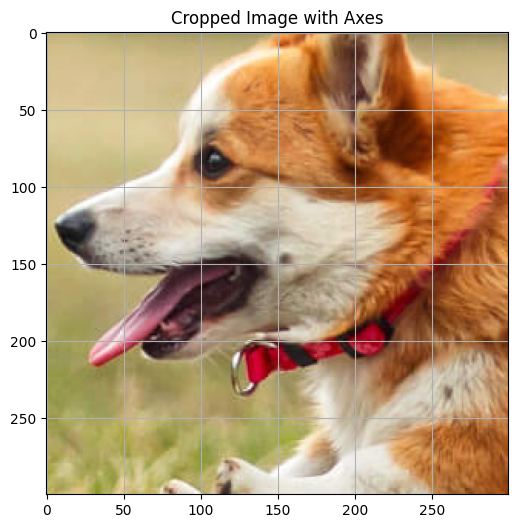

In [62]:
import torchvision
import matplotlib.pyplot as plt

# Load the image
img = torchvision.io.read_image("dog.jpg").float() / 255.0  # [C,H,W]

# Crop parameters
x_crop, y_crop, h, w = 800, 600, 300, 300
cropped_img = img[:, y_crop:y_crop+h, x_crop:x_crop+w].permute(1,2,0)  # [H,W,C]

# Display with axes
plt.figure(figsize=(6,6))
plt.imshow(cropped_img)
# plt.xlabel("Width (pixels)")
# plt.ylabel("Height (pixels)")
plt.title("Cropped Image with Axes")
plt.grid(True)
plt.show()


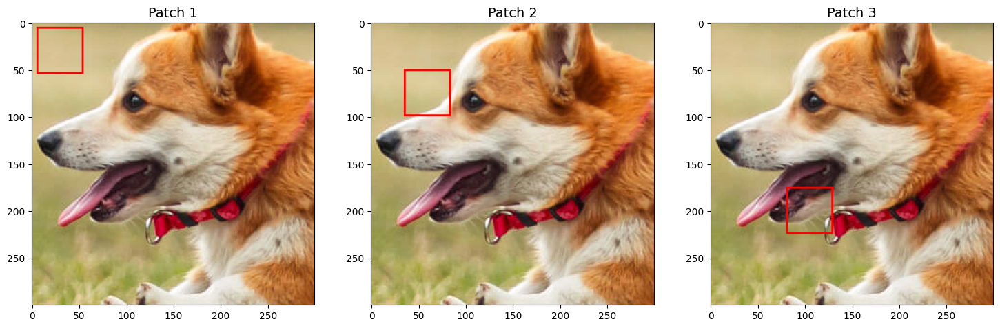

In [67]:
import torch
import torchvision
import matplotlib.pyplot as plt

# -----------------------------
# Helper function to add red border
# -----------------------------
def add_red_border(img, x, y, patch_size=50, border_thickness=2):
    """
    Add a red border around the patch in the image
    img: [H,W,C]
    x, y: top-left corner of patch
    patch_size: size of patch
    border_thickness: thickness of red border
    """
    img_copy = img.clone()
    # Top border
    img_copy[y:y+border_thickness, x:x+patch_size, 0] = 1
    img_copy[y:y+border_thickness, x:x+patch_size, 1:] = 0
    # Bottom border
    img_copy[y+patch_size-border_thickness:y+patch_size, x:x+patch_size, 0] = 1
    img_copy[y+patch_size-border_thickness:y+patch_size, x:x+patch_size, 1:] = 0
    # Left border
    img_copy[y:y+patch_size, x:x+border_thickness, 0] = 1
    img_copy[y:y+patch_size, x:x+border_thickness, 1:] = 0
    # Right border
    img_copy[y:y+patch_size, x+patch_size-border_thickness:x+patch_size, 0] = 1
    img_copy[y:y+patch_size, x+patch_size-border_thickness:x+patch_size, 1:] = 0
    return img_copy

# -----------------------------
# Load and crop the image
# -----------------------------
img = torchvision.io.read_image("dog.jpg").float() / 255.0  # [C,H,W]

# Crop parameters
x_crop, y_crop, h, w = 800, 600, 300, 300
cropped_img = img[:, y_crop:y_crop+h, x_crop:x_crop+w].permute(1,2,0)  # [H,W,C]

# -----------------------------
# Patch coordinates
# -----------------------------
patches = [(5,5), (35,50), (80,175)]

# -----------------------------
# Add red borders and collect images
# -----------------------------
images_with_borders = []
titles = []

for idx, (x, y) in enumerate(patches):
    img_with_border = add_red_border(cropped_img, x, y, patch_size=50, border_thickness=2)
    images_with_borders.append(img_with_border)
    titles.append(f"Patch {idx+1}")

# -----------------------------
# Plot all side by side
# -----------------------------
plt.figure(figsize=(18,6))
for i, img_plot in enumerate(images_with_borders):
    plt.subplot(1, len(images_with_borders), i+1)
    plt.imshow(img_plot)
    plt.title(titles[i], fontsize=14)
    plt.axis('on')
plt.show()


Cropped image shape: 300x300x3

Patch 1 at (0,0) in cropped image


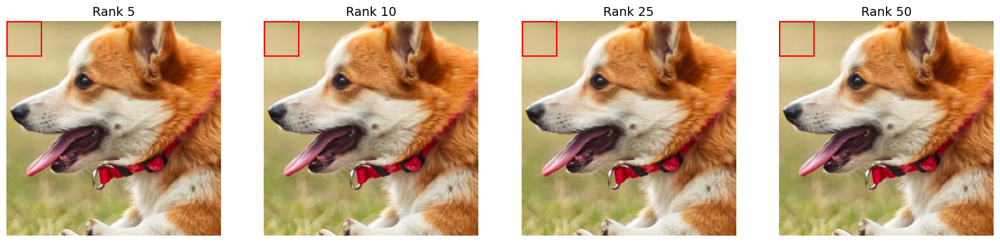


Patch 2 at (25,50) in cropped image


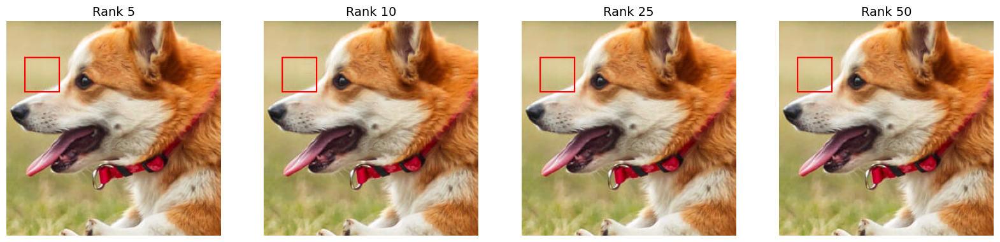


Patch 3 at (80,175) in cropped image


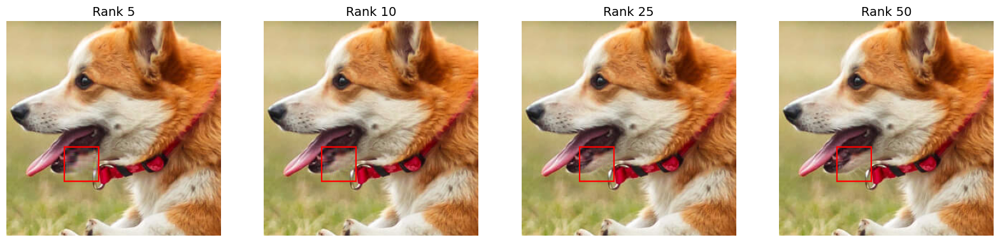

In [68]:
import torch
import torchvision
import matplotlib.pyplot as plt

# -----------------------------
# Helper Functions
# -----------------------------
def plot_side_by_side(images, titles, figsize=(20,6)):
    """Plot multiple [H,W,C] images side by side"""
    n = len(images)
    plt.figure(figsize=figsize)
    for i in range(n):
        plt.subplot(1, n, i+1)
        img_to_plot = images[i].detach().cpu()
        plt.imshow(img_to_plot)
        plt.title(titles[i], fontsize=14)
        plt.axis('off')
    plt.show()

def low_rank_gd_patch(patch, rank=5, lr=0.1, epochs=500):
    """
    Low-rank matrix factorization using gradient descent for a single patch.
    patch: [N,N,C]
    returns: reconstructed patch [N,N,C]
    """
    N, _, C = patch.shape
    reconstructed_patch = torch.zeros_like(patch)

    for c in range(C):
        channel_patch = patch[:,:,c]
        U = torch.randn(N, rank, requires_grad=True)
        V = torch.randn(rank, N, requires_grad=True)
        optimizer = torch.optim.Adam([U,V], lr=lr)

        for epoch in range(epochs):
            optimizer.zero_grad()
            recon = U @ V
            loss = ((recon - channel_patch)**2).mean()
            loss.backward()
            optimizer.step()

        reconstructed_patch[:,:,c] = (U @ V).detach()

    return reconstructed_patch

def add_red_border(img, x, y, patch_size=50, border_thickness=2):
    """
    Add a red border around the patch in the image
    img: [H,W,C]
    x, y: top-left corner of patch
    patch_size: size of patch
    border_thickness: thickness of red border
    """
    img_copy = img.clone()
    # Top border
    img_copy[y:y+border_thickness, x:x+patch_size, 0] = 1
    img_copy[y:y+border_thickness, x:x+patch_size, 1:] = 0
    # Bottom border
    img_copy[y+patch_size-border_thickness:y+patch_size, x:x+patch_size, 0] = 1
    img_copy[y+patch_size-border_thickness:y+patch_size, x:x+patch_size, 1:] = 0
    # Left border
    img_copy[y:y+patch_size, x:x+border_thickness, 0] = 1
    img_copy[y:y+patch_size, x:x+border_thickness, 1:] = 0
    # Right border
    img_copy[y:y+patch_size, x+patch_size-border_thickness:x+patch_size, 0] = 1
    img_copy[y:y+patch_size, x+patch_size-border_thickness:x+patch_size, 1:] = 0
    return img_copy

# -----------------------------
# Step 1: Load and crop image
# -----------------------------
img = torchvision.io.read_image("dog.jpg").float() / 255.0  # [C,H,W]

# Crop parameters
x_crop, y_crop, h, w = 800, 600, 300, 300
cropped_img = img[:, y_crop:y_crop+h, x_crop:x_crop+w].permute(1,2,0)  # [H,W,C]
H, W, C = cropped_img.shape
print(f"Cropped image shape: {H}x{W}x{C}")

# -----------------------------
# Step 2: Define new patch coordinates
# -----------------------------
N = 50  # patch size
patch_coords = [(0,0), (25,50), (80,175)]  # updated patches
ranks = [5, 10, 25, 50]

# -----------------------------
# Step 3: Reconstruct patches and plot
# -----------------------------
for idx, (x_patch, y_patch) in enumerate(patch_coords):
    patch = cropped_img[y_patch:y_patch+N, x_patch:x_patch+N, :]  # [N,N,C]
    print(f"\nPatch {idx+1} at ({x_patch},{y_patch}) in cropped image")

    reconstructed_images = []
    titles = []

    for r in ranks:
        recon_patch = low_rank_gd_patch(patch, rank=r, lr=0.1, epochs=500)

        # Replace patch in a copy of cropped image
        img_recon = cropped_img.clone()
        img_recon[y_patch:y_patch+N, x_patch:x_patch+N, :] = recon_patch

        # Add red border around patch
        img_recon_with_border = add_red_border(img_recon, x_patch, y_patch, patch_size=N, border_thickness=2)

        reconstructed_images.append(img_recon_with_border)
        titles.append(f"Rank {r}")

    # Plot all reconstructed versions side by side
    plot_side_by_side(reconstructed_images, titles, figsize=(20,6))



Patch 1 at (0,0)

Rank |    PSNR (dB)    |   RMSE
-----------------------------------
5    |  42.7592        | 0.0073
10   |  46.9540        | 0.0045
25   |  47.0152        | 0.0045
50   |  49.7502        | 0.0033

Best reconstruction by PSNR: Rank 50 (PSNR=49.75 dB)
Best reconstruction by RMSE: Rank 50 (RMSE=0.0033)


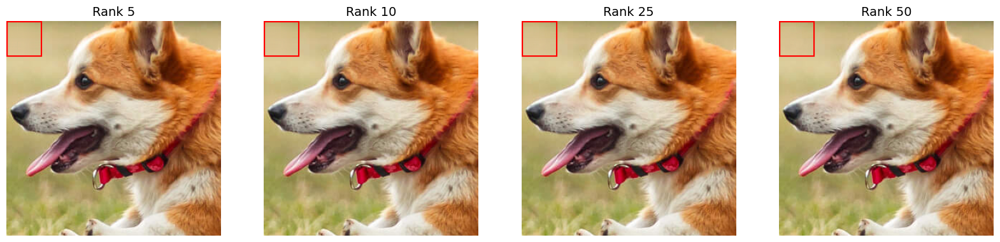


Patch 2 at (25,50)



Rank |    PSNR (dB)    |   RMSE
-----------------------------------
5    |  33.4046        | 0.0214
10   |  37.7546        | 0.0129
25   |  40.4553        | 0.0095
50   |  44.4951        | 0.0060

Best reconstruction by PSNR: Rank 50 (PSNR=44.50 dB)
Best reconstruction by RMSE: Rank 50 (RMSE=0.0060)


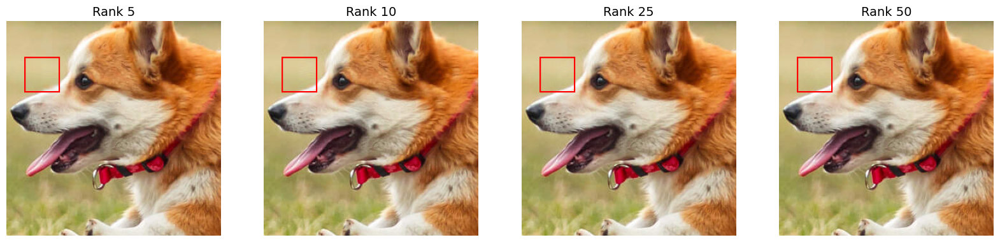


Patch 3 at (80,175)



Rank |    PSNR (dB)    |   RMSE
-----------------------------------
5    |  25.6509        | 0.0522
10   |  29.1900        | 0.0347
25   |  33.8045        | 0.0204
50   |  38.4143        | 0.0120

Best reconstruction by PSNR: Rank 50 (PSNR=38.41 dB)
Best reconstruction by RMSE: Rank 50 (RMSE=0.0120)


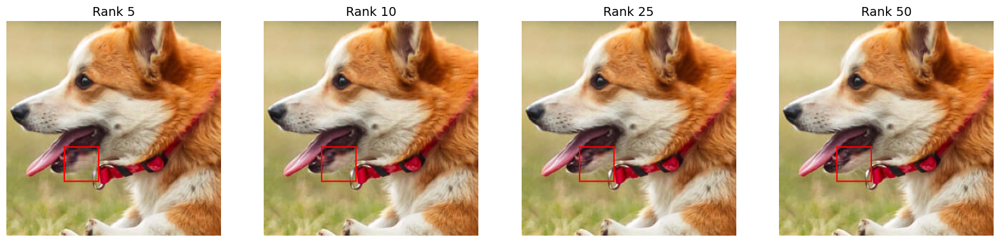

In [70]:
import torch
import torchvision
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr

# -----------------------------
# Helper Functions
# -----------------------------
def plot_side_by_side(images, titles, figsize=(20,6)):
    n = len(images)
    plt.figure(figsize=figsize)
    for i in range(n):
        plt.subplot(1, n, i+1)
        img_to_plot = images[i].detach().cpu()
        plt.imshow(img_to_plot)
        plt.title(titles[i], fontsize=14)
        plt.axis('off')
    plt.show()

def low_rank_gd_patch(patch, rank=5, lr=0.1, epochs=500):
    N, _, C = patch.shape
    reconstructed_patch = torch.zeros_like(patch)

    for c in range(C):
        channel_patch = patch[:,:,c]
        U = torch.randn(N, rank, requires_grad=True)
        V = torch.randn(rank, N, requires_grad=True)
        optimizer = torch.optim.Adam([U,V], lr=lr)

        for epoch in range(epochs):
            optimizer.zero_grad()
            recon = U @ V
            loss = ((recon - channel_patch)**2).mean()
            loss.backward()
            optimizer.step()

        reconstructed_patch[:,:,c] = (U @ V).detach()
    return reconstructed_patch

def add_red_border(img, x, y, patch_size=50, border_thickness=2):
    img_copy = img.clone()
    # Top border
    img_copy[y:y+border_thickness, x:x+patch_size, 0] = 1
    img_copy[y:y+border_thickness, x:x+patch_size, 1:] = 0
    # Bottom border
    img_copy[y+patch_size-border_thickness:y+patch_size, x:x+patch_size, 0] = 1
    img_copy[y+patch_size-border_thickness:y+patch_size, x:x+patch_size, 1:] = 0
    # Left border
    img_copy[y:y+patch_size, x:x+border_thickness, 0] = 1
    img_copy[y:y+patch_size, x:x+border_thickness, 1:] = 0
    # Right border
    img_copy[y:y+patch_size, x+patch_size-border_thickness:x+patch_size, 0] = 1
    img_copy[y:y+patch_size, x+patch_size-border_thickness:x+patch_size, 1:] = 0
    return img_copy

def compute_rmse(img_true, img_pred):
    return torch.sqrt(((img_true - img_pred)**2).mean()).item()

# -----------------------------
# Step 1: Load and crop image
# -----------------------------
img = torchvision.io.read_image("dog.jpg").float() / 255.0  # [C,H,W]
x_crop, y_crop, h, w = 800, 600, 300, 300
cropped_img = img[:, y_crop:y_crop+h, x_crop:x_crop+w].permute(1,2,0)  # [H,W,C]

# -----------------------------
# Step 2: Define patches
# -----------------------------
N = 50
patch_coords = [(0,0), (25,50), (80,175)]
ranks = [5, 10, 25, 50]

# -----------------------------
# Step 3: Reconstruct patches, compute PSNR & RMSE, and plot
# -----------------------------
for idx, (x_patch, y_patch) in enumerate(patch_coords):
    patch = cropped_img[y_patch:y_patch+N, x_patch:x_patch+N, :]  # original patch
    print(f"\nPatch {idx+1} at ({x_patch},{y_patch})")

    reconstructed_images = []
    titles = []
    psnr_values = []
    rmse_values = []

    for r in ranks:
        recon_patch = low_rank_gd_patch(patch, rank=r, lr=0.1, epochs=500)

        # Replace patch in copy of cropped image
        img_recon = cropped_img.clone()
        img_recon[y_patch:y_patch+N, x_patch:x_patch+N, :] = recon_patch

        # Add red border
        img_recon_with_border = add_red_border(img_recon, x_patch, y_patch, patch_size=N)
        reconstructed_images.append(img_recon_with_border)
        titles.append(f"Rank {r}")

        # Compute PSNR and RMSE
        psnr_val = psnr(patch.numpy(), recon_patch.numpy(), data_range=1.0)
        rmse_val = compute_rmse(patch, recon_patch)
        psnr_values.append(psnr_val)
        rmse_values.append(rmse_val)

    # -----------------------------
    # Print table of metrics
    # -----------------------------
    print("\nRank |    PSNR (dB)    |   RMSE")
    print("-----------------------------------")
    for i, r in enumerate(ranks):
        print(f"{r:<5}|  {psnr_values[i]:<15.4f}| {rmse_values[i]:<.4f}")

    # Identify best reconstruction
    best_idx_psnr = psnr_values.index(max(psnr_values))
    best_idx_rmse = rmse_values.index(min(rmse_values))
    print(f"\nBest reconstruction by PSNR: Rank {ranks[best_idx_psnr]} (PSNR={psnr_values[best_idx_psnr]:.2f} dB)")
    print(f"Best reconstruction by RMSE: Rank {ranks[best_idx_rmse]} (RMSE={rmse_values[best_idx_rmse]:.4f})")

    # Plot side by side
    plot_side_by_side(reconstructed_images, titles, figsize=(20,6))


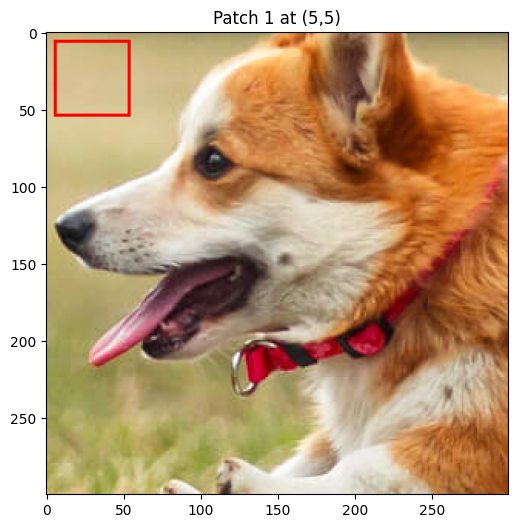

In [78]:
import torch
import torchvision
import matplotlib.pyplot as plt

# -----------------------------
# Helper function to add red border
# -----------------------------
def add_red_border(img, x, y, patch_size=50, border_thickness=2):
    img_copy = img.clone()
    # Top border
    img_copy[y:y+border_thickness, x:x+patch_size, 0] = 1
    img_copy[y:y+border_thickness, x:x+patch_size, 1:] = 0
    # Bottom border
    img_copy[y+patch_size-border_thickness:y+patch_size, x:x+patch_size, 0] = 1
    img_copy[y+patch_size-border_thickness:y+patch_size, x:x+patch_size, 1:] = 0
    # Left border
    img_copy[y:y+patch_size, x:x+border_thickness, 0] = 1
    img_copy[y:y+patch_size, x:x+border_thickness, 1:] = 0
    # Right border
    img_copy[y:y+patch_size, x+patch_size-border_thickness:x+patch_size, 0] = 1
    img_copy[y:y+patch_size, x+patch_size-border_thickness:x+patch_size, 1:] = 0
    return img_copy

# -----------------------------
# Load and crop the image
# -----------------------------
img = torchvision.io.read_image("dog.jpg").float() / 255.0
x_crop, y_crop, h, w = 800, 600, 300, 300
cropped_img = img[:, y_crop:y_crop+h, x_crop:x_crop+w].permute(1,2,0)  # [H,W,C]

# -----------------------------
# Patch 1
# -----------------------------
x_patch, y_patch = 5, 5
img_patch1 = add_red_border(cropped_img, x_patch, y_patch, patch_size=50, border_thickness=2)

plt.figure(figsize=(6,6))
plt.imshow(img_patch1)
plt.title("Patch 1 at (5,5)")
plt.axis('on')
plt.show()


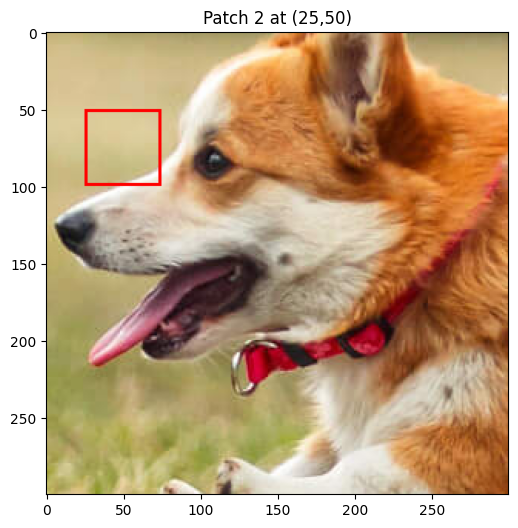

In [81]:
import torch
import torchvision
import matplotlib.pyplot as plt

# -----------------------------
# Helper function to add red border
# -----------------------------
def add_red_border(img, x, y, patch_size=50, border_thickness=2):
    img_copy = img.clone()
    # Top border
    img_copy[y:y+border_thickness, x:x+patch_size, 0] = 1
    img_copy[y:y+border_thickness, x:x+patch_size, 1:] = 0
    # Bottom border
    img_copy[y+patch_size-border_thickness:y+patch_size, x:x+patch_size, 0] = 1
    img_copy[y+patch_size-border_thickness:y+patch_size, x:x+patch_size, 1:] = 0
    # Left border
    img_copy[y:y+patch_size, x:x+border_thickness, 0] = 1
    img_copy[y:y+patch_size, x:x+border_thickness, 1:] = 0
    # Right border
    img_copy[y:y+patch_size, x+patch_size-border_thickness:x+patch_size, 0] = 1
    img_copy[y:y+patch_size, x+patch_size-border_thickness:x+patch_size, 1:] = 0
    return img_copy

# -----------------------------
# Load and crop the image
# -----------------------------
img = torchvision.io.read_image("dog.jpg").float() / 255.0
x_crop, y_crop, h, w = 800, 600, 300, 300
cropped_img = img[:, y_crop:y_crop+h, x_crop:x_crop+w].permute(1,2,0)  # [H,W,C]

# -----------------------------
# Patch 1
# -----------------------------
x_patch, y_patch = 25,50
img_patch1 = add_red_border(cropped_img, x_patch, y_patch, patch_size=50, border_thickness=2)

plt.figure(figsize=(6,6))
plt.imshow(img_patch1)
plt.title("Patch 2 at (25,50)")
plt.axis('on')
plt.show()


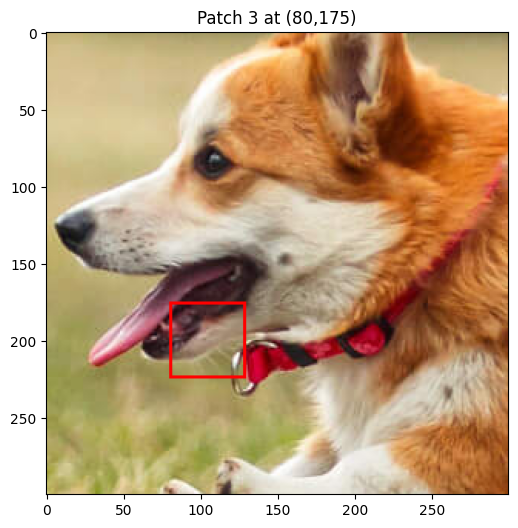

In [82]:
import torch
import torchvision
import matplotlib.pyplot as plt

# -----------------------------
# Helper function to add red border
# -----------------------------
def add_red_border(img, x, y, patch_size=50, border_thickness=2):
    img_copy = img.clone()
    # Top border
    img_copy[y:y+border_thickness, x:x+patch_size, 0] = 1
    img_copy[y:y+border_thickness, x:x+patch_size, 1:] = 0
    # Bottom border
    img_copy[y+patch_size-border_thickness:y+patch_size, x:x+patch_size, 0] = 1
    img_copy[y+patch_size-border_thickness:y+patch_size, x:x+patch_size, 1:] = 0
    # Left border
    img_copy[y:y+patch_size, x:x+border_thickness, 0] = 1
    img_copy[y:y+patch_size, x:x+border_thickness, 1:] = 0
    # Right border
    img_copy[y:y+patch_size, x+patch_size-border_thickness:x+patch_size, 0] = 1
    img_copy[y:y+patch_size, x+patch_size-border_thickness:x+patch_size, 1:] = 0
    return img_copy

# -----------------------------
# Load and crop the image
# -----------------------------
img = torchvision.io.read_image("dog.jpg").float() / 255.0
x_crop, y_crop, h, w = 800, 600, 300, 300
cropped_img = img[:, y_crop:y_crop+h, x_crop:x_crop+w].permute(1,2,0)  # [H,W,C]

# -----------------------------
# Patch 1
# -----------------------------
x_patch, y_patch = 80,175
img_patch1 = add_red_border(cropped_img, x_patch, y_patch, patch_size=50, border_thickness=2)

plt.figure(figsize=(6,6))
plt.imshow(img_patch1)
plt.title("Patch 3 at (80,175)")
plt.axis('on')
plt.show()


Patch 1 at (0,0)

Rank |    PSNR (dB)    |   RMSE
-----------------------------------
5    |  44.8042        | 0.0058
10   |  45.0206        | 0.0056
25   |  47.2140        | 0.0044
50   |  49.3685        | 0.0034

Best by PSNR: Rank 50 (PSNR=49.37 dB)
Best by RMSE: Rank 50 (RMSE=0.0034)


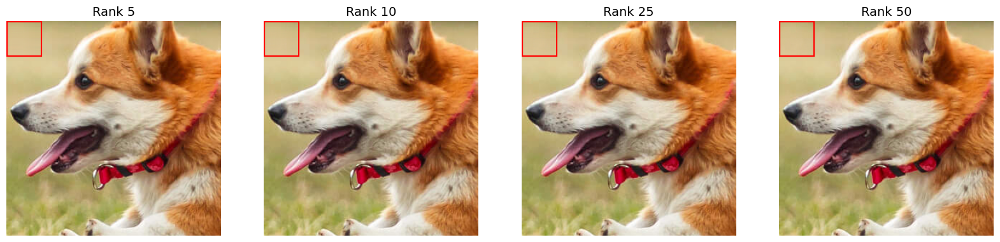

In [83]:
import torch
import torchvision
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr

# -----------------------------
# Helper Functions
# -----------------------------
def plot_side_by_side(images, titles, figsize=(20,6)):
    n = len(images)
    plt.figure(figsize=figsize)
    for i in range(n):
        plt.subplot(1, n, i+1)
        img_to_plot = images[i].detach().cpu()
        plt.imshow(img_to_plot)
        plt.title(titles[i], fontsize=14)
        plt.axis('off')
    plt.show()

def low_rank_gd_patch(patch, rank=5, lr=0.1, epochs=500):
    N, _, C = patch.shape
    reconstructed_patch = torch.zeros_like(patch)
    for c in range(C):
        channel_patch = patch[:,:,c]
        U = torch.randn(N, rank, requires_grad=True)
        V = torch.randn(rank, N, requires_grad=True)
        optimizer = torch.optim.Adam([U,V], lr=lr)
        for epoch in range(epochs):
            optimizer.zero_grad()
            recon = U @ V
            loss = ((recon - channel_patch)**2).mean()
            loss.backward()
            optimizer.step()
        reconstructed_patch[:,:,c] = (U @ V).detach()
    return reconstructed_patch

def add_red_border(img, x, y, patch_size=50, border_thickness=2):
    img_copy = img.clone()
    img_copy[y:y+border_thickness, x:x+patch_size, 0] = 1
    img_copy[y:y+border_thickness, x:x+patch_size, 1:] = 0
    img_copy[y+patch_size-border_thickness:y+patch_size, x:x+patch_size, 0] = 1
    img_copy[y+patch_size-border_thickness:y+patch_size, x:x+patch_size, 1:] = 0
    img_copy[y:y+patch_size, x:x+border_thickness, 0] = 1
    img_copy[y:y+patch_size, x:x+border_thickness, 1:] = 0
    img_copy[y:y+patch_size, x+patch_size-border_thickness:x+patch_size, 0] = 1
    img_copy[y:y+patch_size, x+patch_size-border_thickness:x+patch_size, 1:] = 0
    return img_copy

def compute_rmse(img_true, img_pred):
    return torch.sqrt(((img_true - img_pred)**2).mean()).item()

# -----------------------------
# Step 1: Load and crop image
# -----------------------------
img = torchvision.io.read_image("dog.jpg").float() / 255.0
x_crop, y_crop, h, w = 800, 600, 300, 300
cropped_img = img[:, y_crop:y_crop+h, x_crop:x_crop+w].permute(1,2,0)

# -----------------------------
# Step 2: Define patch 1
# -----------------------------
N = 50
x_patch, y_patch = 0, 0
ranks = [5, 10, 25, 50]

# -----------------------------
# Step 3: Reconstruct and analyze
# -----------------------------
patch = cropped_img[y_patch:y_patch+N, x_patch:x_patch+N, :]
print(f"Patch 1 at ({x_patch},{y_patch})")

reconstructed_images = []
titles = []
psnr_values = []
rmse_values = []

for r in ranks:
    recon_patch = low_rank_gd_patch(patch, rank=r, lr=0.1, epochs=500)
    img_recon = cropped_img.clone()
    img_recon[y_patch:y_patch+N, x_patch:x_patch+N, :] = recon_patch
    img_recon_with_border = add_red_border(img_recon, x_patch, y_patch, patch_size=N)
    reconstructed_images.append(img_recon_with_border)
    titles.append(f"Rank {r}")

    psnr_values.append(psnr(patch.numpy(), recon_patch.numpy(), data_range=1.0))
    rmse_values.append(compute_rmse(patch, recon_patch))

# Print metrics table
print("\nRank |    PSNR (dB)    |   RMSE")
print("-----------------------------------")
for i, r in enumerate(ranks):
    print(f"{r:<5}|  {psnr_values[i]:<15.4f}| {rmse_values[i]:<.4f}")

best_idx_psnr = psnr_values.index(max(psnr_values))
best_idx_rmse = rmse_values.index(min(rmse_values))
print(f"\nBest by PSNR: Rank {ranks[best_idx_psnr]} (PSNR={psnr_values[best_idx_psnr]:.2f} dB)")
print(f"Best by RMSE: Rank {ranks[best_idx_rmse]} (RMSE={rmse_values[best_idx_rmse]:.4f})")

plot_side_by_side(reconstructed_images, titles, figsize=(20,6))


Patch 2 at (25,50)



Rank |    PSNR (dB)    |   RMSE
-----------------------------------
5    |  33.5970        | 0.0209
10   |  37.4109        | 0.0135
25   |  41.0680        | 0.0088
50   |  44.6660        | 0.0058

Best by PSNR: Rank 50 (PSNR=44.67 dB)
Best by RMSE: Rank 50 (RMSE=0.0058)


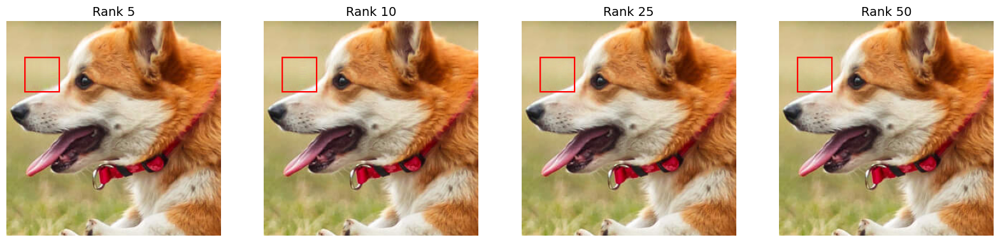

In [84]:
import torch
import torchvision
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr

# -----------------------------
# Helper Functions
# -----------------------------
def plot_side_by_side(images, titles, figsize=(20,6)):
    n = len(images)
    plt.figure(figsize=figsize)
    for i in range(n):
        plt.subplot(1, n, i+1)
        img_to_plot = images[i].detach().cpu()
        plt.imshow(img_to_plot)
        plt.title(titles[i], fontsize=14)
        plt.axis('off')
    plt.show()

def low_rank_gd_patch(patch, rank=5, lr=0.1, epochs=500):
    N, _, C = patch.shape
    reconstructed_patch = torch.zeros_like(patch)
    for c in range(C):
        channel_patch = patch[:,:,c]
        U = torch.randn(N, rank, requires_grad=True)
        V = torch.randn(rank, N, requires_grad=True)
        optimizer = torch.optim.Adam([U,V], lr=lr)
        for epoch in range(epochs):
            optimizer.zero_grad()
            recon = U @ V
            loss = ((recon - channel_patch)**2).mean()
            loss.backward()
            optimizer.step()
        reconstructed_patch[:,:,c] = (U @ V).detach()
    return reconstructed_patch

def add_red_border(img, x, y, patch_size=50, border_thickness=2):
    img_copy = img.clone()
    img_copy[y:y+border_thickness, x:x+patch_size, 0] = 1
    img_copy[y:y+border_thickness, x:x+patch_size, 1:] = 0
    img_copy[y+patch_size-border_thickness:y+patch_size, x:x+patch_size, 0] = 1
    img_copy[y+patch_size-border_thickness:y+patch_size, x:x+patch_size, 1:] = 0
    img_copy[y:y+patch_size, x:x+border_thickness, 0] = 1
    img_copy[y:y+patch_size, x:x+border_thickness, 1:] = 0
    img_copy[y:y+patch_size, x+patch_size-border_thickness:x+patch_size, 0] = 1
    img_copy[y:y+patch_size, x+patch_size-border_thickness:x+patch_size, 1:] = 0
    return img_copy

def compute_rmse(img_true, img_pred):
    return torch.sqrt(((img_true - img_pred)**2).mean()).item()

# -----------------------------
# Step 1: Load and crop image
# -----------------------------
img = torchvision.io.read_image("dog.jpg").float() / 255.0
x_crop, y_crop, h, w = 800, 600, 300, 300
cropped_img = img[:, y_crop:y_crop+h, x_crop:x_crop+w].permute(1,2,0)

# -----------------------------
# Step 2: Define patch 2
# -----------------------------
N = 50
x_patch, y_patch = 25, 50
ranks = [5, 10, 25, 50]

# -----------------------------
# Step 3: Reconstruct and analyze
# -----------------------------
patch = cropped_img[y_patch:y_patch+N, x_patch:x_patch+N, :]
print(f"Patch 2 at ({x_patch},{y_patch})")

reconstructed_images = []
titles = []
psnr_values = []
rmse_values = []

for r in ranks:
    recon_patch = low_rank_gd_patch(patch, rank=r, lr=0.1, epochs=500)
    img_recon = cropped_img.clone()
    img_recon[y_patch:y_patch+N, x_patch:x_patch+N, :] = recon_patch
    img_recon_with_border = add_red_border(img_recon, x_patch, y_patch, patch_size=N)
    reconstructed_images.append(img_recon_with_border)
    titles.append(f"Rank {r}")

    psnr_values.append(psnr(patch.numpy(), recon_patch.numpy(), data_range=1.0))
    rmse_values.append(compute_rmse(patch, recon_patch))

# Print metrics table
print("\nRank |    PSNR (dB)    |   RMSE")
print("-----------------------------------")
for i, r in enumerate(ranks):
    print(f"{r:<5}|  {psnr_values[i]:<15.4f}| {rmse_values[i]:<.4f}")

best_idx_psnr = psnr_values.index(max(psnr_values))
best_idx_rmse = rmse_values.index(min(rmse_values))
print(f"\nBest by PSNR: Rank {ranks[best_idx_psnr]} (PSNR={psnr_values[best_idx_psnr]:.2f} dB)")
print(f"Best by RMSE: Rank {ranks[best_idx_rmse]} (RMSE={rmse_values[best_idx_rmse]:.4f})")

# Plot side by side
plot_side_by_side(reconstructed_images, titles, figsize=(20,6))


Patch 3 at (80,175)



Rank |    PSNR (dB)    |   RMSE
-----------------------------------
5    |  25.6756        | 0.0520
10   |  29.2833        | 0.0343
25   |  34.0043        | 0.0199
50   |  39.0332        | 0.0112

Best by PSNR: Rank 50 (PSNR=39.03 dB)
Best by RMSE: Rank 50 (RMSE=0.0112)


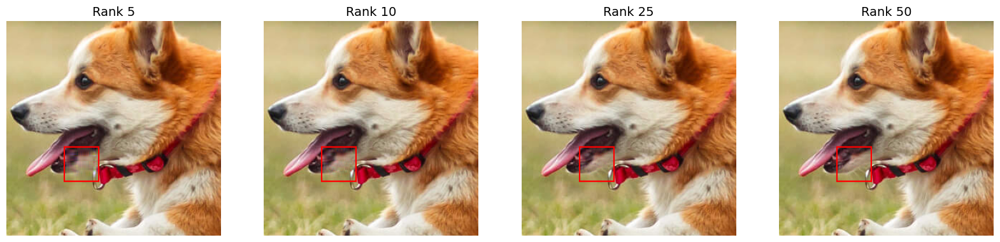

In [85]:
import torch
import torchvision
import matplotlib.pyplot as plt
from skimage.metrics import peak_signal_noise_ratio as psnr

# -----------------------------
# Helper Functions
# -----------------------------
def plot_side_by_side(images, titles, figsize=(20,6)):
    n = len(images)
    plt.figure(figsize=figsize)
    for i in range(n):
        plt.subplot(1, n, i+1)
        img_to_plot = images[i].detach().cpu()
        plt.imshow(img_to_plot)
        plt.title(titles[i], fontsize=14)
        plt.axis('off')
    plt.show()

def low_rank_gd_patch(patch, rank=5, lr=0.1, epochs=500):
    N, _, C = patch.shape
    reconstructed_patch = torch.zeros_like(patch)
    for c in range(C):
        channel_patch = patch[:,:,c]
        U = torch.randn(N, rank, requires_grad=True)
        V = torch.randn(rank, N, requires_grad=True)
        optimizer = torch.optim.Adam([U,V], lr=lr)
        for epoch in range(epochs):
            optimizer.zero_grad()
            recon = U @ V
            loss = ((recon - channel_patch)**2).mean()
            loss.backward()
            optimizer.step()
        reconstructed_patch[:,:,c] = (U @ V).detach()
    return reconstructed_patch

def add_red_border(img, x, y, patch_size=50, border_thickness=2):
    img_copy = img.clone()
    img_copy[y:y+border_thickness, x:x+patch_size, 0] = 1
    img_copy[y:y+border_thickness, x:x+patch_size, 1:] = 0
    img_copy[y+patch_size-border_thickness:y+patch_size, x:x+patch_size, 0] = 1
    img_copy[y+patch_size-border_thickness:y+patch_size, x:x+patch_size, 1:] = 0
    img_copy[y:y+patch_size, x:x+border_thickness, 0] = 1
    img_copy[y:y+patch_size, x:x+border_thickness, 1:] = 0
    img_copy[y:y+patch_size, x+patch_size-border_thickness:x+patch_size, 0] = 1
    img_copy[y:y+patch_size, x+patch_size-border_thickness:x+patch_size, 1:] = 0
    return img_copy

def compute_rmse(img_true, img_pred):
    return torch.sqrt(((img_true - img_pred)**2).mean()).item()

# -----------------------------
# Step 1: Load and crop image
# -----------------------------
img = torchvision.io.read_image("dog.jpg").float() / 255.0
x_crop, y_crop, h, w = 800, 600, 300, 300
cropped_img = img[:, y_crop:y_crop+h, x_crop:x_crop+w].permute(1,2,0)

# -----------------------------
# Step 2: Define patch 3
# -----------------------------
N = 50
x_patch, y_patch = 80, 175
ranks = [5, 10, 25, 50]

# -----------------------------
# Step 3: Reconstruct and analyze
# -----------------------------
patch = cropped_img[y_patch:y_patch+N, x_patch:x_patch+N, :]
print(f"Patch 3 at ({x_patch},{y_patch})")

reconstructed_images = []
titles = []
psnr_values = []
rmse_values = []

for r in ranks:
    recon_patch = low_rank_gd_patch(patch, rank=r, lr=0.1, epochs=500)
    img_recon = cropped_img.clone()
    img_recon[y_patch:y_patch+N, x_patch:x_patch+N, :] = recon_patch
    img_recon_with_border = add_red_border(img_recon, x_patch, y_patch, patch_size=N)
    reconstructed_images.append(img_recon_with_border)
    titles.append(f"Rank {r}")

    psnr_values.append(psnr(patch.numpy(), recon_patch.numpy(), data_range=1.0))
    rmse_values.append(compute_rmse(patch, recon_patch))

# Print metrics table
print("\nRank |    PSNR (dB)    |   RMSE")
print("-----------------------------------")
for i, r in enumerate(ranks):
    print(f"{r:<5}|  {psnr_values[i]:<15.4f}| {rmse_values[i]:<.4f}")

best_idx_psnr = psnr_values.index(max(psnr_values))
best_idx_rmse = rmse_values.index(min(rmse_values))
print(f"\nBest by PSNR: Rank {ranks[best_idx_psnr]} (PSNR={psnr_values[best_idx_psnr]:.2f} dB)")
print(f"Best by RMSE: Rank {ranks[best_idx_rmse]} (RMSE={rmse_values[best_idx_rmse]:.4f})")

# Plot side by side
plot_side_by_side(reconstructed_images, titles, figsize=(20,6))


# *Answer 5*

Epoch 200/2000, Loss: 0.3162
Epoch 400/2000, Loss: 0.3119
Epoch 600/2000, Loss: 0.3114
Epoch 800/2000, Loss: 0.3113
Epoch 1000/2000, Loss: 0.3113
Epoch 1200/2000, Loss: 0.3113
Epoch 1400/2000, Loss: 0.3113
Epoch 1600/2000, Loss: 0.3113
Epoch 1800/2000, Loss: 0.3113
Epoch 2000/2000, Loss: 0.3113

PyTorch Logistic Regression Accuracy: 0.8350
Sklearn Logistic Regression Accuracy: 0.8350


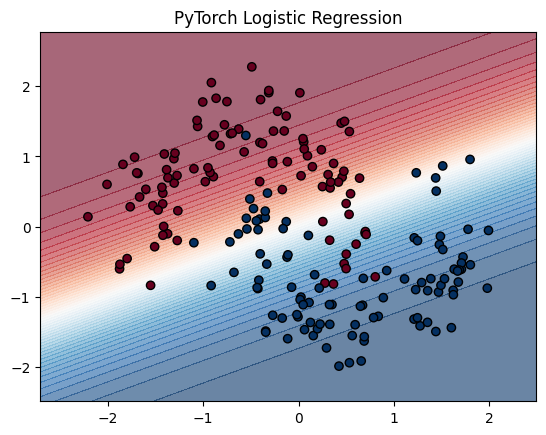

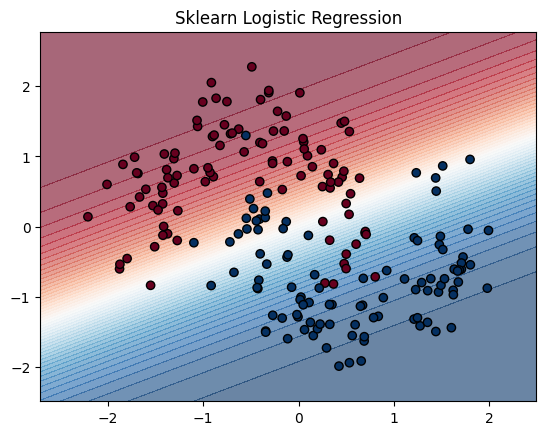

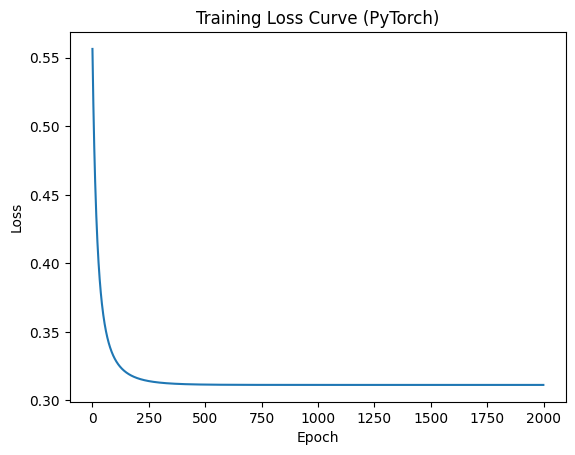

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_moons
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler

# -------------------------------
# Dataset
# -------------------------------
X, y = make_moons(n_samples=200, noise=0.2, random_state=42)
scaler = StandardScaler()
X = scaler.fit_transform(X)

X_tensor = torch.tensor(X, dtype=torch.float32)
y_tensor = torch.tensor(y, dtype=torch.float32).view(-1, 1)


# -------------------------------
# Custom Logistic Regression (PyTorch)
# -------------------------------
class LogisticTorch:
    def __init__(self, lr=0.01, epochs=1000):
        self.lr = lr
        self.epochs = epochs
        self.model = None
        self.losses = []

    def fit(self, X, y):
        n_features = X.shape[1]
        self.model = nn.Sequential(
            nn.Linear(n_features, 1),
            nn.Sigmoid()
        )

        criterion = nn.BCELoss()
        optimizer = optim.SGD(self.model.parameters(), lr=self.lr)

        for epoch in range(self.epochs):
            optimizer.zero_grad()
            y_pred = self.model(X)
            loss = criterion(y_pred, y)
            loss.backward()
            optimizer.step()
            self.losses.append(loss.item())

            # Optional: print progress every 200 epochs
            if (epoch + 1) % 200 == 0:
                print(f"Epoch {epoch+1}/{self.epochs}, Loss: {loss.item():.4f}")

    def predict_proba(self, X):
        with torch.no_grad():
            return self.model(X).numpy()

    def predict(self, X):
        probs = self.predict_proba(X)
        return (probs >= 0.5).astype(int)


# -------------------------------
# Train Custom Logistic Regression
# -------------------------------
torch_lr = LogisticTorch(lr=0.1, epochs=2000)
torch_lr.fit(X_tensor, y_tensor)

y_pred_torch = torch_lr.predict(X_tensor)
acc_torch = accuracy_score(y, y_pred_torch)
print(f"\nPyTorch Logistic Regression Accuracy: {acc_torch:.4f}")


# -------------------------------
# Compare with Scikit-learn
# -------------------------------
sk_lr = LogisticRegression()
sk_lr.fit(X, y)
y_pred_sk = sk_lr.predict(X)
acc_sk = accuracy_score(y, y_pred_sk)
print(f"Sklearn Logistic Regression Accuracy: {acc_sk:.4f}")


# -------------------------------
# Plot Decision Boundaries
# -------------------------------
def plot_decision_boundary(model, X, y, title, is_torch=False):
    x_min, x_max = X[:, 0].min() - 0.5, X[:, 0].max() + 0.5
    y_min, y_max = X[:, 1].min() - 0.5, X[:, 1].max() + 0.5
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 200),
                         np.linspace(y_min, y_max, 200))
    grid = np.c_[xx.ravel(), yy.ravel()]
    if is_torch:
        grid_t = torch.tensor(grid, dtype=torch.float32)
        probs = model.predict_proba(grid_t).reshape(xx.shape)
    else:
        probs = sk_lr.predict_proba(grid)[:, 1].reshape(xx.shape)

    plt.contourf(xx, yy, probs, levels=50, cmap="RdBu", alpha=0.6)
    plt.scatter(X[:, 0], X[:, 1], c=y, cmap="RdBu", edgecolors='k')
    plt.title(title)
    plt.show()


plot_decision_boundary(torch_lr, X, y, "PyTorch Logistic Regression", is_torch=True)
plot_decision_boundary(sk_lr, X, y, "Sklearn Logistic Regression")


# -------------------------------
# Plot Loss Curve
# -------------------------------
plt.plot(torch_lr.losses)
plt.title("Training Loss Curve (PyTorch)")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.show()


PyTorch Logistic Regression Accuracy: 0.835
sklearn Logistic Regression Accuracy: 0.850


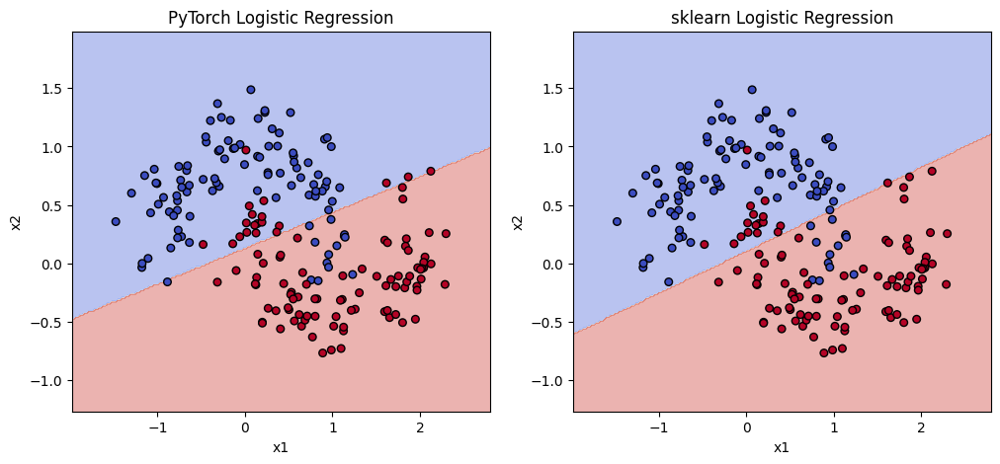

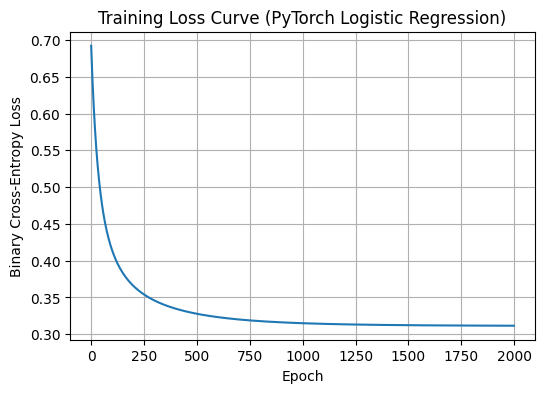

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_moons
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

# ==============================
# Dataset
# ==============================
X, y = make_moons(n_samples=200, noise=0.2, random_state=42)
X_tensor = torch.tensor(X, dtype=torch.float32)
y_tensor = torch.tensor(y, dtype=torch.float32).view(-1, 1)

# ==============================
# Logistic Regression in PyTorch
# ==============================
class LogisticTorch:
    def __init__(self, lr=0.01, epochs=1000):
        self.lr = lr
        self.epochs = epochs
        self.losses = []
        self.model = None

    def fit(self, X, y):
        n_features = X.shape[1]
        self.model = nn.Linear(n_features, 1)
        criterion = nn.BCEWithLogitsLoss()
        optimizer = optim.SGD(self.model.parameters(), lr=self.lr)

        for epoch in range(self.epochs):
            optimizer.zero_grad()
            outputs = self.model(X)
            loss = criterion(outputs, y)
            loss.backward()
            optimizer.step()
            self.losses.append(loss.item())

    def predict_proba(self, X):
        with torch.no_grad():
            logits = self.model(X)
            probs = torch.sigmoid(logits)
        return probs.numpy()

    def predict(self, X):
        probs = self.predict_proba(X)
        return (probs >= 0.5).astype(int)

# ==============================
# Train PyTorch Logistic Regression
# ==============================
torch_model = LogisticTorch(lr=0.1, epochs=2000)
torch_model.fit(X_tensor, y_tensor)
y_pred_torch = torch_model.predict(X_tensor)
acc_torch = accuracy_score(y, y_pred_torch)
print(f"PyTorch Logistic Regression Accuracy: {acc_torch:.3f}")

# ==============================
# Train sklearn Logistic Regression
# ==============================
sk_model = LogisticRegression()
sk_model.fit(X, y)
y_pred_sklearn = sk_model.predict(X)
acc_sklearn = accuracy_score(y, y_pred_sklearn)
print(f"sklearn Logistic Regression Accuracy: {acc_sklearn:.3f}")

# ==============================
# Plot Decision Boundaries
# ==============================
def plot_decision_boundary(model, X, y, title, pytorch_model=False):
    x_min, x_max = X[:, 0].min() - 0.5, X[:, 0].max() + 0.5
    y_min, y_max = X[:, 1].min() - 0.5, X[:, 1].max() + 0.5
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 200),
                         np.linspace(y_min, y_max, 200))
    grid = np.c_[xx.ravel(), yy.ravel()]

    if pytorch_model:
        preds = model.predict(torch.tensor(grid, dtype=torch.float32))
    else:
        preds = model.predict(grid)
    preds = preds.reshape(xx.shape)

    plt.contourf(xx, yy, preds, alpha=0.4, cmap=plt.cm.coolwarm)
    plt.scatter(X[:, 0], X[:, 1], c=y, s=30, cmap=plt.cm.coolwarm, edgecolors='k')
    plt.title(title)
    plt.xlabel('x1')
    plt.ylabel('x2')

plt.figure(figsize=(12,5))
plt.subplot(1,2,1)
plot_decision_boundary(torch_model, X, y, "PyTorch Logistic Regression", pytorch_model=True)
plt.subplot(1,2,2)
plot_decision_boundary(sk_model, X, y, "sklearn Logistic Regression")
plt.show()

# ==============================
# Plot Loss Curve
# ==============================
plt.figure(figsize=(6,4))
plt.plot(torch_model.losses)
plt.title("Training Loss Curve (PyTorch Logistic Regression)")
plt.xlabel("Epoch")
plt.ylabel("Binary Cross-Entropy Loss")
plt.grid(True)
plt.show()


PyTorch Logistic Regression Accuracy: 0.835
sklearn Logistic Regression Accuracy: 0.850


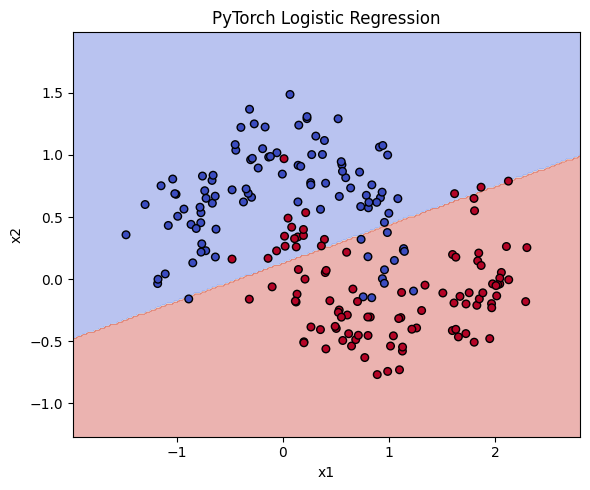

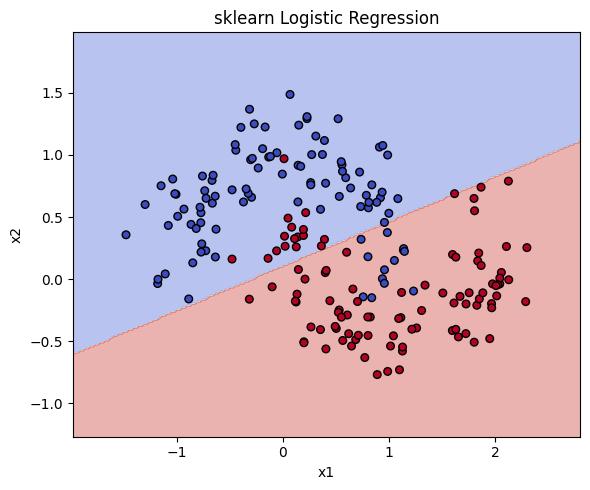

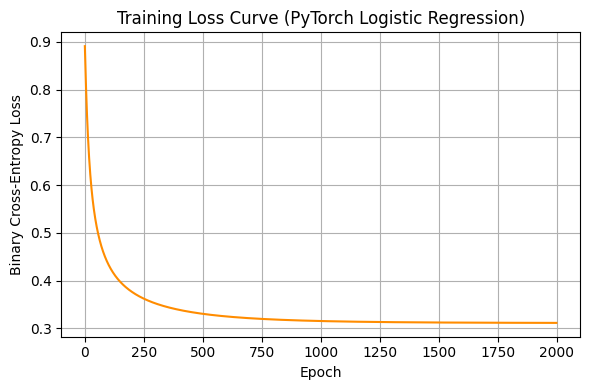


=== Summary ===
PyTorch Logistic Regression Accuracy: 0.835
sklearn Logistic Regression Accuracy: 0.850
Images saved as:
 - decision_boundary_pytorch.png
 - decision_boundary_sklearn.png
 - loss_curve.png


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_moons
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

# ==============================
# Dataset
# ==============================
X, y = make_moons(n_samples=200, noise=0.2, random_state=42)
X_tensor = torch.tensor(X, dtype=torch.float32)
y_tensor = torch.tensor(y, dtype=torch.float32).view(-1, 1)

# ==============================
# Logistic Regression (PyTorch)
# ==============================
class LogisticTorch:
    def __init__(self, lr=0.01, epochs=1000):
        self.lr = lr
        self.epochs = epochs
        self.losses = []
        self.model = None

    def fit(self, X, y):
        n_features = X.shape[1]
        self.model = nn.Linear(n_features, 1)
        criterion = nn.BCEWithLogitsLoss()
        optimizer = optim.SGD(self.model.parameters(), lr=self.lr)

        for epoch in range(self.epochs):
            optimizer.zero_grad()
            outputs = self.model(X)
            loss = criterion(outputs, y)
            loss.backward()
            optimizer.step()
            self.losses.append(loss.item())

    def predict_proba(self, X):
        with torch.no_grad():
            logits = self.model(X)
            probs = torch.sigmoid(logits)
        return probs.numpy()

    def predict(self, X):
        probs = self.predict_proba(X)
        return (probs >= 0.5).astype(int)

# ==============================
# Train PyTorch Logistic Regression
# ==============================
torch_model = LogisticTorch(lr=0.1, epochs=2000)
torch_model.fit(X_tensor, y_tensor)
y_pred_torch = torch_model.predict(X_tensor)
acc_torch = accuracy_score(y, y_pred_torch)
print(f"PyTorch Logistic Regression Accuracy: {acc_torch:.3f}")

# ==============================
# Train sklearn Logistic Regression
# ==============================
sk_model = LogisticRegression()
sk_model.fit(X, y)
y_pred_sklearn = sk_model.predict(X)
acc_sklearn = accuracy_score(y, y_pred_sklearn)
print(f"sklearn Logistic Regression Accuracy: {acc_sklearn:.3f}")

# ==============================
# Function to Plot Decision Boundary
# ==============================
def plot_decision_boundary(model, X, y, title, pytorch_model=False):
    x_min, x_max = X[:, 0].min() - 0.5, X[:, 0].max() + 0.5
    y_min, y_max = X[:, 1].min() - 0.5, X[:, 1].max() + 0.5
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 200),
                         np.linspace(y_min, y_max, 200))
    grid = np.c_[xx.ravel(), yy.ravel()]

    if pytorch_model:
        preds = model.predict(torch.tensor(grid, dtype=torch.float32))
    else:
        preds = model.predict(grid)
    preds = preds.reshape(xx.shape)

    plt.contourf(xx, yy, preds, alpha=0.4, cmap=plt.cm.coolwarm)
    plt.scatter(X[:, 0], X[:, 1], c=y, s=30, cmap=plt.cm.coolwarm, edgecolors='k')
    plt.title(title)
    plt.xlabel('x1')
    plt.ylabel('x2')

# ==============================
# Plot and Save Decision Boundary (PyTorch)
# ==============================
plt.figure(figsize=(6,5))
plot_decision_boundary(torch_model, X, y, "PyTorch Logistic Regression", pytorch_model=True)
plt.tight_layout()
plt.savefig("decision_boundary_pytorch.png", dpi=300)
plt.show()

# ==============================
# Plot and Save Decision Boundary (sklearn)
# ==============================
plt.figure(figsize=(6,5))
plot_decision_boundary(sk_model, X, y, "sklearn Logistic Regression")
plt.tight_layout()
plt.savefig("decision_boundary_sklearn.png", dpi=300)
plt.show()

# ==============================
# Plot and Save Loss Curve
# ==============================
plt.figure(figsize=(6,4))
plt.plot(torch_model.losses, color='darkorange')
plt.title("Training Loss Curve (PyTorch Logistic Regression)")
plt.xlabel("Epoch")
plt.ylabel("Binary Cross-Entropy Loss")
plt.grid(True)
plt.tight_layout()
plt.savefig("loss_curve.png", dpi=300)
plt.show()

# ==============================
# Report Summary
# ==============================
print("\n=== Summary ===")
print(f"PyTorch Logistic Regression Accuracy: {acc_torch:.3f}")
print(f"sklearn Logistic Regression Accuracy: {acc_sklearn:.3f}")
print("Images saved as:")
print(" - decision_boundary_pytorch.png")
print(" - decision_boundary_sklearn.png")
print(" - loss_curve.png")


PyTorch Logistic Regression Accuracy: 0.835
sklearn Logistic Regression Accuracy: 0.850


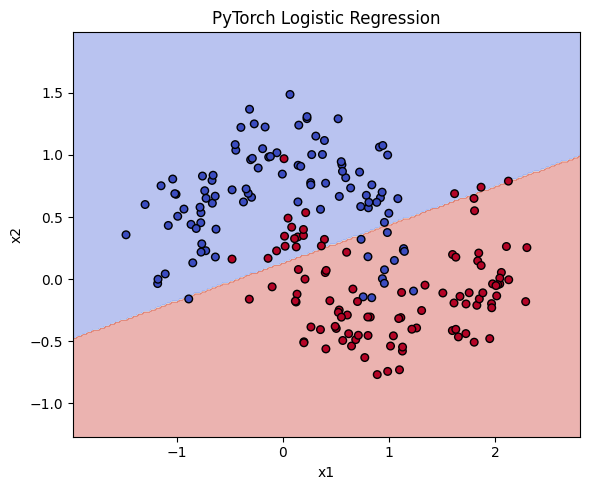

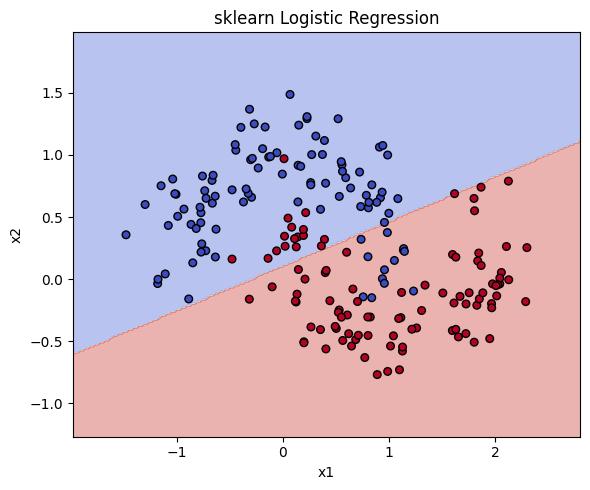

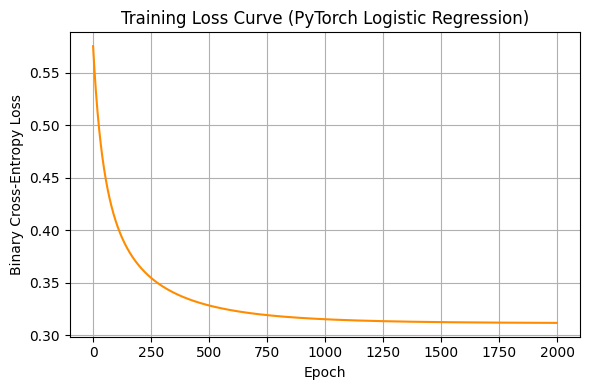


=== Summary ===
PyTorch Logistic Regression Accuracy: 0.835
sklearn Logistic Regression Accuracy: 0.850
Images saved as:
 - decision_boundary_pytorch.png
 - decision_boundary_sklearn.png
 - loss_curve.png


In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import numpy as np
import matplotlib.pyplot as plt
from sklearn.datasets import make_moons
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

# ==============================
# Dataset
# ==============================
X, y = make_moons(n_samples=200, noise=0.2, random_state=42)
X_tensor = torch.tensor(X, dtype=torch.float32)
y_tensor = torch.tensor(y, dtype=torch.float32).view(-1, 1)

# ==============================
# Logistic Regression (PyTorch)
# ==============================
class LogisticTorch:
    def __init__(self, lr=0.01, epochs=2000):
        self.lr = lr
        self.epochs = epochs
        self.losses = []
        self.model = None

    def fit(self, X, y):
        n_features = X.shape[1]
        self.model = nn.Linear(n_features, 1)
        criterion = nn.BCEWithLogitsLoss()
        optimizer = optim.SGD(self.model.parameters(), lr=self.lr)

        for epoch in range(self.epochs):
            optimizer.zero_grad()
            outputs = self.model(X)
            loss = criterion(outputs, y)
            loss.backward()
            optimizer.step()
            self.losses.append(loss.item())

    def predict_proba(self, X):
        with torch.no_grad():
            logits = self.model(X)
            probs = torch.sigmoid(logits)
        return probs.numpy()

    def predict(self, X):
        probs = self.predict_proba(X)
        return (probs >= 0.5).astype(int)

# ==============================
# Train PyTorch Logistic Regression
# ==============================
torch_model = LogisticTorch(lr=0.1, epochs=2000)
torch_model.fit(X_tensor, y_tensor)
y_pred_torch = torch_model.predict(X_tensor)
acc_torch = accuracy_score(y, y_pred_torch)
print(f"PyTorch Logistic Regression Accuracy: {acc_torch:.3f}")

# ==============================
# Train sklearn Logistic Regression
# ==============================
sk_model = LogisticRegression()
sk_model.fit(X, y)
y_pred_sklearn = sk_model.predict(X)
acc_sklearn = accuracy_score(y, y_pred_sklearn)
print(f"sklearn Logistic Regression Accuracy: {acc_sklearn:.3f}")

# ==============================
# Function to Plot Decision Boundary
# ==============================
def plot_decision_boundary(model, X, y, title, pytorch_model=False):
    x_min, x_max = X[:, 0].min() - 0.5, X[:, 0].max() + 0.5
    y_min, y_max = X[:, 1].min() - 0.5, X[:, 1].max() + 0.5
    xx, yy = np.meshgrid(np.linspace(x_min, x_max, 200),
                         np.linspace(y_min, y_max, 200))
    grid = np.c_[xx.ravel(), yy.ravel()]

    if pytorch_model:
        preds = model.predict(torch.tensor(grid, dtype=torch.float32))
    else:
        preds = model.predict(grid)
    preds = preds.reshape(xx.shape)

    plt.contourf(xx, yy, preds, alpha=0.4, cmap=plt.cm.coolwarm)
    plt.scatter(X[:, 0], X[:, 1], c=y, s=30, cmap=plt.cm.coolwarm, edgecolors='k')
    plt.title(title)
    plt.xlabel('x1')
    plt.ylabel('x2')

# ==============================
# Plot and Save Decision Boundary (PyTorch)
# ==============================
plt.figure(figsize=(6,5))
plot_decision_boundary(torch_model, X, y, "PyTorch Logistic Regression", pytorch_model=True)
plt.tight_layout()
plt.savefig("decision_boundary_pytorch.png", dpi=300)
plt.show()

# ==============================
# Plot and Save Decision Boundary (sklearn)
# ==============================
plt.figure(figsize=(6,5))
plot_decision_boundary(sk_model, X, y, "sklearn Logistic Regression")
plt.tight_layout()
plt.savefig("decision_boundary_sklearn.png", dpi=300)
plt.show()

# ==============================
# Plot and Save Loss Curve
# ==============================
plt.figure(figsize=(6,4))
plt.plot(torch_model.losses, color='darkorange')
plt.title("Training Loss Curve (PyTorch Logistic Regression)")
plt.xlabel("Epoch")
plt.ylabel("Binary Cross-Entropy Loss")
plt.grid(True)
plt.tight_layout()
plt.savefig("loss_curve.png", dpi=300)
plt.show()

# ==============================
# Report Summary
# ==============================
print("\n=== Summary ===")
print(f"PyTorch Logistic Regression Accuracy: {acc_torch:.3f}")
print(f"sklearn Logistic Regression Accuracy: {acc_sklearn:.3f}")
print("Images saved as:")
print(" - decision_boundary_pytorch.png")
print(" - decision_boundary_sklearn.png")
print(" - loss_curve.png")
